In [1]:
from IPython.core.interactiveshell import InteractiveShell
import time

old_run_cell = InteractiveShell.run_cell

def timing_run_cell(self, raw_cell, *args, **kwargs):
    t0 = time.time()
    result = old_run_cell(self, raw_cell, *args, **kwargs)
    t1 = time.time()
    print(f"Execution time: {t1 - t0:.4f} seconds")
    return result

InteractiveShell.run_cell = timing_run_cell

In [2]:
import os
os.environ["JAX_PLATFORMS"] = "cpu"
# os.environ["XLA_FLAGS"] = "--xla_force_host_platform_device_count=1"
os.environ["XLA_FLAGS"] = "--xla_force_host_platform_device_count=8"
#os.environ["CUDA_VISIBLE_DEVICES"] = ""

import jax
print("backend:", jax.default_backend())
print("devices:", jax.devices())

backend: cpu
devices: [CpuDevice(id=0), CpuDevice(id=1), CpuDevice(id=2), CpuDevice(id=3), CpuDevice(id=4), CpuDevice(id=5), CpuDevice(id=6), CpuDevice(id=7)]
Execution time: 2.8016 seconds


# Import packages

In [3]:
from matplotlib.pyplot import figure, show
import matplotlib.pyplot as plt
import numpy as np
#import sys
import emcee
from functools import partial
import corner
import os
#import pickle
import scipy.integrate as spint
from scipy.special import gammainc, gamma
import scipy.interpolate as spl
import scipy.special as special
import itertools
import jax.numpy as jnp
import jax.lax as lax
#import jax.scipy as jsp
import blackjax
from multiprocessing import Pool
from jax import config
config.update("jax_enable_x64", True)
import pandas as pd
from decimal import Decimal, getcontext
import scipy.optimize as optimize
import matplotlib as mpl
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.cm as cm
import matplotlib.colors as mcolors
from matplotlib.animation import FuncAnimation, PillowWriter
from fractions import Fraction
# import multiprocessing as mp
from concurrent.futures import ProcessPoolExecutor
from concurrent.futures import ThreadPoolExecutor
import multiprocess as mp
from loky import get_reusable_executor

/Users/andreacosta/venvs/mlenv/lib/python3.11/site-packages/arviz/__init__.py:39: FutureWarning: 
ArviZ is undergoing a major refactor to improve flexibility and extensibility while maintaining a user-friendly interface.
Some upcoming changes may be backward incompatible.
For details and migration guidance, visit: https://python.arviz.org/en/latest/user_guide/migration_guide.html
  warn(


Execution time: 4.0025 seconds


In [4]:
# show JAX device that is being used
print(jax.devices())

[CpuDevice(id=0), CpuDevice(id=1), CpuDevice(id=2), CpuDevice(id=3), CpuDevice(id=4), CpuDevice(id=5), CpuDevice(id=6), CpuDevice(id=7)]
Execution time: 0.0002 seconds


# Load Observational Data

In [ ]:
BARY = pd.read_csv('../data/baryons.csv')
TOTAL = pd.read_csv('../data/galaxies_total_sample.csv')

BARY['Mass(Msun)'] =  pd.to_numeric(BARY['Mass(Msun)'], errors='coerce')
BARY['e_Mass(Msun)'] =  pd.to_numeric(BARY['e_Mass(Msun)'], errors='coerce')
BARY['j'] =  pd.to_numeric(BARY['j'], errors='coerce')
BARY['e_j'] =  pd.to_numeric(BARY['e_j'], errors='coerce')
BARY['fgas'] =  pd.to_numeric(BARY['fgas'], errors='coerce')
BARY['e_fgas'] =  pd.to_numeric(BARY['e_fgas'], errors='coerce')

TOTAL['Mstar'] =  pd.to_numeric(TOTAL['Mstar'], errors='coerce')
TOTAL['e_Mstar'] =  pd.to_numeric(TOTAL['e_Mstar'], errors='coerce')
TOTAL['Mgas'] =  pd.to_numeric(TOTAL['Mgas'], errors='coerce')
TOTAL['e_Mgas'] =  pd.to_numeric(TOTAL['e_Mgas'], errors='coerce')
TOTAL['jstar'] =  pd.to_numeric(TOTAL['jstar'], errors='coerce')
TOTAL['e_jstar'] =  pd.to_numeric(TOTAL['e_jstar'], errors='coerce')
TOTAL['jgas'] =  pd.to_numeric(TOTAL['jgas'], errors='coerce')
TOTAL['e_jgas'] =  pd.to_numeric(TOTAL['e_jgas'], errors='coerce')

obs_log_Mbar = np.log10(BARY['Mass(Msun)'].values.copy())
obs_log_Mbar_errors = BARY['e_Mass(Msun)'].values.copy()/BARY['Mass(Msun)'].values.copy()
obs_log_Mgas = np.log10(TOTAL['Mgas'].values.copy())
obs_log_Mgas_errors = TOTAL['e_Mgas'].values.copy()/TOTAL['Mgas'].values.copy()
obs_log_Mstar = np.log10(TOTAL['Mstar'].values.copy())
obs_log_Mstar_errors = TOTAL['e_Mstar'].values.copy()/TOTAL['Mstar'].values.copy()
obs_log_jbar = np.log10(BARY['j'].values.copy())
obs_log_jbar_errors = BARY['e_j'].values.copy()/BARY['j'].values.copy()
obs_log_jgas = np.log10(TOTAL['jgas'].values.copy())
obs_log_jgas_errors = TOTAL['e_jgas'].values.copy()/TOTAL['jgas'].values.copy()
obs_log_jstar = np.log10(TOTAL['jstar'].values.copy())
obs_log_jstar_errors = TOTAL['e_jstar'].values.copy()/TOTAL['jstar'].values.copy()
obs_fgas = BARY['fgas'].values.copy()
obs_fgas_errors = BARY['e_fgas'].values.copy()
obs_fgas_but_for_stars_and_gas = TOTAL['Mgas'].values.copy()/(TOTAL['Mgas'].values.copy() + TOTAL['Mstar'].values.copy())
obs_fgas_but_for_stars_and_gas_errors = np.sqrt( (TOTAL['e_Mgas'].values.copy()/(TOTAL['Mgas'].values.copy() + TOTAL['Mstar'].values.copy()))**2 + (TOTAL['Mgas'].values.copy()*TOTAL['e_Mstar'].values.copy()/((TOTAL['Mgas'].values.copy() + TOTAL['Mstar'].values.copy())**2))**2 )

pavel_dir = '../data/compilation_AM_others/'

pavel_data = {}
for filename in os.listdir(pavel_dir):
    if filename.endswith('.csv'):
        filepath = os.path.join(pavel_dir, filename)
        df = pd.read_csv(filepath)
        df_name = os.path.splitext(filename)[0]
        print(df_name)
        pavel_data[df_name] = df

HIX_data = pavel_data['HIX']

# HIX_logMstar = np.array([10.5, 10.7, 10.5, 10.5, 10.3, 10.2,  9.8, 10.1, 10.1, 10.1, 10.6, 10.5])
# HIX_logMHI = np.log10(1.4 * 10**np.array([10.6, 10.7, 10.5, 10.5, 10.4, 10.3,  9.9, 10.3, 10.4, 10.3, 10.9, 10.5]))
# HIX_logMbar = np.log10(10**HIX_logMstar + 10**HIX_logMHI)
# HIX_fgas = (10**HIX_logMHI)/(10**HIX_logMbar)
# HIX_jbar = np.array([4125.6, 3523.8, 5453.1, 4092.4, 3522.7, 3749.8, 1993. , 3196.7, 3388.2, 6377.8, 9764. , 4117.7])

GLSBs
Superthin
UDGs
Superspirals
HIX
Dwarfs
Execution time: 0.0261 seconds


In [6]:
CB_color_cycle = ['#377eb8', '#ff7f00', '#4daf4a',
                  '#f781bf', '#a65628', '#984ea3',
                  '#999999', '#e41a1c', '#dede00']

Execution time: 0.0002 seconds


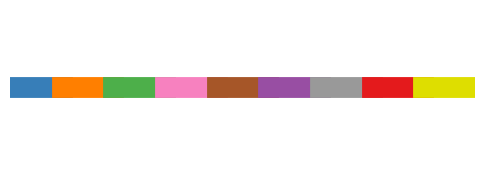

Execution time: 0.0627 seconds


In [7]:
# show CB_color_cycle on a plot
fig, ax = plt.subplots(figsize=(6, 2))
for i, color in enumerate(CB_color_cycle):
    ax.plot([i, i+1], [1, 1], color=color, linewidth=15)
ax.set_xlim(0, len(CB_color_cycle))
ax.set_ylim(0, 2)
ax.axis('off')
plt.show()

# Model definition

$j_{acc}(t) = 2v_{rot}(t)r_{acc}(t) \rightarrow r_{acc}(t) = \frac{j_{acc}(t)}{2 v_{rot}(t)}$ where $j_{acc}(t)=j_{min}+ k\cdot (j_{max}-j_{min}) \left( \frac{t}{t_0} \right)^n$ (start with n=1), and $v_{rot}(t) = \left( \frac{M_{bar}(t_0)}{A_G} \right)^{1/4}$

1) Determine $r_{acc}$ by determining $j_{acc}(t)$ and $v_{rot}(t)$:

   a) Determine $M_{bar}(t)$ from $M_{bar}(t) = \int_0^t Ce^{\frac{t'}{t_{acc}}} \,dt$.  This gives $v_{rot}(t)$.
   
   b) Determine $j_{max}$ from $\log(j_{max}(M_{bar})) = 0.73\log(M_{bar})-4.25$ (as $j_{max}$ is when $f_{gas}=1 \rightarrow \log(f_{gas})=0$)
   
   c) Determine $j_{acc}(t)$ from $j_{max}(M_{bar})$
   
2) Solve $\frac{\mathrm{d} \Sigma_{gas}(t,R)}{\mathrm{d} t} = \frac{C}{2 \pi r_{acc}(t)^2} e^{-\frac{t}{t_{acc}}} e^{-\frac{R}{r_{acc}(t)}} - A(1-\Re) \Sigma_{gas}^N(t,R)$ given $r_{acc}(t)$ from above

## 1) Determine $𝑟_{𝑎𝑐𝑐}$  by determining  $𝑗_{𝑎𝑐𝑐}(𝑡)$  and  $𝑣_{𝑟𝑜𝑡}(𝑡)$

### a) Determine $M_{bar}(t)$ from $M_{bar}(t) = \int_0^t Ce^{\frac{t'}{t_{acc}}} \,dt$

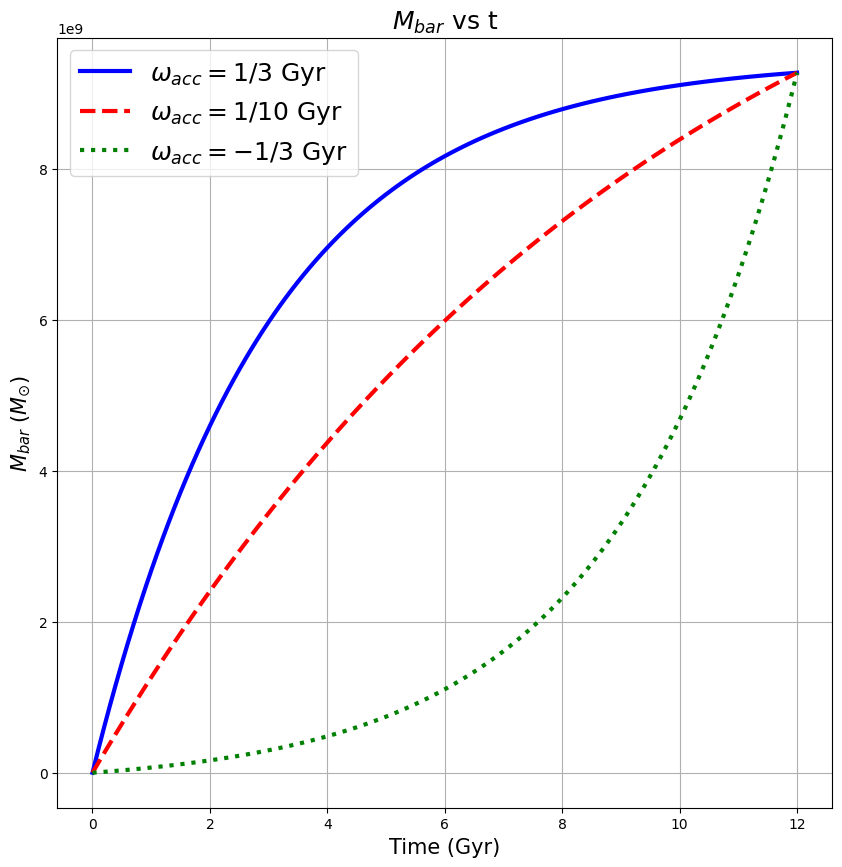

Execution time: 0.1176 seconds


In [8]:
dt=0.1
M_times = np.arange(0,12.1,dt)

def C_def(M_bar, t_acc, t0=12.):
    """Returns the normalization constant by imposing a value of the baryonic mass at a given
    time and accretion timescale. Default time is taken as today, t_0 = 12Gyr."""
    if (t_acc==np.inf):
        return M_bar/t0
    elif (t_acc<0):
        return M_bar/(abs(t_acc)*(np.exp(t0/abs(t_acc))-1))
    else:
        return M_bar/(t_acc*(1-np.exp(-t0/t_acc)))

def M_def(M_bar, t_acc, t=M_times, dt=dt):
    """Returns the baryonic mass predicted from the accreting mass having an exponential form in time."""
    C = C_def(M_bar, t_acc)
    if (t_acc==np.inf):
        return C*t
    elif (t_acc<0):
        return C*abs(t_acc)*(np.exp(t/abs(t_acc))-1)
    else:
        return C*t_acc*(1-np.exp(-t/t_acc))

t_acc = np.array([3.,10.,-3.]) #GYr
colors = ['b', 'r', 'g']
styles = ['solid', 'dashed', 'dotted']

M_bar_t0 = 9.27e9
M_bar_array = np.zeros((len(t_acc),len(M_times)))
for i, t_accr in enumerate(t_acc):
    M_bar_array[i] = M_def(M_bar_t0, t_accr)

fig = figure(figsize=(10,10), facecolor='w')
frame = fig.add_subplot(1,1,1)
for i, t_accr, col, sty in zip(range(3), t_acc, colors, styles):
    frame.plot(M_times, M_bar_array[i], label = fr"$\omega_{{acc}} = {Fraction(1,int(t_accr))}$ Gyr", color=col, linestyle=sty, lw=3)
frame.set_title(r"$M_{bar}$ vs t", fontsize = 18)
frame.set_xlabel(r"Time (Gyr)", fontsize = 15)
frame.set_ylabel(r"$M_{bar}$ $(M_{\odot})$", fontsize = 15)
frame.legend(prop={'size': 18})
frame.grid()
show()
pd.DataFrame(M_bar_array.T, columns=['t_acc=3Gyr', 't_acc=10Gyr', 't_acc=25Gyr']).to_csv('../data/data9_JAX_aKSL/M_bar_vs_'+f'{np.log10(M_bar_t0)}'+'.csv')
fig.savefig('../outputs/graphs10_JAX_aKSL/M_bar vs time (t_acc variation).png')

### a) i) Find $v_{BTFR}$ from $M_{bar}$ (constant in time)

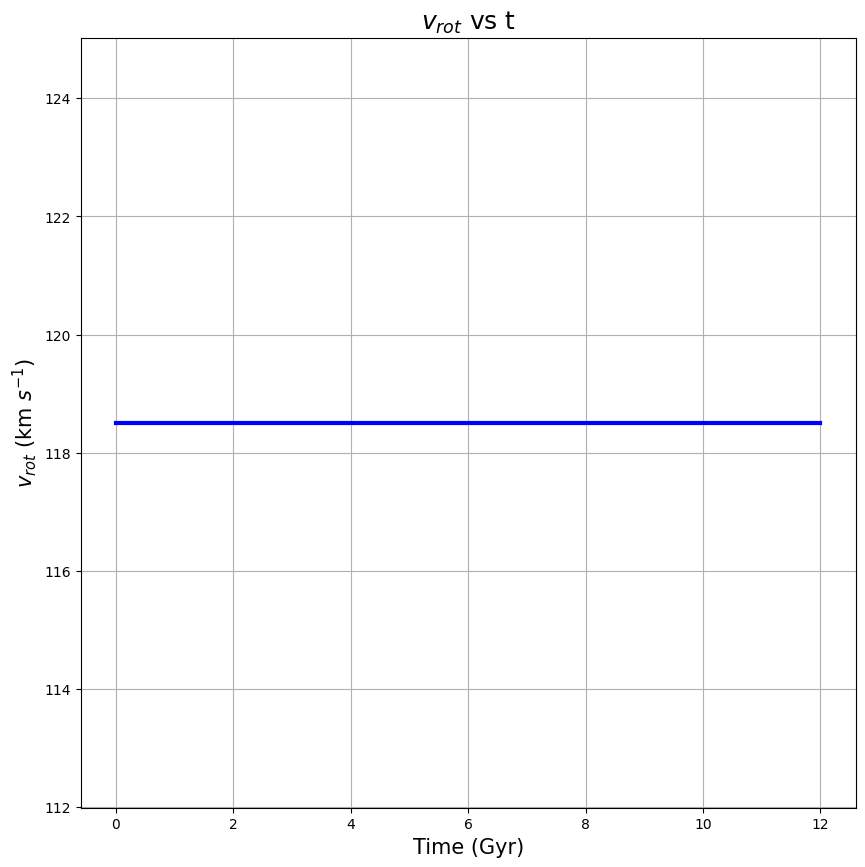

Execution time: 0.1109 seconds


In [9]:
def v_btfr_def(M_bar, Ag=47):
    """Returns the value of the velocity from the baryonic Tully-Fisher relation. The default constant
    value Ag is taken from McGaugh (2012)."""
    return (M_bar/Ag)**0.25

Ag = 47 #M_{\odot} km^{-4} s^{-4}
M_bar_allsame = np.full(M_bar_array[0].shape, M_bar_t0)
v_btfr_array = v_btfr_def(M_bar_allsame)
#print(v_rot_array)

fig = figure(figsize=(10,10), facecolor='w')
frame = fig.add_subplot(1,1,1)
frame.plot(M_times, v_btfr_array, color="blue", lw=3)
frame.set_title(r"$v_{rot}$ vs t", fontsize = 18)
frame.set_xlabel("Time (Gyr)", fontsize = 15)
frame.set_ylabel(r"$v_{rot}$ (km $s^{-1}$)", fontsize = 15)
#frame.legend(prop={'size': 18})
frame.grid()
show()
np.savetxt('../data/data9_JAX_aKSL/v_rot_vs_t_'+f'{np.log10(M_bar_t0)}'+'.txt', v_btfr_array)
fig.savefig('../outputs/graphs10_JAX_aKSL/v_btfr vs time (t_acc variation).png')

### b) Determine $j_{max}$ from $\log(j_{max}(M_{bar})) = 0.73\log(M_{bar})-4.25$

In [10]:
def j_maxer(Mbar):
    """Returns the maximum value of the accreting angular momentum. This is determined empirically, by 
    utilizing the fit found by Mancera-Piña et al. (2021), and setting f_gas = 1. This is because the
    theoretical maximum accreting angular momentum should fall where there is maximum gas, in the outer-most
    regions of the galaxy."""
    return (Mbar**0.73)*10**(-4.25)

j_max = (M_bar_t0**0.73)*10**(-4.25)
print(j_max)

1061.6178348386752
Execution time: 0.0005 seconds


### c) Determine $j_{acc}(t)$ from $j_{max}(M_{bar})$


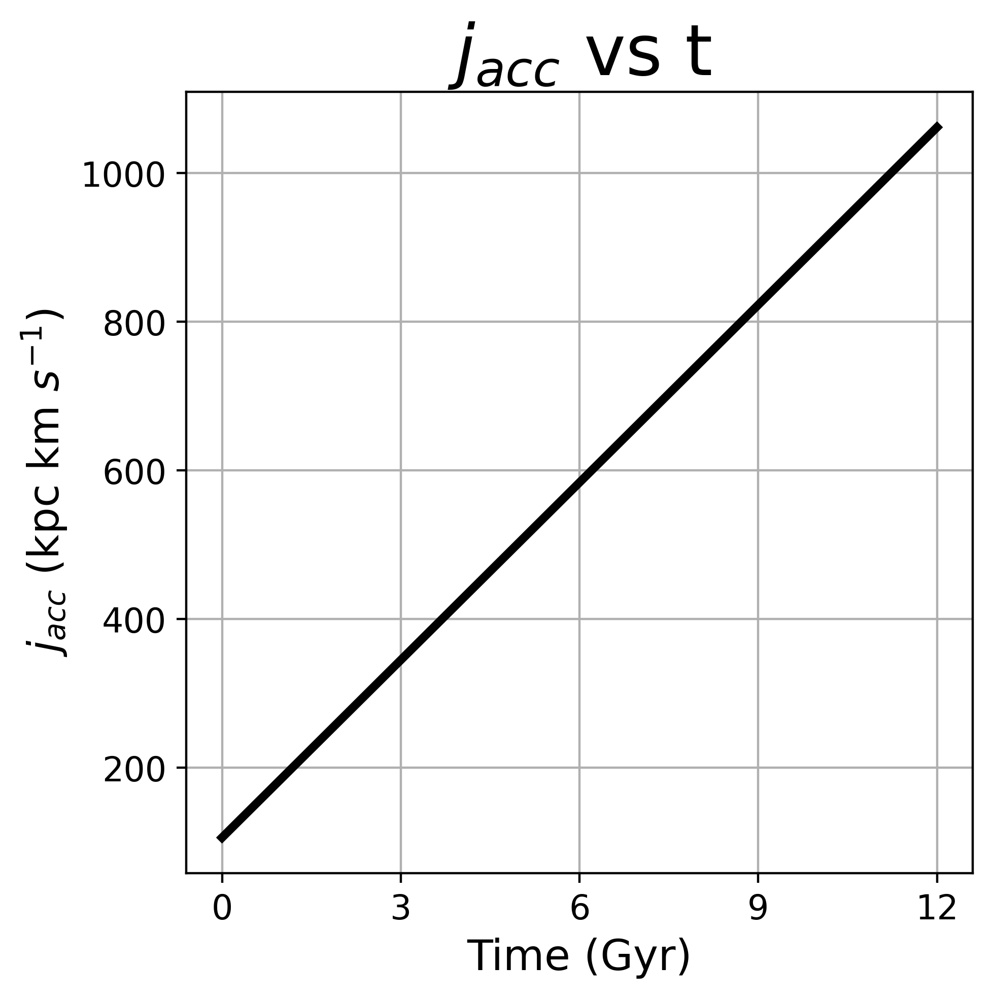

Execution time: 0.1344 seconds


In [11]:
def j_acc_def(j_max, t, t0=12, n=1, con=1):
    """Determines the accreting specific angular momentum given j_max, the velocity from the BTFR, at any
    given time. The minimum angular momentum is determined by dividing j_max by 10."""
    #r_acc_min = (10**(0.385*(np.log10(Mbar)-10)+0.281))/5
    j_min = j_max/10.
    return j_min+(con*j_max-j_min)*(t/t0)**n

ki=1
j_acc_array = j_acc_def(j_max, M_times, con=ki)

fig = figure(figsize=(5,5), dpi=400, facecolor='w')
frame = fig.add_subplot(1,1,1)
frame.plot(M_times, j_acc_array, color="k", lw=3)
frame.set_title(r"$j_{acc}$ vs t", fontsize = 25)
frame.set_xlabel("Time (Gyr)", fontsize = 15)
frame.set_ylabel(r"$j_{acc}$ (kpc km $s^{-1}$)", fontsize = 15)
#frame.legend(prop={'size': 18})
frame.tick_params(labelsize=12)
frame.set_xticks([0, 3, 6, 9, 12])
frame.grid()
show()
np.savetxt('../data/data9_JAX_aKSL/j_acc_vs_t_'+f'{np.log10(M_bar_t0)}'+'.txt', j_acc_array)
fig.savefig('../outputs/graphs10_JAX_aKSL/j_acc vs time (t_acc variation).png')

### d) Determine $r_{BTFR}(t)$ from $j_{acc}(t) = 2v_{flat} \left( r_{acc} - \frac{R_v^3 r_{acc}}{(R_v+r_{acc})^3} \right)$

In [12]:

def rv_def(M_bar, kpc=True):
    if kpc:
        return -0.005034150233993362*v_btfr_def(M_bar)+2.6658196850679956
    else:
        return -5.034150233993362*v_btfr_def(M_bar)+2665.8196850679956

rv_def(10**10)

2.0578223054087963

Execution time: 0.0010 seconds


In [13]:
def interp1d_jax(x_grid, y_grid, x):
    """
    Simple linear interpolation in JAX, assuming x_grid is 1D and sorted.
    Extrapolation: clamp slope using the edge segments.
    """
    x_grid = jnp.asarray(x_grid)
    y_grid = jnp.asarray(y_grid)

    # Find index i so that x_grid[i] <= x < x_grid[i+1]
    idx = jnp.searchsorted(x_grid, x, side="right") - 1
    idx = jnp.clip(idx, 0, x_grid.size - 2)

    x0 = x_grid[idx]
    x1 = x_grid[idx + 1]
    y0 = y_grid[idx]
    y1 = y_grid[idx + 1]

    w = (x - x0) / (x1 - x0)
    return y0 + w * (y1 - y0)

Execution time: 0.0005 seconds


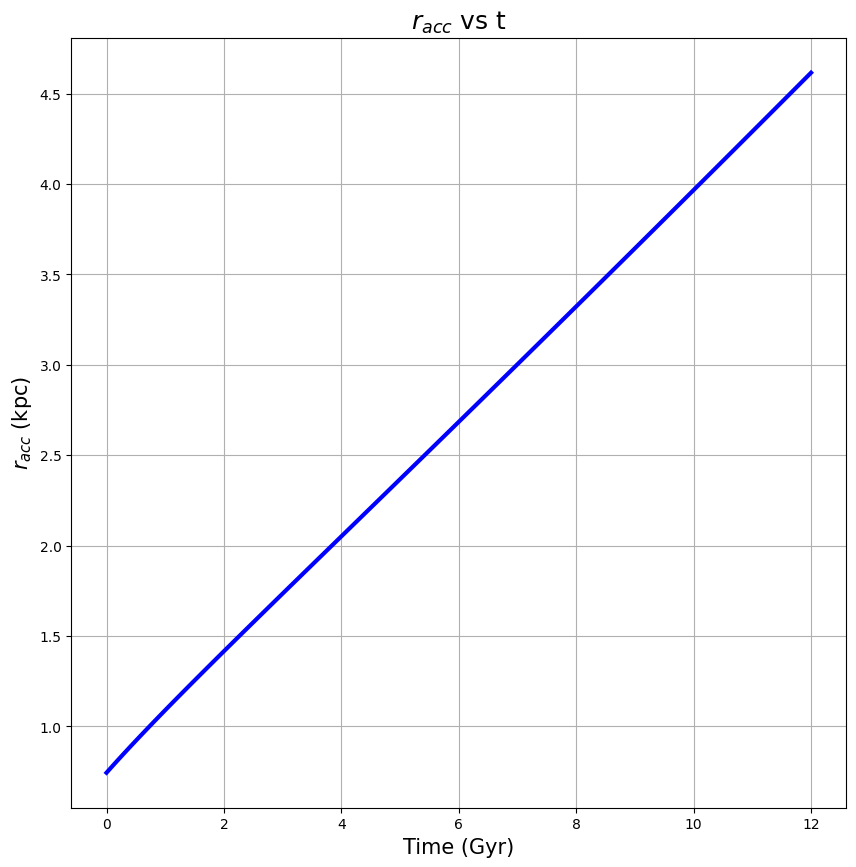

Execution time: 0.0647 seconds


In [14]:
def analytical_r(x, c, y):
    return x - (c**3 * x) / (c + x)**3 - y

def r_btfr_def(M_bar, j_acc, init=1.0):
    
    rv = rv_def(M_bar, kpc=True)
    yer = j_acc / (2*v_btfr_def(M_bar))
    if hasattr(yer, '__len__'):
        r_acc = []
        for i in range(len(j_acc)):
            r_acc.append(optimize.newton(analytical_r, init, args=(rv[i], yer[i])))
        return np.array(r_acc)
    else:
        return optimize.newton(analytical_r, init, args=(rv, yer))

r_btfr_array = r_btfr_def(M_bar_allsame, j_acc_array)

fig = figure(figsize=(10,10), facecolor='w')
frame = fig.add_subplot(1,1,1)
frame.plot(M_times, r_btfr_array, color="blue", lw=3)
frame.set_title(r"$r_{acc}$ vs t", fontsize = 18)
frame.set_xlabel("Time (Gyr)", fontsize = 15)
frame.set_ylabel(r"$r_{acc}$ (kpc)", fontsize = 15)
#frame.legend(prop={'size': 18})
frame.grid()
show()
np.savetxt('../data/data9_JAX_aKSL/r_acc_vs_t_'+f'{np.log10(M_bar_t0)}'+'.txt', r_btfr_array)
fig.savefig('../outputs/graphs10_JAX_aKSL/r_acc vs time (t_acc variation).png')

### e) Analytical $j_{bar}$

/var/folders/hz/s07cwl6d5_v5tr1l0jp_v5dr0000gn/T/ipykernel_94638/3087275908.py:5: RuntimeWarning: divide by zero encountered in divide
  return dt*np.cumsum(acc_j*M_dot_bar)/bar_mass


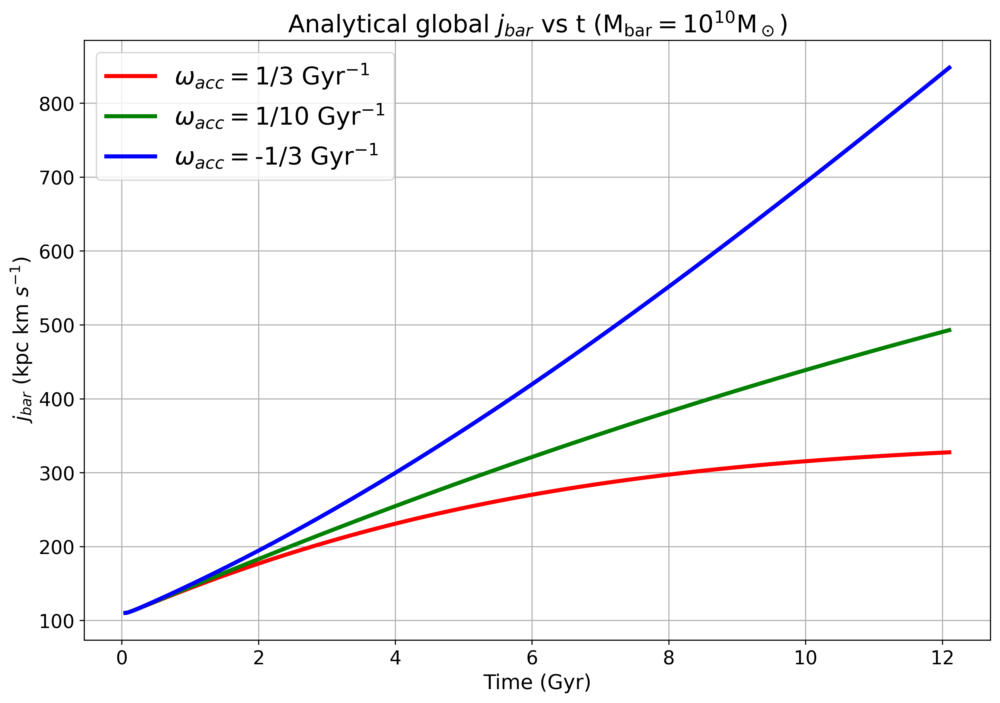

Execution time: 0.4456 seconds


In [15]:
def j_bar_analytical(t, Mbar, t_acc, dt=0.1):
    bar_mass = M_def(Mbar, t_acc, t)
    M_dot_bar = C_def(Mbar, t_acc)*np.exp(-t/t_acc)
    acc_j = j_acc_def(j_maxer(Mbar), t)
    return dt*np.cumsum(acc_j*M_dot_bar)/bar_mass

colorz = ['r', 'g', 'b']
stylez = ['dashed', 'dotted', 'solid']

M_times1 = np.arange(0,12.2,0.1)
M_times2 = np.arange(0, 12.101, 0.001)
j_bar_array_analytical = np.zeros((len(t_acc),len(M_times2)))
for i, t_accr in enumerate(t_acc):
    j_bar_array_analytical[i] = j_bar_analytical(M_times2, M_bar_t0, t_accr, dt=0.001)
    
fig = figure(figsize=(12,8), dpi=400, facecolor='w')
frame = fig.add_subplot(1,1,1)
for i, t_accr, col, sty in zip(range(3), t_acc, colorz, stylez):
    frame.plot(M_times2[53:], j_bar_array_analytical[i][53:], label = r"$\omega_{acc} = $"+f"{Fraction(1,int(t_accr))} Gyr$^{{-1}}$", color=col, linestyle='solid', lw=3)
frame.set_title(r"Analytical global $j_{bar}$ vs t ($\mathrm{M}_{\mathrm{bar}}=10^{10}\mathrm{M}_\odot$)", fontsize = 18)
frame.set_xlabel(r"Time (Gyr)", fontsize = 15)
frame.set_ylabel(r"$j_{bar}$ (kpc km $s^{-1}$)", fontsize = 15)
frame.legend(prop={'size': 18})
frame.tick_params(labelsize=14)
frame.grid()
show()
fig.savefig('../outputs/graphs10_JAX_aKSL/Analytical j_bar vs time (t_acc variation).png')

np.savetxt('data7/j_bar_analytical (-3)', j_bar_array_analytical[-1])

### f) $\Omega$

In [16]:
def exp_vrot(r, Mbar, kpc=False):
    rv = rv_def(Mbar, kpc=kpc)
    return v_btfr_def(Mbar)*(1-np.exp(-r/rv))

def exp_vrot_jax(r_pc, M_bar):
    rv = rv_def(M_bar, kpc=False)
    return v_btfr_def(M_bar) * (1.0 - jnp.exp(-r_pc / rv))

def omega(R, M_bar, rv):
    if hasattr(R, '__len__'):
        omega_list = []
        for r in R:
            if r == 0:
                omega_list.append(v_btfr_def(M_bar)/rv)
            else:
                omega_list.append((v_btfr_def(M_bar)*(1-np.exp(-r/rv)))/r)

        return np.array(omega_list)
    else:
        if R == 0:
            return v_btfr_def(M_bar)/rv
        else:
            return (v_btfr_def(M_bar)*(1-np.exp(-R/rv)))/R
        
@jax.jit
def omega_kms_per_pc_jax(R_pc, Mbar):
    """
    Units: (km/s)/pc
    """
    R_pc = jnp.asarray(R_pc)

    v0 = v_btfr_def(Mbar)
    rv_pc = rv_def(Mbar, kpc=False)

    vR = exp_vrot_jax(R_pc, Mbar)

    return jnp.where(R_pc == 0.0, v0/rv_pc, vR/R_pc)

r = np.arange(0,1000*100.1,120)
M_bar_allsame1 = np.full(M_times1.shape, M_bar_t0)
# omegas = omega(r, M_bar_t0, rv_def(M_bar_t0, kpc=False))
#print(omegas)

Execution time: 0.0011 seconds


In [17]:
def find_nearest(array, value):
    """
    Finds nearest element in an array with wanted value
    
    Inputs:
    array(np.array): array to extract closest element to wanted value
    value(int): wanted value to find closest element to
    
    Returns:
    array[idx](np.array): indexed array with index of closest value
    """
    array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    return array[idx]

index_r1 = np.argwhere(r == find_nearest(r, 25000.))[0][0]
index_r2 = np.argwhere(r == find_nearest(r, 50000.))[0][0]
index_r3 = np.argwhere(r == find_nearest(r, 75000.))[0][0]
index_r4 = np.argwhere(r == find_nearest(r, 100000.))[0][0]
index_r5 = np.argwhere(r == find_nearest(r, 60000.))[0][0]

Execution time: 0.0012 seconds


### g) $r_{acc}$ Matrix

In [18]:
M_times1_jax = jnp.array(M_times1, dtype=jnp.float64)
log_M_bar_array = np.linspace(8.0, 11.5, 50)
t_end = float(M_times1[-1])
n_t = M_times1_jax.shape[0]
log_M_bar_array_jax = jnp.array(log_M_bar_array, dtype=jnp.float64)

Execution time: 0.0401 seconds


In [19]:
log_M_bar_array = np.linspace(8,11.5,50)
j_acc_matrix = np.zeros((len(log_M_bar_array), len(M_times1)))

for i, Mbar_value in enumerate(log_M_bar_array):
    j_acc_matrix[i] = j_acc_def(j_maxer(10**Mbar_value), M_times1)
    
print(j_acc_matrix)

[[3.89045145e+00 4.18223531e+00 4.47401917e+00 ... 3.86127306e+01
  3.89045145e+01 3.91962984e+01]
 [4.38674972e+00 4.71575595e+00 5.04476218e+00 ... 4.35384910e+01
  4.38674972e+01 4.41965034e+01]
 [4.94635992e+00 5.31733691e+00 5.68831391e+00 ... 4.90926222e+01
  4.94635992e+01 4.98345762e+01]
 ...
 [1.09828306e+03 1.18065429e+03 1.26302552e+03 ... 1.09004594e+04
  1.09828306e+04 1.10652018e+04]
 [1.23838916e+03 1.33126835e+03 1.42414754e+03 ... 1.22910124e+04
  1.23838916e+04 1.24767708e+04]
 [1.39636836e+03 1.50109599e+03 1.60582362e+03 ... 1.38589560e+04
  1.39636836e+04 1.40684112e+04]]
Execution time: 0.0008 seconds


r_acc_matrix = np.zeros((len(log_M_bar_array), len(M_times1)))
for i, Mbar_value in enumerate(log_M_bar_array):
    r_acc_matrix[i] = r_btfr_def(np.full(M_times1.shape, 10**Mbar_value), j_acc_matrix[i])

np.savetxt('../data/data9_JAX_aKSL/r_acc_matrix_'+f'{np.log10(M_bar_t0)}'+'.txt', r_acc_matrix)

print(r_acc_matrix.shape)
r_acc_matrix

r_acc_interpolators = np.array([
    spl.interp1d(M_times1, r_acc_matrix[Mbar_index, :], fill_value="extrapolate")
    for Mbar_index in range(r_acc_matrix.shape[0])
])

print(r_acc_interpolators.shape)

In [20]:
def build_r_acc_matrix_for_all_M(ns, ks):
    """
    Build r_acc(M_bar, t) on the same time grid M_times1 and mass grid log_M_bar_array
    using your existing j_acc_def and r_btfr_def.
    
    Returns: numpy array of shape (len(log_M_bar_array), len(M_times1)) in kpc.
    """
    n_M = len(log_M_bar_array)
    n_t = len(M_times1)
    r_acc_matrix = np.zeros((n_M, n_t), dtype=float)

    for i, logM in enumerate(log_M_bar_array):
        Mbar = 10.0**logM
        j_max = j_maxer(Mbar)
        j_acc = j_acc_def(j_max, M_times1, n=ns, con=ks)
        r_acc = r_btfr_def(np.full_like(j_acc, Mbar), j_acc)
        r_acc_matrix[i, :] = r_acc

    return r_acc_matrix

def r_acc_factory(t_grid_gyr, nl, kl):
    """
    Returns a function factory(Mbar, ns, ks) -> r_acc_interp(t) in *kpc*,
    implementing j_acc(t) = j_min + ks*(j_max - j_min) * (t/t0)**ns.
    Here j_min=0 (disc center), j_max computed from j(r) out to Rmax_kpc.
    """

    log_M_bar_array = np.linspace(8,11.5,50)
    j_acc_matrics = np.zeros((len(log_M_bar_array), len(t_grid_gyr)))

    for i, Mbar_value in enumerate(log_M_bar_array):
        j_acc_matrics[i] = j_acc_def(j_maxer(10**Mbar_value), t_grid_gyr, n=nl, con=kl)
        
    # def _solve_row(args):
    #     i, Mbar_value = args
    #     return r_btfr_def(np.full(t_grid_gyr.shape, 10.0**Mbar_value), j_acc_matrics[i])

    # with ProcessPoolExecutor() as ex:
    #     rows = list(ex.map(_solve_row, enumerate(log_M_bar_array)))
        
    # r_acc_matrics = np.vstack(rows)
        
    r_acc_matrics = np.zeros((len(log_M_bar_array), len(t_grid_gyr)))
    for i, Mbar_value in enumerate(log_M_bar_array):
        r_acc_matrics[i] = r_btfr_def(np.full(t_grid_gyr.shape, 10**Mbar_value), j_acc_matrics[i])
    
    return np.array([spl.interp1d(t_grid_gyr, r_acc_matrics[Mbar_index, :], fill_value="extrapolate") for Mbar_index in range(r_acc_matrics.shape[0])])

Execution time: 0.0010 seconds


In [21]:
# JAX-ified r_acc utilities for vectorized/sharded MCMC
def analytical_r_jax(x, c, y):
    return x - (c**3 * x) / (c + x)**3 - y

def analytical_r_prime_jax(x, c):
    return 1.0 - (c**3 * (c - 2.0 * x)) / (c + x)**4

def newton_solve_r_jax(c, y, x0=1.0, n_iter=30):
    def body(_, x):
        f = analytical_r_jax(x, c, y)
        fp = analytical_r_prime_jax(x, c)
        fp = jnp.where(jnp.abs(fp) < 1e-12, jnp.sign(fp) * 1e-12, fp)
        x_new = x - f / fp
        return jnp.where(jnp.isfinite(x_new), x_new, x)
    return jax.lax.fori_loop(0, n_iter, body, jnp.asarray(x0, dtype=jnp.float64))

def r_btfr_def_jax(M_bar, j_acc, init=1.0, n_iter=30):
    rv = rv_def(M_bar, kpc=True)
    y = j_acc / (2.0 * v_btfr_def(M_bar))
    solve_one = lambda y_val: newton_solve_r_jax(rv, y_val, x0=init, n_iter=n_iter)
    return jax.vmap(solve_one)(y)

@jax.jit
def build_r_acc_matrix_for_all_M_jax(ns, ks):
    Mbar = 10.0 ** log_M_bar_array_jax
    def per_mass(Mbar_val):
        j_max = j_maxer(Mbar_val)
        j_acc = j_acc_def(j_max, M_times1_jax, n=ns, con=ks)
        r_acc = r_btfr_def_jax(Mbar_val, j_acc, init=1.0, n_iter=30)
        return r_acc
    return jax.vmap(per_mass)(Mbar)


Execution time: 0.0010 seconds


In [22]:
# run r_acc_factory with different n and k values to generate different r_acc interpolators; construct matrix of r_acc_interpolators that is 3D, with shape (len(n_values), len(k_values), len(log_M_bar_array))

n_values = [0.5, 1.0, 1.5]
k_values = [0.5, 1.0, 1.5, 2.0]

# RUN THIS CELL ONLY ONCE TO SAVE THE r_acc_interpolators_matrix TO A FILE
run = False
if run:
    r_acc_interpolators_matrix = np.zeros((len(n_values), len(k_values), len(log_M_bar_array)), dtype=object)
    for i, n_val in enumerate(n_values):
        for j, k_val in enumerate(k_values):
            r_acc_interpolators_matrix[i, j] = r_acc_factory(n_val, k_val)
            
    r_acc_interpolator_lower_res = r_acc_interpolators_matrix[2, 1]

    np.save(f'../data/data9_JAX_aKSL/r_acc_interpolators_matrix_nk_values_{np.log10(M_bar_t0)}.npy', r_acc_interpolators_matrix)

Execution time: 0.0005 seconds


print(r_acc_interpolators_matrix.shape)
r_acc_interpolators_matrix

In [23]:
r_acc_matrix_np = build_r_acc_matrix_for_all_M(1., 1.) # numpy
r_acc_matrix_jax = jnp.array(r_acc_matrix_np, dtype=jnp.float64)
logM_grid_jax = jnp.array(log_M_bar_array, dtype=jnp.float64)

Execution time: 0.1421 seconds


## 2) Solve $\frac{\mathrm{d} \Sigma_{gas}(t,R)}{\mathrm{d} t} = \frac{C}{2 \pi r_{acc}(t)^2} e^{-\frac{t}{t_{acc}}} e^{-\frac{R}{r_{acc}(t)}} - A(1-\Re) \Sigma_{gas}^N(t,R)$ given $r_{acc}(t)$ from (1)

In [24]:
Rf = 0.3
threshold_sigma_SFR = 0.9493446421959616

def SFL(sigma, sfl_type, R, Mbar):
    sigma_arr = np.asarray(sigma, dtype=float)

    # Enforce physical domain: negative gas is set 0
    sigma_pos = np.where(sigma_arr > 0.0, sigma_arr, 0.0)

    if sfl_type == "old_ksl":
        N = 1.54
        A = 6.68e-2
        SFL_val = (1 - Rf) * A * (sigma_pos**N)

    elif sfl_type == "new_ksl":
        A_ksl = 1.59e-3
        N_ksl = 3.25
        SFL_val = (1 - Rf) * A_ksl * (sigma_pos**N_ksl)

    elif sfl_type == "boissier":
        A_boissier = 5.74e-4
        N_boissier = 2.14
        SFL_val = ((1 - Rf)
                    * A_boissier
                    * (sigma_pos**N_boissier)
                    * omega(R, Mbar, rv_def(Mbar, kpc=False))
                    * 1022.0)  # km/s/pc → 1/Gyr

    elif sfl_type == "cutoff_ksl":
        thr = threshold_sigma_SFR

        with np.errstate(divide='ignore', invalid='ignore'):
            log_sigma = np.where(sigma_pos > 0.0, np.log10(sigma_pos), -np.inf)

        mask = log_sigma < thr

        low_reg  = (1 - Rf) * 1.59e-3 * (sigma_pos**3.25)
        high_reg = (1 - Rf) * 6.68e-2 * (sigma_pos**1.54)

        SFL_val = np.where(mask, low_reg, high_reg)

    else:
        raise ValueError(f"Unknown sfl_type: {sfl_type}")

    SFL_val = np.where(np.isfinite(SFL_val), SFL_val, 0.0)

    if np.isscalar(sigma):
        return float(SFL_val)
    return SFL_val

def SFL_jax(sigma, sfl_type, R, Mbar):
    Rf = 0.3
    if sfl_type == "old_ksl":
        N = 1.54
        A = 6.68e-2
        return (1.0 - Rf) * A * (sigma**N)
    elif sfl_type == "new_ksl":
        A_ksl = 1.59e-3
        N_ksl = 3.25
        return (1.0 - Rf) * A_ksl * (sigma**N_ksl)
    elif sfl_type == "boissier":
        A_boissier = 5.74e-4
        N_boissier = 2.14
        Omega_Gyr = omega_kms_per_pc_jax(R, Mbar) * 1022.712165
        return (1.0 - Rf) * A_boissier * (sigma**N_boissier) * Omega_Gyr
    elif sfl_type == "cutoff_ksl":
        # piecewise, same as your cutoff KSL
        log_sigma = jnp.log10(jnp.clip(sigma, a_min=1e-99))  # just to avoid log(0), not a floor on sigma itself
        A1, N1 = 1.59e-3, 3.25
        A2, N2 = 6.68e-2, 1.54
        cond = log_sigma < threshold_sigma_SFR
        sfl1 = (1.0 - Rf) * A1 * (sigma**N1)
        sfl2 = (1.0 - Rf) * A2 * (sigma**N2)
        return jnp.where(cond, sfl1, sfl2)
    else:
        raise ValueError(f"Unknown sfl_type '{sfl_type}' in SFL_jax")

def SFE(sigma, sfl_type, R, Mbar):
    sigma_arr = np.asarray(sigma, dtype=float)
    sigma_pos = np.where(sigma_arr > 0.0, sigma_arr, 0.0)

    if sfl_type == "old_ksl":
        N = 1.54
        A = 6.68e-2
        SFE_val = A * (sigma_pos**(N - 1.0))

    elif sfl_type == "new_ksl":
        A_ksl = 1.59e-3
        N_ksl = 3.25
        SFE_val = A_ksl * (sigma_pos**(N_ksl - 1.0))

    elif sfl_type == "boissier":
        A_boissier = 5.74e-4
        N_boissier = 2.14
        SFE_val = (A_boissier
                   * (sigma_pos**(N_boissier - 1.0))
                   * omega(R, Mbar, rv_def(Mbar, kpc=False))
                   * 1022.0)

    elif sfl_type == "cutoff_ksl":
        thr = threshold_sigma_SFR

        with np.errstate(divide='ignore', invalid='ignore'):
            log_sigma = np.where(sigma_pos > 0.0, np.log10(sigma_pos), -np.inf)

        mask = log_sigma < thr

        low_reg = 1.59e-3 * (sigma_pos**(3.25 - 1.0))
        high_reg = 6.68e-2 * (sigma_pos**(1.54 - 1.0))

        SFE_val = np.where(mask, low_reg, high_reg)

    else:
        raise ValueError(f"Unknown sfl_type: {sfl_type}")

    SFE_val = np.where(np.isfinite(SFE_val), SFE_val, 0.0)

    if np.isscalar(sigma):
        return float(SFE_val)
    return SFE_val

Execution time: 0.0022 seconds


In [25]:
# OLD VERSION - commented out for easy rollback
# def get_adaptive_dt_params(t_acc):
#     """
#     Return (base_dt, dt_min, safety) based on t_acc.
#     For small t_acc, use more conservative (smaller) timesteps.
#     """
#     abs_t_acc = jnp.abs(t_acc)
#     
#     # Scale parameters based on t_acc
#     # For t_acc ~ 0.08, we want much smaller steps than for t_acc ~ 1.0
#     scale = jnp.minimum(abs_t_acc / 0.2, 1.0)  # scale from 0 to 1
#     
#     # Base dt: 0.01 for small t_acc, 0.1 for normal
#     base_dt = 0.01 + 0.09 * scale
#     
#     # Min dt: 1e-5 for small t_acc, 1e-3 for normal  
#     dt_min = 1e-5 + (1e-3 - 1e-5) * scale
#     
#     # Safety: 5.0 for small t_acc (very conservative), 2.0 for normal
#     safety = 5.0 - 3.0 * scale
#     
#     return base_dt, dt_min, safety

# def get_dt_params_from_r_acc(r_acc_vec, times):
#     """
#     Infer timestep parameters from how rapidly r_acc changes at early times.
#     """
#     # Look at relative change in first time interval
#     # r_acc_vec[0] is at t=0, r_acc_vec[1] is at t=times[1]
#     dr_rel = (r_acc_vec[1] - r_acc_vec[0]) / jnp.maximum(r_acc_vec[0], 1e-10)
#     dt_early = times[1] - times[0]
    
#     # Rate of relative change per Gyr
#     rate = jnp.abs(dr_rel) / jnp.maximum(dt_early, 1e-10)
    
#     # Normalize: high rate -> scale near 0, low rate -> scale near 1
#     scale = jnp.minimum(1.0 / (1.0 + (rate / 1.0)**3.0), 1.0)
    
#     # Base dt: 0.01 for rapid change, 0.1 for slow change
#     base_dt = 0.0001 + 0.0999 * scale
    
#     # Min dt: 1e-5 for rapid change, 1e-3 for slow change
#     dt_min = 1e-6 + (1e-3 - 1e-6) * scale
    
#     # Safety: 5.0 for rapid change (very conservative), 2.0 for slow change
#     safety = 8.0 - 6.0 * scale
    
#     return base_dt, dt_min, safety

# def get_dt_params_from_r_acc(r_acc_vec, times, t_acc=None):
#     """
#     Infer timestep parameters from r_acc change rate AND t_acc magnitude.
    
#     FIXED VERSION: Uses logarithmic scaling for very small t_acc to ensure
#     timestep is always smaller than the characteristic exponential timescale.
#     """
#     # Factor 1: r_acc change rate
#     dr_rel = (r_acc_vec[1] - r_acc_vec[0]) / jnp.maximum(r_acc_vec[0], 1e-10)
#     dt_early = times[1] - times[0]
#     rate = jnp.abs(dr_rel) / jnp.maximum(dt_early, 1e-10)
#     scale_r = 1.0 / (1.0 + (rate / 5.0)**1.5)
    
#     # Factor 2: t_acc magnitude (small t_acc = fast dynamics)
#     # FIXED: Use logarithmic scaling for very small t_acc
#     # For t_acc = 0.007 Gyr (omega=140), we need dt << 0.007
#     if t_acc is not None:
#         abs_t_acc = jnp.abs(t_acc)
#         # Logarithmic scaling: smoothly handles t_acc from 0.001 to 1.0 Gyr
#         # scale_t approaches 0 as t_acc -> 0, approaches 1 as t_acc -> large
#         log_t_acc = jnp.log10(jnp.maximum(abs_t_acc, 1e-6))  # clamp to avoid log(0)
#         # Map log10(t_acc) from [-3, 0] to [0, 1]
#         # t_acc = 0.001 -> log = -3 -> scale = 0
#         # t_acc = 1.0   -> log = 0  -> scale = 1
#         scale_t = jnp.clip((log_t_acc + 3.0) / 3.0, 0.0, 1.0)
#     else:
#         scale_t = 1.0
    
#     # Use the MORE conservative of the two
#     scale = jnp.sqrt(scale_r * scale_t)
    
#     # FIXED: Make base_dt scale with t_acc for very small t_acc
#     # Ensure base_dt is at most 0.5 * t_acc for small t_acc (to resolve exponential)
#     base_dt_from_scale = 0.001 + 0.099 * scale  # range: [0.001, 0.1]
    
#     if t_acc is not None:
#         abs_t_acc = jnp.abs(t_acc)
#         # Limit base_dt to be at most 0.3 * t_acc (need ~3 steps per e-folding time)
#         max_dt_from_t_acc = 0.3 * abs_t_acc
#         base_dt = jnp.minimum(base_dt_from_scale, max_dt_from_t_acc)
#         # Also set a floor so we don't get infinitesimal timesteps
#         base_dt = jnp.maximum(base_dt, 1e-5)
#     else:
#         base_dt = base_dt_from_scale
    
#     # FIXED: dt_min should also scale with t_acc
#     dt_min_from_scale = 1e-5 + (1e-3 - 1e-5) * scale
#     if t_acc is not None:
#         # Minimum timestep should be at most 0.01 * t_acc
#         max_dt_min = 0.01 * jnp.abs(t_acc)
#         dt_min = jnp.minimum(dt_min_from_scale, max_dt_min)
#         dt_min = jnp.maximum(dt_min, 1e-7)  # absolute floor
#     else:
#         dt_min = dt_min_from_scale
    
#     # Safety: 5.0 for rapid change (very conservative), 2.0 for slow change
#     safety = 5.0 - 3.0 * scale
    
#     return base_dt, dt_min, safety

def get_dt_params_from_r_acc(r_acc_vec, times, t_acc=None):
    # Factor 1: r_acc change rate
    dr_rel = (r_acc_vec[1] - r_acc_vec[0]) / jnp.maximum(r_acc_vec[0], 1e-10)
    dt_early = times[1] - times[0]
    rate = jnp.abs(dr_rel) / jnp.maximum(dt_early, 1e-10)
    scale_r = 1.0 / (1.0 + (rate / 5.0)**1.5)
    
    base_dt = 0.01 + 0.09 * scale_r
    dt_min = 1e-4 + (1e-3 - 1e-4) * scale_r
    safety = 5.0 - 3.0 * scale_r
    
    # Factor 2: t_acc magnitude (small t_acc = fast dynamics)
    # ensure dt < t_acc
    if t_acc is not None:
        abs_t_acc = jnp.abs(t_acc)
        base_dt = jnp.minimum(base_dt, 0.5 * abs_t_acc)
        base_dt = jnp.maximum(base_dt, 1e-5)  # floor
        dt_min = jnp.minimum(dt_min, 0.05 * abs_t_acc)
        dt_min = jnp.maximum(dt_min, 1e-7)
    
    return base_dt, dt_min, safety


# Test the function with different n AND t_acc values
print("Testing get_dt_params_from_r_acc with r_acc change AND t_acc:")
print("-" * 70)

times_test = M_times1_jax

# Test different combinations of n (affects r_acc change) and t_acc
print("\nEffect of n (r_acc change rate) with t_acc=1.0 Gyr (normal):")
for n_test in [0.5, 0.75, 1.0, 1.5, 2.0]:
    j_min_test, j_max_test = 100.0, 2000.0
    j_acc_test = j_min_test + (j_max_test - j_min_test) * (times_test / 12.0) ** n_test
    r_acc_test = (j_acc_test / (200.0 * 1.33)) ** 0.5
    
    base_dt, dt_min, safety = get_dt_params_from_r_acc(r_acc_test, times_test, t_acc=1.0)
    dr_rel = (r_acc_test[1] - r_acc_test[0]) / r_acc_test[0] * 100
    print(f"  n={n_test}: dr_rel={dr_rel:6.1f}% | base_dt={base_dt:.5f}, dt_min={dt_min:.2e}, safety={safety:.2f}")

print("\nEffect of t_acc with n=1.0 (slow r_acc change):")
for t_acc_test in [0.007, 0.01, 0.033, 0.05, 0.1, 0.5, 1.0, 5.0]:
    j_acc_test = 100.0 + (2000.0 - 100.0) * (times_test / 12.0) ** 1.0
    r_acc_test = (j_acc_test / (200.0 * 1.33)) ** 0.5
    
    base_dt, dt_min, safety = get_dt_params_from_r_acc(r_acc_test, times_test, t_acc=t_acc_test)
    omega = 1.0/t_acc_test
    print(f"  t_acc={t_acc_test:.3f} Gyr (omega={omega:6.1f}) | base_dt={base_dt:.5f}, dt_min={dt_min:.2e}, safety={safety:.2f}")

print("\nCombined: n=0.5 (fast r_acc) + small t_acc:")
for t_acc_test in [0.007, 0.033, 0.1, 1.0]:
    j_acc_test = 100.0 + (2000.0 - 100.0) * (times_test / 12.0) ** 0.5
    r_acc_test = (j_acc_test / (200.0 * 1.33)) ** 0.5
    
    base_dt, dt_min, safety = get_dt_params_from_r_acc(r_acc_test, times_test, t_acc=t_acc_test)
    dr_rel = (r_acc_test[1] - r_acc_test[0]) / r_acc_test[0] * 100
    omega = 1.0/t_acc_test
    print(f"  n=0.5, t_acc={t_acc_test:.3f} (omega={omega:6.1f}) | base_dt={base_dt:.5f}, dt_min={dt_min:.2e}, safety={safety:.2f}")

Testing get_dt_params_from_r_acc with r_acc change AND t_acc:
----------------------------------------------------------------------

Effect of n (r_acc change rate) with t_acc=1.0 Gyr (normal):
  n=0.5: dr_rel=  65.4% | base_dt=0.04608, dt_min=4.61e-04, safety=3.80
  n=0.75: dr_rel=  23.5% | base_dt=0.07812, dt_min=7.81e-04, safety=2.73
  n=1.0: dr_rel=   7.6% | base_dt=0.09494, dt_min=9.49e-04, safety=2.17
  n=1.5: dr_rel=   0.7% | base_dt=0.09984, dt_min=9.98e-04, safety=2.01
  n=2.0: dr_rel=   0.1% | base_dt=0.10000, dt_min=1.00e-03, safety=2.00

Effect of t_acc with n=1.0 (slow r_acc change):
  t_acc=0.007 Gyr (omega= 142.9) | base_dt=0.00350, dt_min=3.50e-04, safety=2.17
  t_acc=0.010 Gyr (omega= 100.0) | base_dt=0.00500, dt_min=5.00e-04, safety=2.17
  t_acc=0.033 Gyr (omega=  30.3) | base_dt=0.01650, dt_min=9.49e-04, safety=2.17
  t_acc=0.050 Gyr (omega=  20.0) | base_dt=0.02500, dt_min=9.49e-04, safety=2.17
  t_acc=0.100 Gyr (omega=  10.0) | base_dt=0.05000, dt_min=9.49e-04, sa

In [26]:
def sigma_acc_jax(t, r_value, C, t_acc, r_acc_vec):
    r_acc = 1000.0 * interp1d_jax(M_times1_jax, r_acc_vec, t)   # kpc -> pc like your code
    return (C / (2.0 * jnp.pi * r_acc**2.0)) * jnp.exp(-t / t_acc) * jnp.exp(-r_value / r_acc)

def choose_dt_jax(t, S, r_value, C, t_acc, M_bar, sfl_type, r_acc_vec,
                  base_dt=0.1, dt_min=1e-3, safety=2.0):
    S = jnp.asarray(S)

    Sigma_acc = sigma_acc_jax(t, r_value, C, t_acc, r_acc_vec)
    Sigma_sfr = SFL_jax(S, sfl_type, r_value, M_bar)

    t_sup = jnp.where((S > 0.0) & (Sigma_acc > 0.0), S / Sigma_acc, jnp.inf)
    t_dep = jnp.where((S > 0.0) & (Sigma_sfr > 0.0), S / Sigma_sfr, jnp.inf)

    t_char = jnp.minimum(t_sup, t_dep)
    dt_raw = jnp.minimum(base_dt, t_char/safety)
    dt_raw = jnp.maximum(dt_raw, dt_min)

    # if Sigma == 0, just use base_dt (like your "both timescales inf" case)
    dt = jnp.where(S <= 0.0, base_dt, dt_raw)
    return dt

def dydt_jax(t, S, r_value, C, t_acc, M_bar, sfl_type, r_acc_vec):
    Sigma_acc = sigma_acc_jax(t, r_value, C, t_acc, r_acc_vec)
    Sigma_sfr = SFL_jax(S, sfl_type, r_value, M_bar)
    return Sigma_acc - Sigma_sfr

def RungeKutta_jax(t, S, dt, r_value, C, t_acc, M_bar, sfl_type, r_acc_vec):
    k1 = dydt_jax(t,            S,             r_value, C, t_acc, M_bar, sfl_type, r_acc_vec)
    k2 = dydt_jax(t + 0.5*dt,   S + 0.5*dt*k1, r_value, C, t_acc, M_bar, sfl_type, r_acc_vec)
    k3 = dydt_jax(t + 0.5*dt,   S + 0.5*dt*k2, r_value, C, t_acc, M_bar, sfl_type, r_acc_vec)
    k4 = dydt_jax(t + dt,       S + dt*k3,     r_value, C, t_acc, M_bar, sfl_type, r_acc_vec)

    S_new = S + (dt/6.0)*(k1 + 2.0*k2 + 2.0*k3 + k4)
    t_new = t + dt
    S_new = jnp.maximum(S_new, 0.0)  # just clip tiny negatives
    return t_new, S_new

# @partial(jax.jit, static_argnames=("sfl_type",))
# def compute_row_jax(r_value, Mbar_index, M_bar, C, t_acc, sfl_type,
#                     r_acc_matrix_for_all_M):
#     """
#     JAX version of compute_row that matches your adaptive RK logic:
#     - row[0] = 0 at t=0
#     - adaptive dt
#     - linear interpolation onto M_times1_jax grid
#     """
#     r_acc_vec = r_acc_matrix_for_all_M[Mbar_index]  # shape (n_t,)
#
#     # initial state
#     t0 = 0.0
#     S0 = 0.0
#     row0 = jnp.zeros(n_t, dtype=jnp.float64).at[0].set(S0)
#     save_idx0 = 1  # we already set index 0
#
#     state0 = (t0, S0, save_idx0, row0)
#
#     def cond_fun(state):
#         t, S, save_idx, row = state
#         return jnp.logical_and(t < t_end, save_idx < n_t)
#
#     def body_fun(state):
#         t, S, save_idx, row = state
#
#         dt = choose_dt_jax(t, S, r_value, C, t_acc, M_bar,
#                            sfl_type, r_acc_vec,
#                            base_dt=0.1, dt_min=1e-3, safety=2.0)
#
#         t_new, S_new = RungeKutta_jax(t, S, dt, r_value, C, t_acc, M_bar, sfl_type, r_acc_vec)
#         ...
#     ...

@partial(jax.jit, static_argnames=("sfl_type",))
def compute_row_jax(r_value, Mbar_index, M_bar, C, t_acc, sfl_type,
                    r_acc_matrix_for_all_M):
    """
    JAX version of compute_row that matches your adaptive RK logic:
    - row[0] = 0 at t=0
    - adaptive dt (now inferred from r_acc_vec behavior)
    - linear interpolation onto M_times1_jax grid
    """
    r_acc_vec = r_acc_matrix_for_all_M[Mbar_index]  # shape (n_t,)
    
    # Get adaptive timestep parameters based on how rapidly r_acc changes
    base_dt, dt_min, safety = get_dt_params_from_r_acc(r_acc_vec, M_times1_jax, t_acc=t_acc)

    # initial state
    t0 = 0.0
    S0 = 0.0
    row0 = jnp.zeros(n_t, dtype=jnp.float64).at[0].set(S0)
    save_idx0 = 1  # we already set index 0

    state0 = (t0, S0, save_idx0, row0)

    def cond_fun(state):
        t, S, save_idx, row = state
        return jnp.logical_and(t < t_end, save_idx < n_t)

    def body_fun(state):
        t, S, save_idx, row = state

        dt = choose_dt_jax(t, S, r_value, C, t_acc, M_bar,
                           sfl_type, r_acc_vec,
                           base_dt=base_dt, dt_min=dt_min, safety=safety)

        t_new, S_new = RungeKutta_jax(t, S, dt, r_value, C, t_acc, M_bar, sfl_type, r_acc_vec)

        # pack everything to pass into lax.cond
        carry = (t, S, t_new, S_new, save_idx, row)

        def save_branch(c):
            t_old, S_old, t_n, S_n, idx, row_i = c
            t_grid = M_times1_jax[idx]
            denom = jnp.maximum(t_n - t_old, 1e-12)
            theta = (t_grid - t_old) / denom
            S_grid = S_old + theta * (S_n - S_old)
            row_i = row_i.at[idx].set(S_grid)
            return (t_n, S_n, t_n, S_n, idx + 1, row_i)

        def nosave_branch(c):
            t_old, S_old, t_n, S_n, idx, row_i = c
            return (t_n, S_n, t_n, S_n, idx, row_i)

        cond_save = jnp.logical_and(
            save_idx < n_t,
            t_new >= M_times1_jax[save_idx]
        )

        t2, S2, _t2, _S2, save_idx2, row2 = lax.cond(cond_save, save_branch, nosave_branch, carry)
        return (t2, S2, save_idx2, row2)

    t_f, S_f, save_idx_f, row_f = lax.while_loop(cond_fun, body_fun, state0)

    # If for some reason we stopped before filling all times, copy last value forward
    def fill_rest(row):
        last_val = row[save_idx_f-1]
        idxs = jnp.arange(n_t)
        mask = idxs >= save_idx_f
        return jnp.where(mask, last_val, row)

    row_f = lax.cond(save_idx_f < n_t, fill_rest, lambda x: x, row_f)

    return row_f

@partial(jax.jit, static_argnames=("sfl_type",))
def Sigma_definer_jax(r, t_acc, M_bar, C, sfl_type,
                      r_acc_matrix_for_all_M, log_M_bar_array):
    """
    JAX equivalent of Sigma_definer:
    returns Σ_gas(R_i, t_j) as a JAX array of shape (len(r), n_t).
    """
    r = jnp.asarray(r, dtype=jnp.float64)
    logM = jnp.log10(M_bar)
    Mbar_index = jnp.argmin(jnp.abs(log_M_bar_array - logM))

    def solve_at_radius(r_value):
        return compute_row_jax(r_value, Mbar_index, M_bar, C, t_acc,
                               sfl_type, r_acc_matrix_for_all_M)

    Sigma = jax.vmap(solve_at_radius)(r)  # (len(r), n_t)
    return Sigma

Execution time: 0.0038 seconds


In [27]:
Sigma_gas_cutoff_ksl1 = Sigma_definer_jax(r, t_acc[0], M_bar_t0, C_def(M_bar_t0, t_acc[0]), "cutoff_ksl", r_acc_matrix_jax, logM_grid_jax)
print(Sigma_gas_cutoff_ksl1)
Sigma_gas_cutoff_ksl2 = Sigma_definer_jax(r, t_acc[1], M_bar_t0, C_def(M_bar_t0, t_acc[1]), "cutoff_ksl", r_acc_matrix_jax, logM_grid_jax)
Sigma_gas_cutoff_ksl3 = Sigma_definer_jax(r, t_acc[2], M_bar_t0, C_def(M_bar_t0, t_acc[2]), "cutoff_ksl", r_acc_matrix_jax, logM_grid_jax)
np.savetxt('../data/data9_JAX_aKSL/Sigma_gas_cutoff_ksl1_'+f'{np.log10(M_bar_t0)}'+'.txt', Sigma_gas_cutoff_ksl1)
np.savetxt('../data/data9_JAX_aKSL/Sigma_gas_cutoff_ksl2_'+f'{np.log10(M_bar_t0)}'+'.txt', Sigma_gas_cutoff_ksl2)
np.savetxt('../data/data9_JAX_aKSL/Sigma_gas_cutoff_ksl3_'+f'{np.log10(M_bar_t0)}'+'.txt', Sigma_gas_cutoff_ksl3)

[[0.00000000e+00 7.94891529e+01 1.43496530e+02 ... 1.58826795e+01
  1.55979419e+01 1.53202127e+01]
 [0.00000000e+00 6.82531648e+01 1.24015349e+02 ... 1.56595599e+01
  1.53807884e+01 1.51088277e+01]
 [0.00000000e+00 5.85978649e+01 1.07141938e+02 ... 1.54366905e+01
  1.51638499e+01 1.48976245e+01]
 ...
 [0.00000000e+00 6.98142235e-54 1.49997150e-51 ... 2.52684693e-10
  2.84582902e-10 3.19855213e-10]
 [0.00000000e+00 6.00220777e-54 1.29748648e-51 ... 2.46222843e-10
  2.77325744e-10 3.11722772e-10]
 [0.00000000e+00 5.16034709e-54 1.12229651e-51 ... 2.39792969e-10
  2.70109715e-10 3.03642021e-10]]
Execution time: 0.3599 seconds


debug = True
if debug:
    #Sigma_gas_cutoff_ksl1_np = np.loadtxt('../data/data8_alternative_KSL/Sigma_gas_cutoff_ksl1_'+f'{np.log10(M_bar_t0)}'+'.txt')
    Sigma1 = Sigma_definer_jax(r, t_acc[0], M_bar_t0, C_def(M_bar_t0, t_acc[0]), "cutoff_ksl", jnp.array(build_r_acc_matrix_for_all_M(1., 1.), dtype=jnp.float64), logM_grid_jax)
    Sigma2 = Sigma_definer_jax(r, t_acc[2], M_bar_t0, C_def(M_bar_t0, t_acc[2]), "cutoff_ksl", jnp.array(build_r_acc_matrix_for_all_M(1., 1.), dtype=jnp.float64), logM_grid_jax)
    
    fig = figure(figsize=(10,10), facecolor='w')
    frame = fig.add_subplot(1,1,1)
    im = frame.imshow(np.log10(np.abs(np.array(Sigma1) - np.array(Sigma2))), aspect='auto', origin='lower', cmap='viridis', vmin=-20)
    fig.colorbar(im, ax=frame, label=r"log $|\Delta \Sigma_{gas}|$ (M$_\odot$ pc$^{-2}$)")
    frame.set_title(r"Difference between $\Sigma_{gas}$ with $t_{acc}=3$ Gyr and $t_{acc}=-3$ Gyr for (n,k)=(1, 1)", fontsize = 18)
    frame.set_xlabel("Time index", fontsize = 15)
    frame.set_ylabel("Radius index", fontsize = 15)
    # frame.tick_params(labelsize=12)
    # frame.set_xticks(np.arange(0, len(M_times1), 20))
    # frame.set_yticks(np.arange(0, len(r), 5))
    show()

Sigma1 = np.loadtxt('../data/data8_alternative_KSL/Sigma_gas_cutoff_ksl1_'+f'{np.log10(M_bar_t0)}'+'.txt')
Sigma2 = Sigma_definer_jax(r, t_acc[0], M_bar_t0, C_def(M_bar_t0, t_acc[0]), "cutoff_ksl", jnp.array(build_r_acc_matrix_for_all_M(1., 1.), dtype=jnp.float64), logM_grid_jax)
#Sigma2 = Sigma_definer_jax(r, t_acc[2], M_bar_t0, C_def(M_bar_t0, t_acc[2]), "cutoff_ksl", jnp.array(build_r_acc_matrix_for_all_M(1., 1.), dtype=jnp.float64), logM_grid_jax)

fig = figure(figsize=(10,10), facecolor='w')
frame = fig.add_subplot(1,1,1)
im = frame.imshow(np.log10(np.abs(np.array(Sigma1[:, :-1]) - np.array(Sigma2[:, :-1]))), aspect='auto', origin='lower', cmap='viridis')
fig.colorbar(im, ax=frame, label=r"log $|\Delta \Sigma_{gas}|$ (M$_\odot$ pc$^{-2}$)")
# frame.set_title(r"Difference between $\Sigma_{gas}$ with $t_{acc}=3$ Gyr and $t_{acc}=-3$ Gyr for (n,k)=(1, 1)", fontsize = 18)
frame.set_xlabel("Time index", fontsize = 15)
frame.set_ylabel("Radius index", fontsize = 15)
# frame.tick_params(labelsize=12)
# frame.set_xticks(np.arange(0, len(M_times1), 20))
# frame.set_yticks(np.arange(0, len(r), 5))
show()

# in a grid of (n,k) and omega_acc values, compute Sigma_gas for each combination, plot difference in log scale in a mosaic
# then for each omega_acc, take median across (n,k) and sum all them images to get overall difference as a function of omega_acc
# then build a gif with those overall difference images

#keep n and k equal so the grid is 2D with omega_acc
n_k_values = [0.5, 1.0, 1.5, 2.0]
t_acc_values = [3., 5., 10., -3.]

# the difference is not between the numpy and JAX versions, but between different (n,k) combinations
for t_acc_val in t_acc_values:
    diff_images = []
    for n_k in n_k_values:
        Sigma_gas_jax = Sigma_definer_jax(r, t_acc_val, M_bar_t0, C_def(M_bar_t0, t_acc_val), "cutoff_ksl", jnp.array(build_r_acc_matrix_for_all_M(3., 3.), dtype=jnp.float64), logM_grid_jax)
        Sigma_gas_ref = Sigma_definer_jax(r, t_acc_val, M_bar_t0, C_def(M_bar_t0, t_acc_val), "cutoff_ksl", jnp.array(build_r_acc_matrix_for_all_M(n_k, n_k), dtype=jnp.float64), logM_grid_jax)
        
        diff_image = np.log10(np.abs(np.array(Sigma_gas_jax) - np.array(Sigma_gas_ref)))
        diff_images.append(diff_image)
    
    #median_diff_image = np.median(np.array(diff_images), axis=0)
    
    fig = figure(figsize=(10,10), facecolor='w')
    frame = fig.add_subplot(1,1,1)
    im = frame.imshow(np.sum(diff_images, axis=0), aspect='auto', origin='lower', cmap='viridis', vmin=-50)
    fig.colorbar(im, ax=frame, label=r"log $|\Sigma_{gas}|$ (M$_\odot$ pc$^{-2}$)")
    frame.set_title(r"Median difference in $\Sigma_{gas}$ across (n,k) for $t_{acc}=$"+f"{t_acc_val} Gyr", fontsize = 18)
    frame.set_xlabel("Time index", fontsize = 15)
    frame.set_ylabel("Radius index", fontsize = 15)
    show()
    #fig.savefig(f'../outputs/graphs10_JAX_aKSL/Median_diff_Sigma_gas_tacc_{t_acc_val}_{np.log10(M_bar_t0)}.png')

# now do the same but by summing over t_acc instead of (n,k) and get overall difference as a function of (n,k)
for n_k in n_k_values:
    diff_images = []
    for t_acc_val in t_acc_values:
        Sigma_gas_jax = Sigma_definer_jax(r, t_acc_val, M_bar_t0, C_def(M_bar_t0, t_acc_val), "cutoff_ksl", jnp.array(build_r_acc_matrix_for_all_M(3., 3.), dtype=jnp.float64), logM_grid_jax)
        Sigma_gas_ref = Sigma_definer_jax(r, t_acc_val, M_bar_t0, C_def(M_bar_t0, t_acc_val), "cutoff_ksl", jnp.array(build_r_acc_matrix_for_all_M(n_k, n_k), dtype=jnp.float64), logM_grid_jax)
        
        diff_image = np.log10(np.abs(np.array(Sigma_gas_jax) - np.array(Sigma_gas_ref)))
        diff_images.append(diff_image)
    
    #median_diff_image = np.median(np.array(diff_images), axis=0)
    
    fig = figure(figsize=(10,10), facecolor='w')
    frame = fig.add_subplot(1,1,1)
    im = frame.imshow(np.sum(diff_images, axis=0), aspect='auto', origin='lower', cmap='viridis', vmin=-70)
    fig.colorbar(im, ax=frame, label=r"log $|\Sigma_{gas}|$ (M$_\odot$ pc$^{-2}$)")
    frame.set_title(r"Overall difference in $\Sigma_{gas}$ across $t_{acc}$ for (n,k) = "+f"({n_k}, {n_k})", fontsize = 18)
    frame.set_xlabel("Time index", fontsize = 15)
    frame.set_ylabel("Radius index", fontsize = 15)
    show()
    #fig.savefig(f'../outputs/graphs10_JAX_aKSL/Overall_diff_Sigma_gas_nk_{n_k}_{np.log10(M_bar_t0)}.png')

# print minimum and index of Sigma_gas_cutoff_ksl1

print("min Sigma_gas:", Sigma_gas_cutoff_ksl1.min())
print("min Sigma_gas where Sigma < 0:", Sigma_gas_cutoff_ksl1[Sigma_gas_cutoff_ksl1 < 0].min())
print("number of negative entries:", np.sum(Sigma_gas_cutoff_ksl1 < 0))

### $log(\dot{\Sigma}_{acc})$ vs r for different t and $t_{acc}$

In [28]:
def Sigma_acc_def(R, t, t_acc, M_bar):
    """
    Defines Sigma_acc rate (dotted), the accretion rate surface density, as a function of r and t
    
    Inputs:
    R(np.array): Radius array
    t(np.array): Time array
    t_acc(float): Accretion timescale value
    M_bar(float): Total baryonic mass value
    
    Returns:
    Sigma_acc_dot(np.array): 2D array of the accretion rate SD, with t in the x-axis and r in the y-axis
    """
    C = M_bar/(t_acc*(1-np.exp(-12./t_acc)))
    jmax = (M_bar**0.73)*10**(-4.25)
    r_acc = np.zeros(len(t))
    for j,ti in enumerate(t):
        r_acc[j] = 1000*r_btfr_def(M_bar, j_acc_def(jmax, ti))
    Sigma_acc_dot = np.zeros((len(R),len(t)))
    for i,r_value in enumerate(R):
        Sigma_acc_dot[i,:] = ((C)/(2*np.pi*r_acc**2))*np.exp((-t)/(t_acc))*np.exp((-r_value)/(r_acc))
    return Sigma_acc_dot

M_sigma_acc_dot1 = Sigma_acc_def(r, M_times1, t_acc[0], M_bar_t0)
M_sigma_acc_dot2 = Sigma_acc_def(r, M_times1, t_acc[1], M_bar_t0)
M_sigma_acc_dot3 = Sigma_acc_def(r, M_times1, t_acc[2], M_bar_t0)
index_t1 = np.argwhere(M_times1 == find_nearest(M_times1, 3.))[0][0]
index_t2 = np.argwhere(M_times1 == find_nearest(M_times1, 6.))[0][0]
index_t3 = np.argwhere(M_times1 == find_nearest(M_times1, 9.))[0][0]
index_t4 = np.argwhere(M_times1 == find_nearest(M_times1, 12.))[0][0]
np.savetxt('../data/data9_JAX_aKSL/M_sigma_acc1_'+f'{np.log10(M_bar_t0)}'+'.txt', M_sigma_acc_dot1)
np.savetxt('../data/data9_JAX_aKSL/M_sigma_acc2_'+f'{np.log10(M_bar_t0)}'+'.txt', M_sigma_acc_dot2)
np.savetxt('../data/data9_JAX_aKSL/M_sigma_acc3_'+f'{np.log10(M_bar_t0)}'+'.txt', M_sigma_acc_dot3)
print(M_sigma_acc_dot1)

[[9.05091191e+02 7.95810964e+02 7.03646408e+02 ... 4.51565342e-01
  4.30622595e-01 4.10690143e-01]
 [7.70268793e+02 6.82371452e+02 6.07430210e+02 ... 4.39896258e-01
  4.19572164e-01 4.00224088e-01]
 [6.55529541e+02 5.85102267e+02 5.24370559e+02 ... 4.28528721e-01
  4.08805304e-01 3.90024750e-01]
 ...
 [4.73220074e-56 2.14933777e-53 5.21705705e-51 ... 1.56531933e-10
  1.74058538e-10 1.93159222e-10]
 [4.02729205e-56 1.84295870e-53 4.50367972e-51 ... 1.52486928e-10
  1.69591931e-10 1.88236740e-10]
 [3.42738656e-56 1.58025267e-53 3.88784919e-51 ... 1.48546451e-10
  1.65239944e-10 1.83439702e-10]]
Execution time: 0.1288 seconds


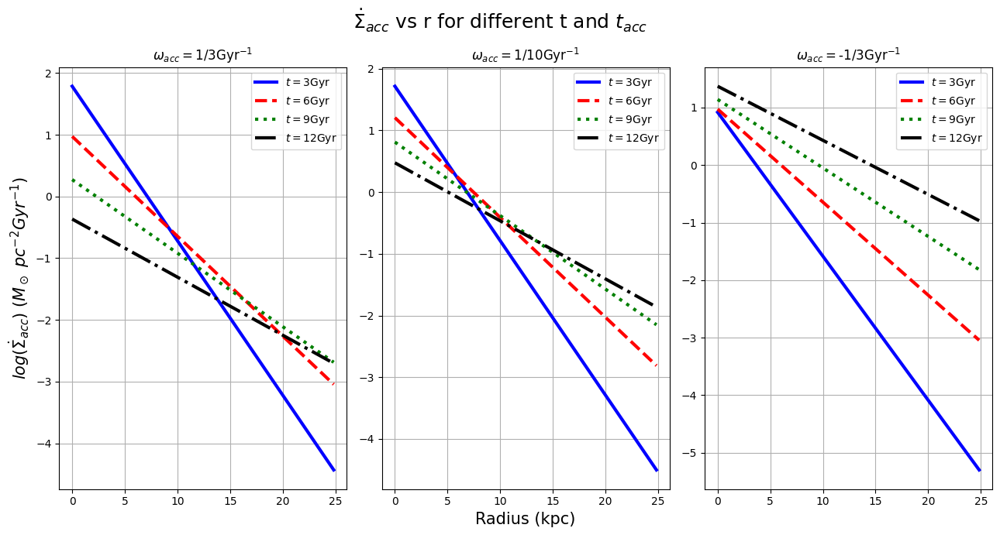

Execution time: 0.2117 seconds


In [29]:
M_sigma_accs = np.array([M_sigma_acc_dot1, M_sigma_acc_dot2, M_sigma_acc_dot3])

# Create a figure with three subplots
fig, axes = plt.subplots(nrows=1, ncols=3, sharex=True, sharey="col", figsize=(13, 7))

# Set the labels and titles of the subplots
f1 = axes[0]
f2 = axes[1]
f3 = axes[2]
fig.suptitle(r"$\dot{\Sigma}_{acc}$ vs r for different t and $t_{acc}$", fontsize = 18)
f2.set_xlabel("Radius (kpc)", fontsize = 15)
f1.set_ylabel(r"$log(\dot{\Sigma}_{acc})$ $(M_\odot\ pc^{-2} Gyr^{-1})$", fontsize = 15)

for i, M, t_accr in zip(range(3), M_sigma_accs, t_acc):
    axes[i].plot(r[:index_r1]/1000, np.log10(M[:,index_t1])[:index_r1], label=r"$t = 3$Gyr", color="blue", lw=3)
    axes[i].plot(r[:index_r1]/1000, np.log10(M[:,index_t2])[:index_r1], label=r"$t = 6$Gyr", linestyle="dashed", color="red", lw=3)
    axes[i].plot(r[:index_r1]/1000, np.log10(M[:,index_t3])[:index_r1], label=r"$t = 9$Gyr", linestyle="dotted", color="green", lw=3)
    axes[i].plot(r[:index_r1]/1000, np.log10(M[:,index_t4])[:index_r1], label=r"$t = 12$Gyr", linestyle="dashdot", color="black", lw=3)
    axes[i].set_title(r"$\omega_{acc}=$"+f"{Fraction(1,int(t_accr))}Gyr"+r'$^{-1}$')
    axes[i].legend()
    
# Add grid lines to each subplot and adjust layout
for ax in axes:
    ax.grid(True)

plt.tight_layout()
show()
fig.savefig(f'../outputs/graphs10_JAX_aKSL/dotSigma_acc vs r (t_acc variation, k={ki}).png')

### $\tau_\mathrm{dep}$ and $\tau_\mathrm{sup}$

In [30]:
# Compute SFRs for cutoff_ksl without altering SFL: evaluate per-galaxy and per-radius elementwise
# Compute SFR surface density for cutoff_ksl in a vectorized way (handles array sigma)
def sfl_cutoff_array(sigma):
    Rf = 0.3
    sigma = np.asarray(sigma, dtype=float)

    # enforce physical domain for SFR: if Σ<=0, SFR=0
    sigma_pos = np.where(sigma > 0.0, sigma, 0.0)

    low_reg = (1 - Rf)*1.59e-3*(sigma_pos**3.25)
    high_reg = (1 - Rf)*6.68e-2*(sigma_pos**1.54)

    with np.errstate(divide='ignore', invalid='ignore'):
        log_sigma = np.where(sigma_pos > 0.0, np.log10(sigma_pos), -np.inf)

    mask = log_sigma < threshold_sigma_SFR
    sfr = np.where(mask, low_reg, high_reg)

    sfr[~np.isfinite(sfr)] = 0.0
    return sfr

# define functions for supply and depletion timescales

def t_supply(Sigma_gas, r, t_acc, M_bar):
    """Returns the supply timescale, defined as the ratio of the gas surface density to the accretion rate surface density."""
    Sigma_acc = Sigma_acc_def(r, M_times1, t_acc, M_bar)
    t_supply_matrix = np.zeros(Sigma_gas.shape)
    for i in range(Sigma_gas.shape[0]): #loop over radius
        for j in range(Sigma_gas.shape[1]): #loop over time
            if Sigma_acc[i,j] > 0:
                t_supply_matrix[i,j] = Sigma_gas[i,j]/Sigma_acc[i,j]
            else:
                t_supply_matrix[i,j] = np.inf
    return t_supply_matrix

def t_depletion(Sigma_gas, r, t_acc, M_bar, sfl_type="cutoff_ksl"):
    """Returns the depletion timescale, defined as the ratio of the gas surface density to the star formation rate surface density."""
    if sfl_type == "cutoff_ksl":
        Sigma_sfr = sfl_cutoff_array(Sigma_gas)
    else:
        Sigma_sfr = SFL(Sigma_gas, sfl_type, r[:, np.newaxis], M_bar)
    t_depletion_matrix = np.zeros(Sigma_gas.shape)
    for i in range(Sigma_gas.shape[0]):
        for j in range(Sigma_gas.shape[1]):
            if Sigma_sfr[i,j] > 0:
                t_depletion_matrix[i,j] = Sigma_gas[i,j]/Sigma_sfr[i,j]
            else:
                t_depletion_matrix[i,j] = np.inf
    return t_depletion_matrix


Execution time: 0.0011 seconds


### $log(\Sigma_{gas})$ vs r for different t and $t_{acc}$

warnings.filterwarnings('ignore')

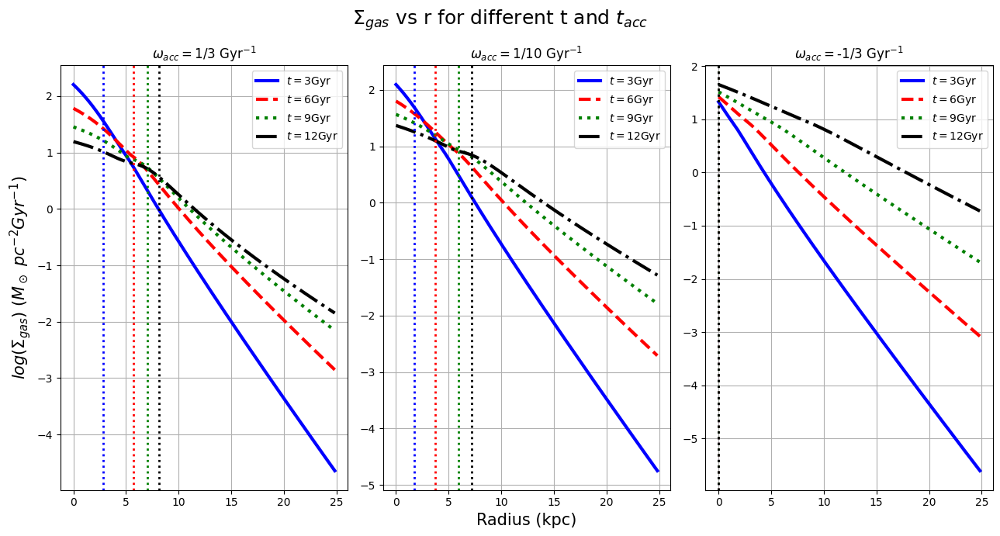

Execution time: 0.3984 seconds


In [31]:
Sigma_gas_cutoff_ksl = np.array([Sigma_gas_cutoff_ksl1, Sigma_gas_cutoff_ksl2, Sigma_gas_cutoff_ksl3])

#find radius where t_dep = t_sup for each t_acc and time
r_eq_list = []
for i, t_accr in enumerate(t_acc):
    t_sup = t_supply(Sigma_gas_cutoff_ksl[i], r, t_accr, M_bar_t0)
    t_dep = t_depletion(Sigma_gas_cutoff_ksl[i], r, t_accr, M_bar_t0, sfl_type="cutoff_ksl")

    r_eq = np.full(t_sup.shape[1], 0) # 0 = no crossing at that time
    for j in range(t_sup.shape[1]):
        D = (t_sup[:, j] - t_dep[:, j]).astype(float)
        mask = np.isfinite(D) & np.isfinite(r)
        rr, DD = r[mask], D[mask]

        sign = np.sign(DD)
        cross_idx = np.where(np.diff(sign) != 0)[0] # indices k where DD[k]*DD[k+1] < 0
        if cross_idx.size:
            k = cross_idx[0]
            r0, r1 = rr[k], rr[k+1]
            y0, y1 = DD[k], DD[k+1]
            # linear interpolation to Delta=0
            r_eq[j] = r0 - y0 * (r1 - r0) / (y1 - y0)
        else:
            r_eq[j] = 0  # no supply-limited/KS transition at this time

    r_eq_list.append(r_eq)

# Create a figure with three subplots
fig, axes = plt.subplots(nrows=1, ncols=3, sharex=True, sharey="col", figsize=(13, 7))

# Set the labels and titles of the subplots
f1 = axes[0]
f2 = axes[1]
f3 = axes[2]
fig.suptitle(r"$\Sigma_{gas}$ vs r for different t and $t_{acc}$", fontsize = 18)
f2.set_xlabel("Radius (kpc)", fontsize = 15)
f1.set_ylabel(r"$log(\Sigma_{gas})$ $(M_\odot\ pc^{-2} Gyr^{-1})$", fontsize = 15)

for i, M, t_accr in zip(range(3), Sigma_gas_cutoff_ksl, t_acc):
    axes[i].plot(r[:index_r1]/1000, np.log10(M[:,index_t1])[:index_r1], label=r"$t = 3$Gyr", color="blue", lw=3)
    axes[i].plot(r[:index_r1]/1000, np.log10(M[:,index_t2])[:index_r1], label=r"$t = 6$Gyr", linestyle="dashed", color="red", lw=3)
    axes[i].plot(r[:index_r1]/1000, np.log10(M[:,index_t3])[:index_r1], label=r"$t = 9$Gyr", linestyle="dotted", color="green", lw=3)
    axes[i].plot(r[:index_r1]/1000, np.log10(M[:,index_t4])[:index_r1], label=r"$t = 12$Gyr", linestyle="dashdot", color="black", lw=3)
    axes[i].axvline(x=r_eq_list[i][index_t1]/1000, color='blue', linestyle=':', lw=2)
    axes[i].axvline(x=r_eq_list[i][index_t2]/1000, color='red', linestyle=':', lw=2)
    axes[i].axvline(x=r_eq_list[i][index_t3]/1000, color='green', linestyle=':', lw=2)
    axes[i].axvline(x=r_eq_list[i][index_t4]/1000, color='black', linestyle=':', lw=2)
    axes[i].set_title(r"$\omega_{acc}=$"+f"{Fraction(1, int(t_accr))} Gyr"+r'$^{-1}$')
    axes[i].legend()
    
# Add grid lines to each subplot and adjust layout
for ax in axes:
    ax.grid(True)

plt.tight_layout()
show()
fig.savefig(f'../outputs/graphs10_JAX_aKSL/Sigma_gas_cutoff_ksl vs r (t_acc variation, k={ki}).png')

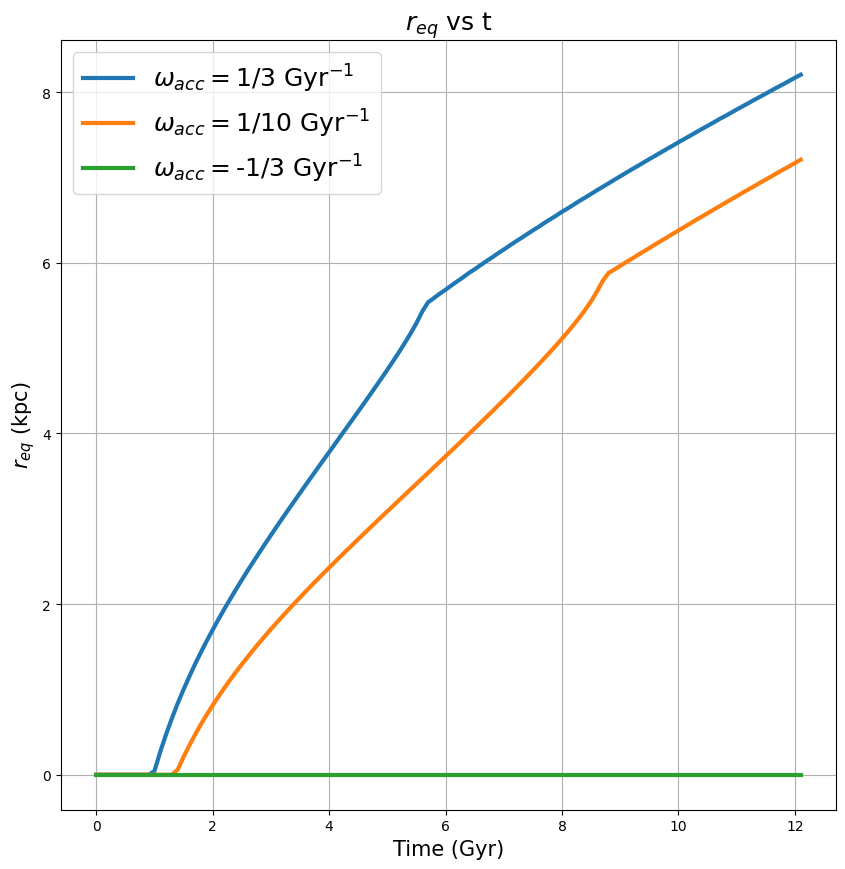

Execution time: 0.0997 seconds


In [32]:
# plot r_eq vs time for each t_acc
fig = figure(figsize=(10,10), facecolor='w')
frame = fig.add_subplot(1,1,1)
for i, r_eq, t_accr in zip(range(3), r_eq_list, t_acc):
    frame.plot(M_times1, r_eq/1000, label = r"$\omega_{acc} = $"+f"{Fraction(1,int(t_accr))} Gyr$^{{-1}}$", lw=3)
frame.set_title(r"$r_{eq}$ vs t", fontsize = 18)
frame.set_xlabel("Time (Gyr)", fontsize = 15)
frame.set_ylabel(r"$r_{eq}$ (kpc)", fontsize = 15)
frame.legend(prop={'size': 18})
frame.grid()
show()
fig.savefig(f'../outputs/graphs10_JAX_aKSL/r_eq vs time (t_acc variation, k={ki}).png')

/var/folders/hz/s07cwl6d5_v5tr1l0jp_v5dr0000gn/T/ipykernel_94638/3749383311.py:7: RuntimeWarning: divide by zero encountered in log10
  frame.plot(r[:index_r1]/1000, np.log10(t_sup)[:index_r1,np.argwhere(M_times1 == find_nearest(M_times1, 4.))[0][0]], label = r"$t_{sup}, \omega_{acc} = $"+f"{Fraction(1,int(t_accr))} Gyr$^{{-1}}$", color=col, linestyle='solid', lw=3)


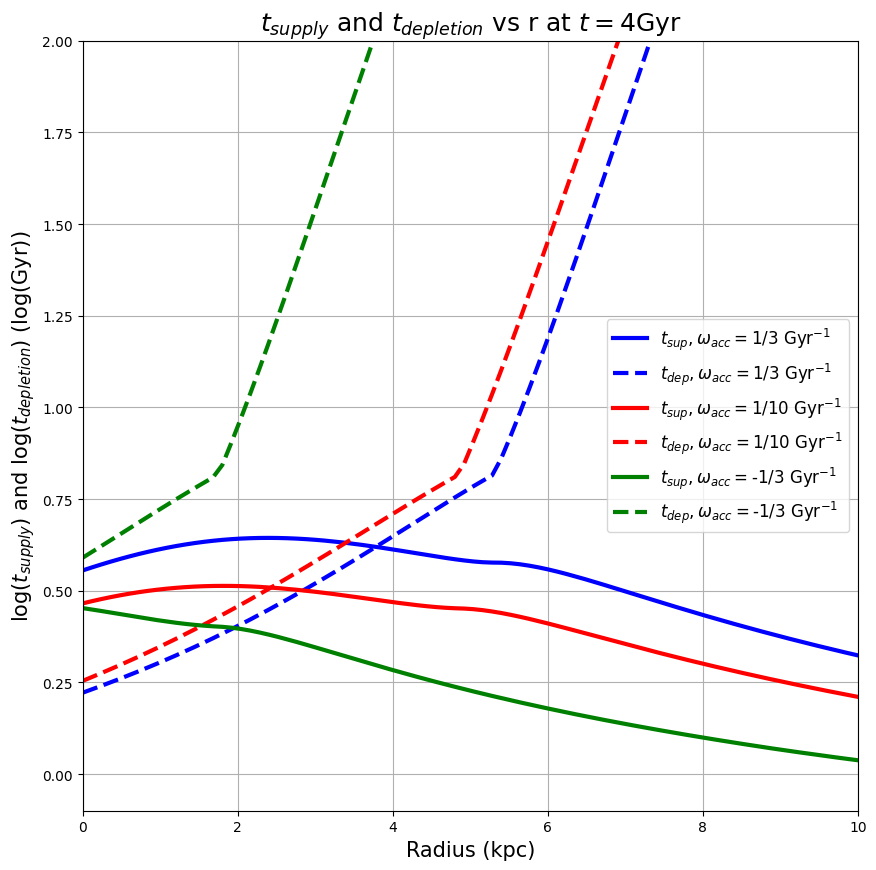

Execution time: 0.2718 seconds


In [33]:
# plot t_supply and t_depletion for cutoff_ksl at t=12Gyr for each t_acc
fig = figure(figsize=(10,10), facecolor='w')
frame = fig.add_subplot(1,1,1)
for i, t_accr, col, sty in zip(range(3), t_acc, colors, styles):
    t_sup = t_supply(Sigma_gas_cutoff_ksl[i], r, t_accr, M_bar_t0)
    t_dep = t_depletion(Sigma_gas_cutoff_ksl[i], r, t_accr, M_bar_t0, sfl_type="cutoff_ksl")
    frame.plot(r[:index_r1]/1000, np.log10(t_sup)[:index_r1,np.argwhere(M_times1 == find_nearest(M_times1, 4.))[0][0]], label = r"$t_{sup}, \omega_{acc} = $"+f"{Fraction(1,int(t_accr))} Gyr$^{{-1}}$", color=col, linestyle='solid', lw=3)
    frame.plot(r[:index_r1]/1000, np.log10(t_dep)[:index_r1,np.argwhere(M_times1 == find_nearest(M_times1, 4.))[0][0]], label = r"$t_{dep}, \omega_{acc} = $"+f"{Fraction(1,int(t_accr))} Gyr$^{{-1}}$", color=col, linestyle='dashed', lw=3)
frame.set_title(r"$t_{supply}$ and $t_{depletion}$ vs r at $t=4$Gyr", fontsize = 18)
frame.set_xlabel("Radius (kpc)", fontsize = 15)
frame.set_ylabel(r"$\log(t_{supply})$ and $\log(t_{depletion})$ (log(Gyr))", fontsize = 15)
frame.set_xlim(0, 10)
frame.set_ylim(-0.1, 2)
frame.legend(prop={'size': 12})
frame.grid()
show()
fig.savefig(f'../outputs/graphs10_JAX_aKSL/t_supply and t_depletion vs r at t=4Gyr (t_acc variation, k={ki}).png')

In [34]:
# ==== precompute full t_sup and t_dep grids for all t ====

# Sigma_gas_cutoff_ksl has shape (3, Nr, Nt) for the three t_acc values
n_acc, n_r, n_t = Sigma_gas_cutoff_ksl.shape

t_sup_all = np.zeros_like(Sigma_gas_cutoff_ksl, dtype=float)
t_dep_all = np.zeros_like(Sigma_gas_cutoff_ksl, dtype=float)

for i, t_accr in enumerate(t_acc):
    t_sup_all[i] = t_supply(Sigma_gas_cutoff_ksl[i], r, t_accr, M_bar_t0)
    t_dep_all[i] = t_depletion(Sigma_gas_cutoff_ksl[i], r, t_accr, M_bar_t0, sfl_type="cutoff_ksl")

# choose how many radii and times to show
r_kpc = r[:index_r1]/1000.0
time_indices = np.arange(n_t)   # or e.g. np.arange(0, n_t, 2) to skip every other step

# precompute log10 safely (avoid warnings on inf)
with np.errstate(divide="ignore", invalid="ignore"):
    log_t_sup_all = np.log10(t_sup_all)
    log_t_dep_all = np.log10(t_dep_all)

Execution time: 0.1676 seconds


In [35]:
fig = figure(figsize=(10, 10), dpi=150, facecolor='w')
ax = fig.add_subplot(1,1,1)

# set up lines: one solid + one dashed per t_acc
sup_lines = []
dep_lines = []
for col, sty in zip(colors, styles):
    (l_sup,) = ax.plot([], [], color=col, linestyle='solid', lw=3)
    (l_dep,) = ax.plot([], [], color=col, linestyle='dashed', lw=3)
    sup_lines.append(l_sup)
    dep_lines.append(l_dep)

# axis labels etc.
ax.set_xlabel("Radius (kpc)", fontsize=15)
ax.set_ylabel(r"$\log(t_{supply}), \log(t_{depletion})$ (log(Gyr))", fontsize=15)
ax.set_xlim(0, r_kpc[-1])
ax.set_ylim(-0.1, 12.1)
ax.grid()

# legend (static; only labels once)
labels = []
for t_accr, col in zip(t_acc, colors):
    labels.append(r"$t_{sup}, \omega_{acc} = $" + f"{Fraction(1,int(t_accr))} Gyr$^{{-1}}$")
    labels.append(r"$t_{dep}, \omega_{acc} = $" + f"{Fraction(1,int(t_accr))} Gyr$^{{-1}}$")
ax.legend(sup_lines + dep_lines, labels, prop={'size': 9})

# time annotation in the corner
time_text = ax.text(0.02, 0.95, "", transform=ax.transAxes, fontsize=14)

def init():
    for l_sup, l_dep in zip(sup_lines, dep_lines):
        l_sup.set_data([], [])
        l_dep.set_data([], [])
    time_text.set_text("")
    return sup_lines + dep_lines + [time_text]

def update(frame_idx):
    j = time_indices[frame_idx]
    t_now = M_times1[j]

    for i, (l_sup, l_dep) in enumerate(zip(sup_lines, dep_lines)):
        y_sup = log_t_sup_all[i, :index_r1, j]
        y_dep = log_t_dep_all[i, :index_r1, j]
        l_sup.set_data(r_kpc, y_sup)
        l_dep.set_data(r_kpc, y_dep)

    time_text.set_text(f"t = {t_now:.1f} Gyr")
    return sup_lines + dep_lines + [time_text]

anim = FuncAnimation(
    fig,
    update,
    frames=len(time_indices),
    init_func=init,
    blit=True
)

# save as GIF (needs pillow installed)
gif_path = f"../outputs/graphs10_JAX_aKSL/t_supply_t_depletion_evolution.gif"
anim.save(gif_path, writer=PillowWriter(fps=5))

plt.close(fig)
print("Saved GIF to:", gif_path)

Saved GIF to: ../outputs/graphs10_JAX_aKSL/t_supply_t_depletion_evolution.gif
Execution time: 11.9826 seconds


In [36]:
time_indices = np.arange(n_t)  # or e.g. np.arange(0, n_t, 2)

# global y-limits for the left panel
with np.errstate(invalid="ignore"):
    y_full_min = np.nanmin(np.concatenate([
        log_t_sup_all[:, :index_r1, :].ravel(),
        log_t_dep_all[:, :index_r1, :].ravel()
    ]))
    y_full_max = np.nanmax(np.concatenate([
        log_t_sup_all[:, :index_r1, :].ravel(),
        log_t_dep_all[:, :index_r1, :].ravel()
    ]))

# zoom limits for the right panel (tweak these)
x_zoom_min, x_zoom_max = -0.05, 10.0   # kpc
y_zoom_min, y_zoom_max = -0.1, 2.0   # log(Gyr)

fig, (ax_full, ax_zoom) = plt.subplots(
    1, 2, figsize=(14, 6), dpi=150, facecolor='w', sharey=False
)

fig.suptitle(r"Animation of $t_{supply}$ and $t_{depletion}$ vs $r$ at different $t$",
             fontsize=18, y=0.98)

# ---------- set up lines ----------
sup_lines_full, dep_lines_full = [], []
sup_lines_zoom, dep_lines_zoom = [], []

for col, sty in zip(colors, styles):
    # full panel
    (lf_sup,) = ax_full.plot([], [], color=col, linestyle='solid', lw=3)
    (lf_dep,) = ax_full.plot([], [], color=col, linestyle='dashed', lw=3)
    sup_lines_full.append(lf_sup)
    dep_lines_full.append(lf_dep)

    # zoom panel
    (lz_sup,) = ax_zoom.plot([], [], color=col, linestyle='solid', lw=3)
    (lz_dep,) = ax_zoom.plot([], [], color=col, linestyle='dashed', lw=3)
    sup_lines_zoom.append(lz_sup)
    dep_lines_zoom.append(lz_dep)

# ---------- formatting ----------
ax_full.set_title(r"Full view", fontsize=16)
ax_full.set_xlabel("Radius (kpc)", fontsize=15)
ax_full.set_ylabel(r"$\log(t_{supply}), \log(t_{depletion})$ (log(Gyr))", fontsize=15)
ax_full.set_xlim(r_kpc[0], r_kpc[-1])
ax_full.set_ylim(-0.1, 12.1)
ax_full.grid()

ax_zoom.set_title(r"Zoomed view", fontsize=16)
ax_zoom.set_xlabel("Radius (kpc)", fontsize=15)
ax_zoom.set_xlim(x_zoom_min, x_zoom_max)
ax_zoom.set_ylim(y_zoom_min, y_zoom_max)
ax_zoom.grid()

# legend only on the full panel
legend_lines = []
legend_labels = []
for t_accr, col in zip(t_acc, colors):
    legend_lines.append(plt.Line2D([], [], color=col, linestyle='solid', lw=3))
    legend_lines.append(plt.Line2D([], [], color=col, linestyle='dashed', lw=3))
    legend_labels.append(r"$t_{sup}, \omega_{acc} = $" + f"{Fraction(1,int(t_accr))} Gyr$^{{-1}}$")
    legend_labels.append(r"$t_{dep}, \omega_{acc} = $" + f"{Fraction(1,int(t_accr))} Gyr$^{{-1}}$")

ax_full.legend(legend_lines, legend_labels, prop={'size': 9}, loc='upper right')

# time annotation at top center
time_text = ax_full.text(
    0.15, 0.91, "",
    transform=ax_full.transAxes,
    ha="center", va="bottom",
    fontsize=16
)

def init():
    for l in (sup_lines_full + dep_lines_full +
              sup_lines_zoom + dep_lines_zoom):
        l.set_data([], [])
    time_text.set_text("")
    return sup_lines_full + dep_lines_full + sup_lines_zoom + dep_lines_zoom + [time_text]

def update(frame_idx):
    j = time_indices[frame_idx]
    t_now = M_times1[j]

    for i in range(n_acc):
        y_sup = log_t_sup_all[i, :index_r1, j]
        y_dep = log_t_dep_all[i, :index_r1, j]

        # full panel
        sup_lines_full[i].set_data(r_kpc, y_sup)
        dep_lines_full[i].set_data(r_kpc, y_dep)

        # zoom panel (same data, different axes limits)
        sup_lines_zoom[i].set_data(r_kpc, y_sup)
        dep_lines_zoom[i].set_data(r_kpc, y_dep)

    time_text.set_text(rf"$t = {t_now:.1f}\,{{\rm Gyr}}$")
    return sup_lines_full + dep_lines_full + sup_lines_zoom + dep_lines_zoom + [time_text]

anim = FuncAnimation(
    fig,
    update,
    frames=len(time_indices),
    init_func=init,
    blit=True
)

gif_path = f"../outputs/graphs10_JAX_aKSL/t_supply_t_depletion_evolution_dual_with_zoom.gif"
anim.save(gif_path, writer=PillowWriter(fps=5))

plt.close(fig)
print("Saved dual-panel GIF to:", gif_path)

Saved dual-panel GIF to: ../outputs/graphs10_JAX_aKSL/t_supply_t_depletion_evolution_dual_with_zoom.gif
Execution time: 12.4825 seconds


### $log(\Sigma_{SFR})$ vs r for different t and $t_{acc}$

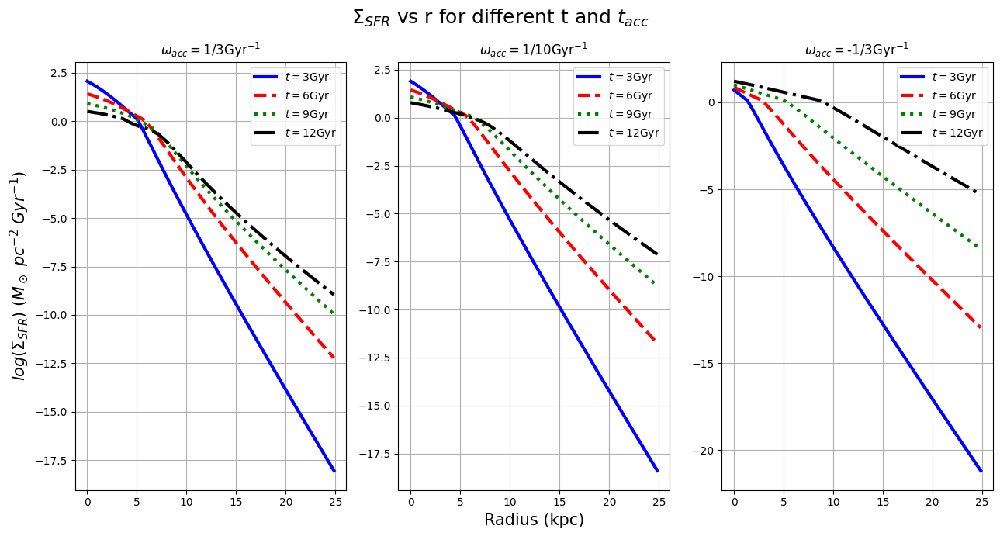

Execution time: 0.3286 seconds


In [34]:
M_sfrs_cutoff_ksl1 = sfl_cutoff_array(Sigma_gas_cutoff_ksl1)
M_sfrs_cutoff_ksl2 = sfl_cutoff_array(Sigma_gas_cutoff_ksl2)
M_sfrs_cutoff_ksl3 = sfl_cutoff_array(Sigma_gas_cutoff_ksl3)
M_sfrs_cutoff_ksl = np.array([M_sfrs_cutoff_ksl1, M_sfrs_cutoff_ksl2, M_sfrs_cutoff_ksl3])

np.savetxt('../data/data9_JAX_aKSL/M_sfr1_cutoff_ksl_'+f'{np.log10(M_bar_t0)}.txt', M_sfrs_cutoff_ksl1)
np.savetxt('../data/data9_JAX_aKSL/M_sfr2_cutoff_ksl_'+f'{np.log10(M_bar_t0)}.txt', M_sfrs_cutoff_ksl2)
np.savetxt('../data/data9_JAX_aKSL/M_sfr3_cutoff_ksl_'+f'{np.log10(M_bar_t0)}.txt', M_sfrs_cutoff_ksl3)

# Create a figure with three subplots
fig, axes = plt.subplots(nrows=1, ncols=3, sharex=True, sharey="col", figsize=(13, 7), facecolor='w')

# Set the labels and titles of the subplots
f1 = axes[0]
f2 = axes[1]
f3 = axes[2]
fig.suptitle(r"$\Sigma_{SFR}$ vs r for different t and $t_{acc}$", fontsize = 18)
f2.set_xlabel("Radius (kpc)", fontsize = 15)
f1.set_ylabel(r"$log(\Sigma_{SFR})$ $(M_\odot\ pc^{-2}\ Gyr^{-1})$", fontsize = 15)

for i, M, t_accr in zip(range(3), M_sfrs_cutoff_ksl, t_acc):
    axes[i].plot(r[:index_r1]/1000, np.log10(M[:,index_t1])[:index_r1], label=r"$t = 3$Gyr", color="blue", lw=3)
    axes[i].plot(r[:index_r1]/1000, np.log10(M[:,index_t2])[:index_r1], label=r"$t = 6$Gyr", linestyle="dashed", color="red", lw=3)
    axes[i].plot(r[:index_r1]/1000, np.log10(M[:,index_t3])[:index_r1], label=r"$t = 9$Gyr", linestyle="dotted", color="green", lw=3)
    axes[i].plot(r[:index_r1]/1000, np.log10(M[:,index_t4])[:index_r1], label=r"$t = 12$Gyr", linestyle="dashdot", color="black", lw=3)
    axes[i].set_title(r"$\omega_{acc}=$"+f"{Fraction(1,int(t_accr))}Gyr"+r'$^{-1}$')
    axes[i].legend()

# Add grid lines to each subplot and adjust layout
for ax in axes:
    ax.grid(True)

plt.tight_layout()
show()
fig.savefig(f'../outputs/graphs10_JAX_aKSL/Sigma_sfr vs r (t_acc variation, k={ki}).png')

### $log(\Sigma_{\star})$ vs r for different t and $t_{acc}$

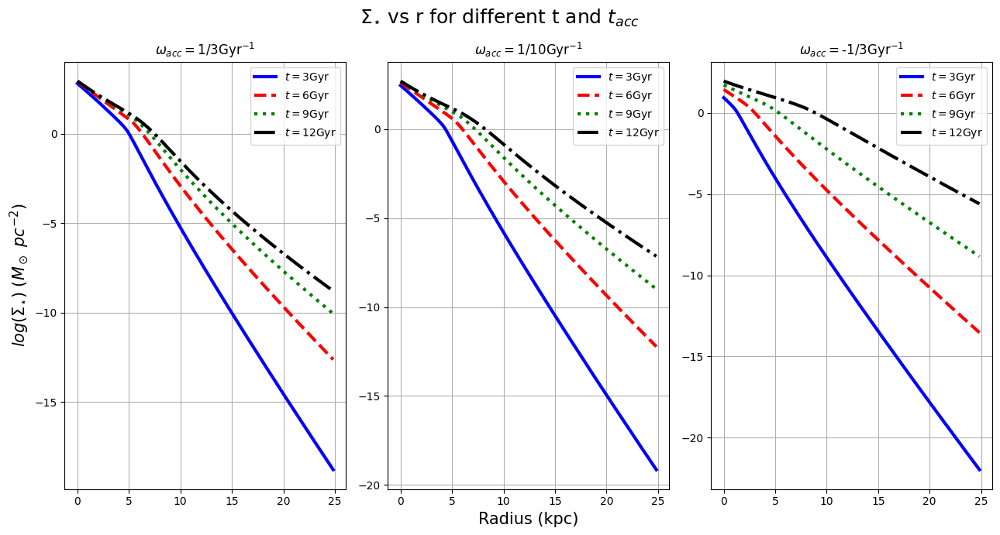

Execution time: 0.3460 seconds


In [35]:
Sigma_star_cutoff_ksl1 = dt*np.cumsum(M_sfrs_cutoff_ksl[0], axis=1)
Sigma_star_cutoff_ksl2 = dt*np.cumsum(M_sfrs_cutoff_ksl[1], axis=1)
Sigma_star_cutoff_ksl3 = dt*np.cumsum(M_sfrs_cutoff_ksl[2], axis=1)
Sigma_stars_cutoff_ksl = np.array([Sigma_star_cutoff_ksl1, Sigma_star_cutoff_ksl2, Sigma_star_cutoff_ksl3])
np.savetxt(f'../data/data9_JAX_aKSL/M_star1_{np.log10(M_bar_t0)}_cutoff_ksl.txt', Sigma_star_cutoff_ksl1)
np.savetxt(f'../data/data9_JAX_aKSL/M_star2_{np.log10(M_bar_t0)}_cutoff_ksl.txt', Sigma_star_cutoff_ksl2)
np.savetxt(f'../data/data9_JAX_aKSL/M_star3_{np.log10(M_bar_t0)}_cutoff_ksl.txt', Sigma_star_cutoff_ksl3)

# Create a figure with three subplots
fig, axes = plt.subplots(nrows=1, ncols=3, sharex=True, sharey="col", figsize=(13, 7))

# Set the labels and titles of the subplots
f1 = axes[0]
f2 = axes[1]
f3 = axes[2]
fig.suptitle(r"$\Sigma_{\star}$ vs r for different t and $t_{acc}$", fontsize = 18)
f2.set_xlabel("Radius (kpc)", fontsize = 15)
f1.set_ylabel(r"$log(\Sigma_{\star})$ $(M_\odot\ pc^{-2})$", fontsize = 15)

for i, M, t_accr in zip(range(3), Sigma_stars_cutoff_ksl, t_acc):
    axes[i].plot(r[:index_r1]/1000, np.log10(M[:,index_t1])[:index_r1], label=r"$t = 3$Gyr", color="blue", lw=3)
    axes[i].plot(r[:index_r1]/1000, np.log10(M[:,index_t2])[:index_r1], label=r"$t = 6$Gyr", linestyle="dashed", color="red", lw=3)
    axes[i].plot(r[:index_r1]/1000, np.log10(M[:,index_t3])[:index_r1], label=r"$t = 9$Gyr", linestyle="dotted", color="green", lw=3)
    axes[i].plot(r[:index_r1]/1000, np.log10(M[:,index_t4])[:index_r1], label=r"$t = 12$Gyr", linestyle="dashdot", color="black", lw=3)
    axes[i].set_title(r"$\omega_{acc}=$"+f"{Fraction(1,int(t_accr))}Gyr"+r'$^{-1}$')
    axes[i].legend()
    
# Add grid lines to each subplot and adjust layout
for ax in axes:
    ax.grid(True)

plt.tight_layout()
show()
fig.savefig(f'../outputs/graphs10_JAX_aKSL/Sigma_star vs r (t_acc variation, k={ki}).png')

### $log(\Sigma_{bar})$ vs r for different t and $t_{acc}$

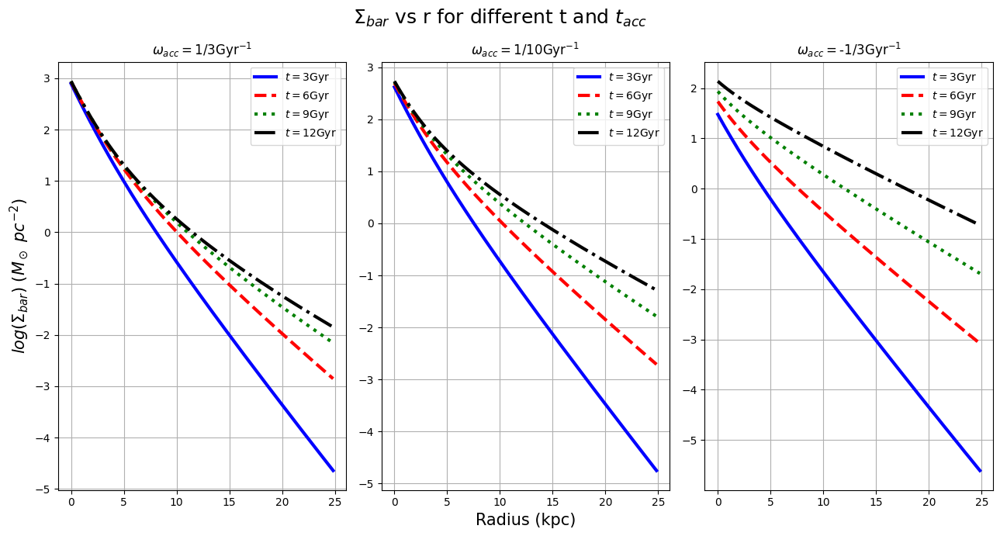

Execution time: 2.3923 seconds


In [36]:
Sigma_bar_cutoff_ksl1 = np.array([np.sum(x) for x in zip(Sigma_gas_cutoff_ksl1.ravel(), Sigma_star_cutoff_ksl1.ravel())]).reshape(Sigma_gas_cutoff_ksl1.shape)
Sigma_bar_cutoff_ksl2 = np.array([np.sum(x) for x in zip(Sigma_gas_cutoff_ksl2.ravel(), Sigma_star_cutoff_ksl2.ravel())]).reshape(Sigma_gas_cutoff_ksl2.shape)
Sigma_bar_cutoff_ksl3 = np.array([np.sum(x) for x in zip(Sigma_gas_cutoff_ksl3.ravel(), Sigma_star_cutoff_ksl3.ravel())]).reshape(Sigma_gas_cutoff_ksl3.shape)
Sigma_bars_cutoff_ksl = np.array([Sigma_bar_cutoff_ksl1, Sigma_bar_cutoff_ksl2, Sigma_bar_cutoff_ksl3])
np.savetxt(f'../data/data9_JAX_aKSL/M_bar1_{np.log10(M_bar_t0)}_cutoff_ksl.txt', Sigma_bar_cutoff_ksl1)
np.savetxt(f'../data/data9_JAX_aKSL/M_bar2_{np.log10(M_bar_t0)}_cutoff_ksl.txt', Sigma_bar_cutoff_ksl2)
np.savetxt(f'../data/data9_JAX_aKSL/M_bar3_{np.log10(M_bar_t0)}_cutoff_ksl.txt', Sigma_bar_cutoff_ksl3)

# Create a figure with three subplots
fig, axes = plt.subplots(nrows=1, ncols=3, sharex=True, sharey="col", figsize=(13, 7))

# Set the labels and titles of the subplots
f1 = axes[0]
f2 = axes[1]
f3 = axes[2]
fig.suptitle(r"$\Sigma_{bar}$ vs r for different t and $t_{acc}$", fontsize = 18)
f2.set_xlabel("Radius (kpc)", fontsize = 15)
f1.set_ylabel(r"$log(\Sigma_{bar})$ $(M_\odot\ pc^{-2})$", fontsize = 15)

for i, M, t_accr in zip(range(3), Sigma_bars_cutoff_ksl, t_acc):
    axes[i].plot(r[:index_r1]/1000, np.log10(M[:,index_t1])[:index_r1], label=r"$t = 3$Gyr", color="blue", lw=3)
    axes[i].plot(r[:index_r1]/1000, np.log10(M[:,index_t2])[:index_r1], label=r"$t = 6$Gyr", linestyle="dashed", color="red", lw=3)
    axes[i].plot(r[:index_r1]/1000, np.log10(M[:,index_t3])[:index_r1], label=r"$t = 9$Gyr", linestyle="dotted", color="green", lw=3)
    axes[i].plot(r[:index_r1]/1000, np.log10(M[:,index_t4])[:index_r1], label=r"$t = 12$Gyr", linestyle="dashdot", color="black", lw=3)
    axes[i].set_title(r"$\omega_{acc}=$"+f"{Fraction(1,int(t_accr))}Gyr"+r'$^{-1}$')
    axes[i].legend()
    
# Add grid lines to each subplot and adjust layout
for ax in axes:
    ax.grid(True)

plt.tight_layout()
show()
fig.savefig(f'../outputs/graphs10_JAX_aKSL/Sigma_bar vs r (t_acc variation, k={ki}).png')

In [37]:
NGC3198_HI = pd.read_table("../data/allHIprofs/NGC3198_fullHI.dat", sep=" ", usecols=["r[kpc]", "vrot[km/s]", "Sigma_HI[Msun/pc2]", "jHI[kpckm/s]"])
NGC3198_star = pd.read_table("../data/allSTARSprofs/NGC3198_fullstars_2.dat", sep=" ", usecols=["r[kpc]", "vrot[km/s]", "Sigma_star[Msun/pc2]", "jstar[kpckm/s]"])

NGC3198_HI['r[kpc]'] =  pd.to_numeric(NGC3198_HI['r[kpc]'], errors='coerce')
NGC3198_HI['vrot[km/s]'] =  pd.to_numeric(NGC3198_HI['vrot[km/s]'], errors='coerce')
NGC3198_HI['Sigma_HI[Msun/pc2]'] =  pd.to_numeric(NGC3198_HI['Sigma_HI[Msun/pc2]'], errors='coerce')
NGC3198_HI['jHI[kpckm/s]'] =  pd.to_numeric(NGC3198_HI['jHI[kpckm/s]'], errors='coerce')

NGC3198_star['r[kpc]'] =  pd.to_numeric(NGC3198_star['r[kpc]'], errors='coerce')
NGC3198_star['vrot[km/s]'] =  pd.to_numeric(NGC3198_star['vrot[km/s]'], errors='coerce')
NGC3198_star['Sigma_star[Msun/pc2]'] =  pd.to_numeric(NGC3198_star['Sigma_star[Msun/pc2]'], errors='coerce')
NGC3198_star['jstar[kpckm/s]'] =  pd.to_numeric(NGC3198_star['jstar[kpckm/s]'], errors='coerce')

NGC3198_r_obs_HI = NGC3198_HI['r[kpc]']
NGC3198_r_obs_star = NGC3198_star['r[kpc]']
NGC3198_v_obs = NGC3198_HI['vrot[km/s]']
NGC3198_Sigma_gas_obs = 1.4*NGC3198_HI['Sigma_HI[Msun/pc2]']
NGC3198_Sigma_star_obs = NGC3198_star['Sigma_star[Msun/pc2]']

NGC2403_HI = pd.read_table("../data/allHIprofs/NGC2403_fullHI.dat", sep=" ", usecols=["r[kpc]", "vrot[km/s]", "Sigma_HI[Msun/pc2]", "jHI[kpckm/s]"])
NGC2403_star = pd.read_table("../data/allSTARSprofs/NGC2403_fullstars.dat", sep=" ", usecols=["r[kpc]", "vrot[km/s]", "Sigma_star[Msun/pc2]", "jstar[kpckm/s]"])

NGC2403_HI['r[kpc]'] = pd.to_numeric(NGC2403_HI['r[kpc]'], errors='coerce')
NGC2403_HI['vrot[km/s]'] = pd.to_numeric(NGC2403_HI['vrot[km/s]'], errors='coerce')
NGC2403_HI['Sigma_HI[Msun/pc2]'] = pd.to_numeric(NGC2403_HI['Sigma_HI[Msun/pc2]'], errors='coerce')
NGC2403_HI['jHI[kpckm/s]'] = pd.to_numeric(NGC2403_HI['jHI[kpckm/s]'], errors='coerce')

NGC2403_star['r[kpc]'] = pd.to_numeric(NGC2403_star['r[kpc]'], errors='coerce')
NGC2403_star['vrot[km/s]'] = pd.to_numeric(NGC2403_star['vrot[km/s]'], errors='coerce')
NGC2403_star['Sigma_star[Msun/pc2]'] = pd.to_numeric(NGC2403_star['Sigma_star[Msun/pc2]'], errors='coerce')
NGC2403_star['jstar[kpckm/s]'] = pd.to_numeric(NGC2403_star['jstar[kpckm/s]'], errors='coerce')

NGC2403_r_obs_HI = NGC2403_HI['r[kpc]']
NGC2403_r_obs_star = NGC2403_star['r[kpc]']
NGC2403_v_obs = NGC2403_HI['vrot[km/s]']
NGC2403_Sigma_gas_obs = 1.4*NGC2403_HI['Sigma_HI[Msun/pc2]']
NGC2403_Sigma_star_obs = NGC2403_star['Sigma_star[Msun/pc2]']

Execution time: 0.0062 seconds


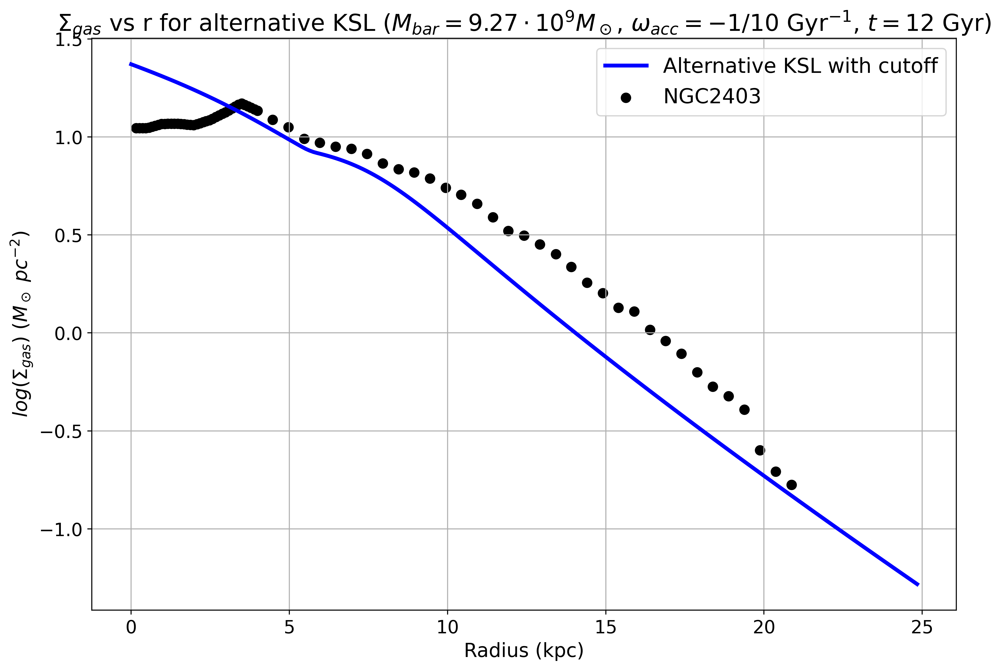

Execution time: 0.2248 seconds


In [38]:
fig = figure(figsize=(12, 8), dpi=400, facecolor='w', edgecolor='k')
frame = fig.add_subplot(1,1,1)
frame.plot(r[:index_r1]/1000, np.log10(Sigma_gas_cutoff_ksl[1][:index_r1,index_t4]), label=r"Alternative KSL with cutoff", color="blue", lw=3)
frame.scatter(NGC2403_r_obs_HI, np.log10(NGC2403_Sigma_gas_obs), label=r"NGC2403", c='k', s=50)
frame.set_title(r"$\Sigma_{gas}$ vs r for alternative KSL ($M_{bar}=9.27\cdot10^{9}M_\odot$, $\omega_{acc} = -1/10$ Gyr$^{-1}$, $t=12$ Gyr)", fontsize = 18)
frame.set_xlabel("Radius (kpc)", fontsize = 15)
frame.set_ylabel(r"$log(\Sigma_{gas})$ $(M_\odot\ pc^{-2})$", fontsize = 15)
frame.tick_params(labelsize=14)
frame.legend(prop={'size': 16})
frame.grid()
show()

fig = figure(figsize=(12, 8), dpi=400, facecolor='w', edgecolor='k')
frame = fig.add_subplot(1,1,1)
frame.plot(r[:index_r1]/1000, np.log10(Sigma_gas_cutoff_ksl[1][:index_r1,index_t4]), label=r"Alternative KSL with cutoff", color="blue", lw=3)
frame.scatter(NGC2403_r_obs_HI, np.log10(NGC2403_Sigma_gas_obs), label=r"NGC2403", c='k', s=50)
frame.set_title(r"$\Sigma_{gas}$ vs r for different SFLs ($M_{bar}=3.14\cdot10^{10}M_\odot$, $\omega_{acc} = -1/10$ Gyr$^{-1}$, $t=12$ Gyr)", fontsize = 18)
frame.set_xlabel("Radius (kpc)", fontsize = 15)
frame.set_ylabel(r"$log(\Sigma_{gas})$ $(M_\odot\ pc^{-2})$", fontsize = 15)
frame.tick_params(labelsize=14)
frame.legend(prop={'size': 16})
frame.grid()
show()

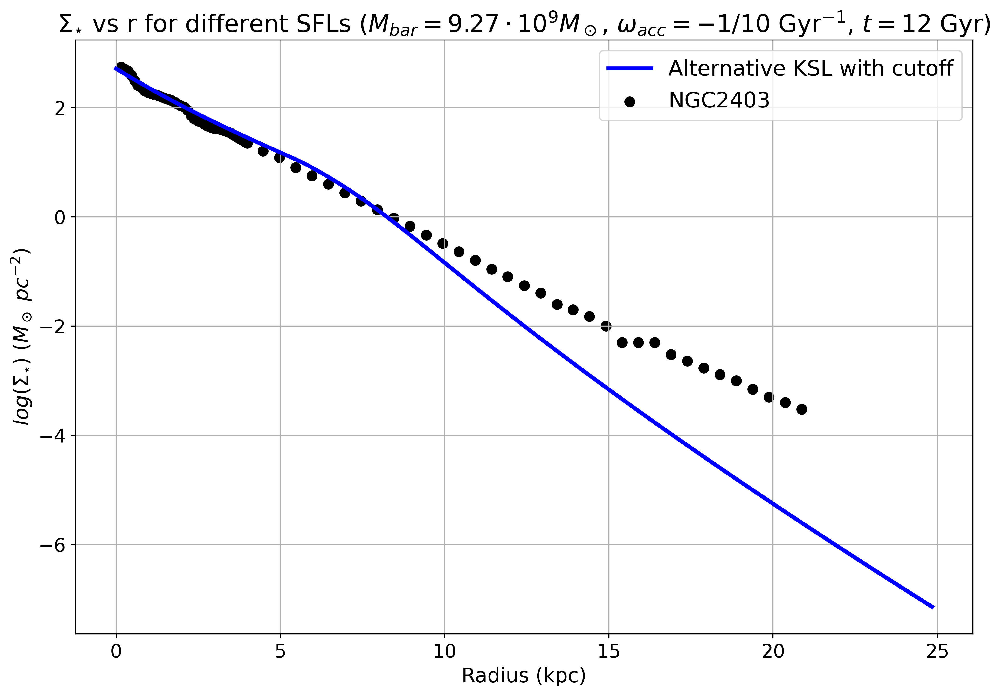

Execution time: 0.2077 seconds


In [39]:
fig = figure(figsize=(12, 8), dpi=400, facecolor='w', edgecolor='k')
frame = fig.add_subplot(1,1,1)
frame.plot(r[:index_r1]/1000, np.log10(Sigma_stars_cutoff_ksl[1][:index_r1,index_t4]), label=r"Alternative KSL with cutoff", color="blue", lw=3)
frame.scatter(NGC2403_r_obs_star, np.log10(NGC2403_Sigma_star_obs), label=r"NGC2403", c='k', s=50)
frame.set_title(r"$\Sigma_{\star}$ vs r for different SFLs ($M_{bar}=9.27\cdot10^{9}M_\odot$, $\omega_{acc} = -1/10$ Gyr$^{-1}$, $t=12$ Gyr)", fontsize = 18)
frame.set_xlabel("Radius (kpc)", fontsize = 15)
frame.set_ylabel(r"$log(\Sigma_{\star})$ $(M_\odot\ pc^{-2})$", fontsize = 15)
frame.tick_params(labelsize=14)
frame.legend(prop={'size': 16})
frame.grid()
show()

middle_sigmas_star = np.array([Sigma_stars_old_ksl[1], Sigma_stars_new_ksl[1], Sigma_stars_boissier[1]])

fig = figure(figsize=(12,8), dpi=400, facecolor='w')
frame = fig.add_subplot(1,1,1)
for i, M1, sfl, col, sty in zip(range(3), middle_sigmas_star, SFLS, colors, styles):
    frame.plot(r[:index_r2]/1000, np.log10(M1[:index_r2,index_t4]), label=sfl, linestyle=sty, color=col, lw=3)
frame.scatter(NGC3198_r_obs_star, np.log10(NGC3198_Sigma_star_obs), label=r"NGC3198", c='k', s=50)
frame.set_title(r"$\Sigma_{\star}$ vs r for different SFLs ($M_{bar}=3.14\cdot10^{10}M_\odot$, $\omega_{acc} = -1/10$ Gyr$^{-1}$, $t=12$ Gyr)", fontsize = 18)
frame.set_xlabel("Radius (kpc)", fontsize = 15)
frame.set_ylabel(r"$log(\Sigma_{\star})$ $(M_\odot\ pc^{-2})$", fontsize = 15)
frame.tick_params(labelsize=14)
frame.legend(prop={'size': 16})
frame.grid()
show()

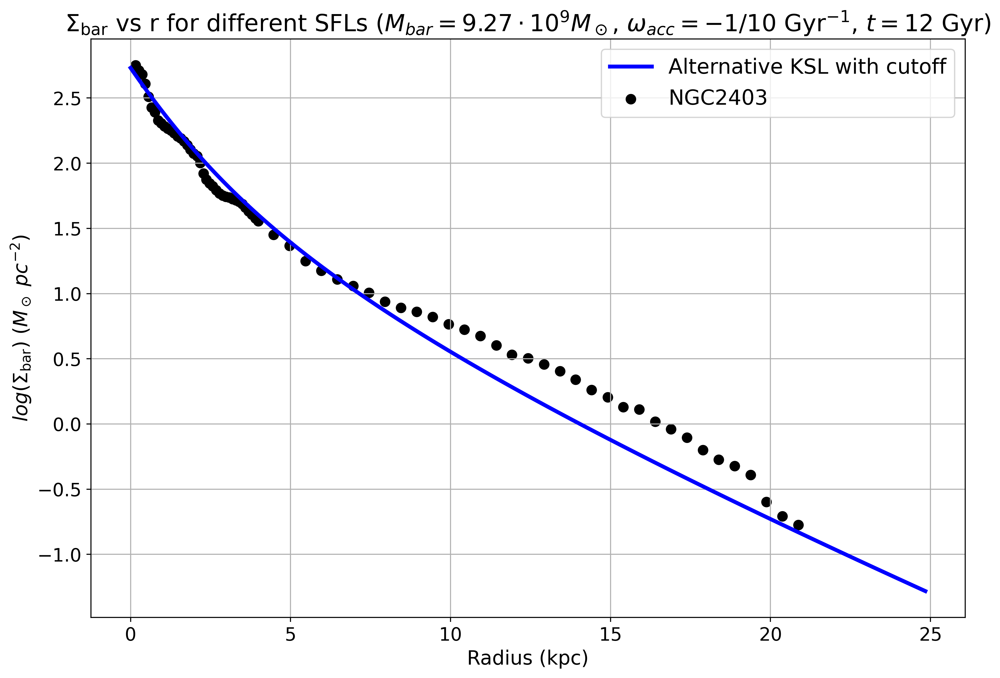

Execution time: 0.2287 seconds


In [40]:
fig = figure(figsize=(12, 8), dpi=400, facecolor='w', edgecolor='k')
frame = fig.add_subplot(1,1,1)
frame.plot(r[:index_r1]/1000, np.log10(Sigma_bars_cutoff_ksl[1][:index_r1,index_t4]), label=r"Alternative KSL with cutoff", color="blue", lw=3)
frame.scatter(NGC2403_r_obs_star, np.log10(NGC2403_Sigma_star_obs+NGC2403_Sigma_gas_obs), label=r"NGC2403", c='k', s=50)
frame.set_title(r"$\Sigma_{\mathrm{bar}}$ vs r for different SFLs ($M_{bar}=9.27\cdot10^{9}M_\odot$, $\omega_{acc} = -1/10$ Gyr$^{-1}$, $t=12$ Gyr)", fontsize = 18)
frame.set_xlabel("Radius (kpc)", fontsize = 15)
frame.set_ylabel(r"$log(\Sigma_{\mathrm{bar}})$ $(M_\odot\ pc^{-2})$", fontsize = 15)
frame.tick_params(labelsize=14)
frame.legend(prop={'size': 16})
frame.grid()
show()

middle_sigmas_bar = np.array([Sigma_bars_old_ksl[1], Sigma_bars_new_ksl[1], Sigma_bars_boissier[1]])

fig = figure(figsize=(12,8), dpi=400, facecolor='w')
frame = fig.add_subplot(1,1,1)
for i, M1, sfl, col, sty in zip(range(3), middle_sigmas_bar, SFLS, colors, styles):
    frame.plot(r[:index_r2]/1000, np.log10(M1[:index_r2,index_t4]), label=sfl, linestyle=sty, color=col, lw=3)
frame.scatter(NGC3198_r_obs_star, np.log10(NGC3198_Sigma_star_obs+NGC3198_Sigma_gas_obs), label=r"NGC3198", c='k', s=50)
frame.set_title(r"$\Sigma_{\mathrm{bar}}$ vs r for different SFLs ($M_{bar}=3.14\cdot10^{10}M_\odot$, $\omega_{acc} = -1/10$ Gyr$^{-1}$, $t=12$ Gyr)", fontsize = 18)
frame.set_xlabel("Radius (kpc)", fontsize = 15)
frame.set_ylabel(r"$log(\Sigma_{\mathrm{bar}})$ $(M_\odot\ pc^{-2})$", fontsize = 15)
frame.tick_params(labelsize=14)
frame.legend(prop={'size': 16})
frame.grid()
show()

warnings.filterwarnings('default')

## $f_{gas}$ vs r

/var/folders/hz/s07cwl6d5_v5tr1l0jp_v5dr0000gn/T/ipykernel_94638/2524574588.py:1: RuntimeWarning: invalid value encountered in divide
  f_gas_cutoff_ksl1 = np.divide(Sigma_gas_cutoff_ksl1, Sigma_bar_cutoff_ksl1)
/var/folders/hz/s07cwl6d5_v5tr1l0jp_v5dr0000gn/T/ipykernel_94638/2524574588.py:2: RuntimeWarning: invalid value encountered in divide
  f_gas_cutoff_ksl2 = np.divide(Sigma_gas_cutoff_ksl2, Sigma_bar_cutoff_ksl2)
/var/folders/hz/s07cwl6d5_v5tr1l0jp_v5dr0000gn/T/ipykernel_94638/2524574588.py:3: RuntimeWarning: invalid value encountered in divide
  f_gas_cutoff_ksl3 = np.divide(Sigma_gas_cutoff_ksl3, Sigma_bar_cutoff_ksl3)


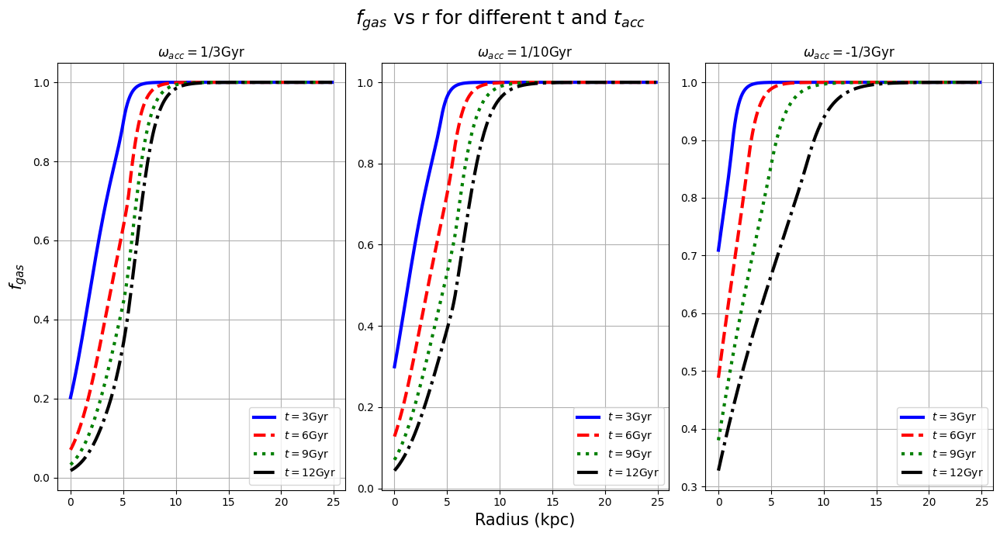

Execution time: 0.2740 seconds


In [41]:
f_gas_cutoff_ksl1 = np.divide(Sigma_gas_cutoff_ksl1, Sigma_bar_cutoff_ksl1)
f_gas_cutoff_ksl2 = np.divide(Sigma_gas_cutoff_ksl2, Sigma_bar_cutoff_ksl2)
f_gas_cutoff_ksl3 = np.divide(Sigma_gas_cutoff_ksl3, Sigma_bar_cutoff_ksl3)
f_gas_cutoff_ksl = np.array([f_gas_cutoff_ksl1, f_gas_cutoff_ksl2, f_gas_cutoff_ksl3])
np.savetxt(f'../data/data9_JAX_aKSL/f_gas1_radial_{np.log10(M_bar_t0)}_cutoff_ksl.txt', f_gas_cutoff_ksl1)
np.savetxt(f'../data/data9_JAX_aKSL/f_gas2_radial_{np.log10(M_bar_t0)}_cutoff_ksl.txt', f_gas_cutoff_ksl2)
np.savetxt(f'../data/data9_JAX_aKSL/f_gas3_radial_{np.log10(M_bar_t0)}_cutoff_ksl.txt', f_gas_cutoff_ksl3)

# Create a figure with three subplots
fig, axes = plt.subplots(nrows=1, ncols=3, sharex=True, sharey="col", figsize=(13, 7))

# Set the labels and titles of the subplots
f1 = axes[0]
f2 = axes[1]
f3 = axes[2]
fig.suptitle(r"$f_{gas}$ vs r for different t and $t_{acc}$", fontsize = 18)
f2.set_xlabel("Radius (kpc)", fontsize = 15)
f1.set_ylabel(r"$f_{gas}$", fontsize = 15)

for i, f_gas, t_accr in zip(range(3), f_gas_cutoff_ksl, t_acc):
    axes[i].plot(r[:index_r1]/1000, f_gas[:,index_t1][:index_r1], label=r"$t = 3$Gyr", color="blue", lw=3)
    axes[i].plot(r[:index_r1]/1000, f_gas[:,index_t2][:index_r1], label=r"$t = 6$Gyr", linestyle="dashed", color="red", lw=3)
    axes[i].plot(r[:index_r1]/1000, f_gas[:,index_t3][:index_r1], label=r"$t = 9$Gyr", linestyle="dotted", color="green", lw=3)
    axes[i].plot(r[:index_r1]/1000, f_gas[:,index_t4][:index_r1], label=r"$t = 12$Gyr", linestyle="dashdot", color="black", lw=3)
    axes[i].set_title(r"$\omega_{acc}=$"+f"{Fraction(1, int(t_accr))}Gyr")
    axes[i].legend()
    
# Add grid lines to each subplot and adjust layout
for ax in axes:
    ax.grid(True)

plt.tight_layout()
show()
fig.savefig(f'../outputs/graphs10_JAX_aKSL/f_gas vs r (t_acc variation, k={ki}).png')

## $M_{gas}$ vs t

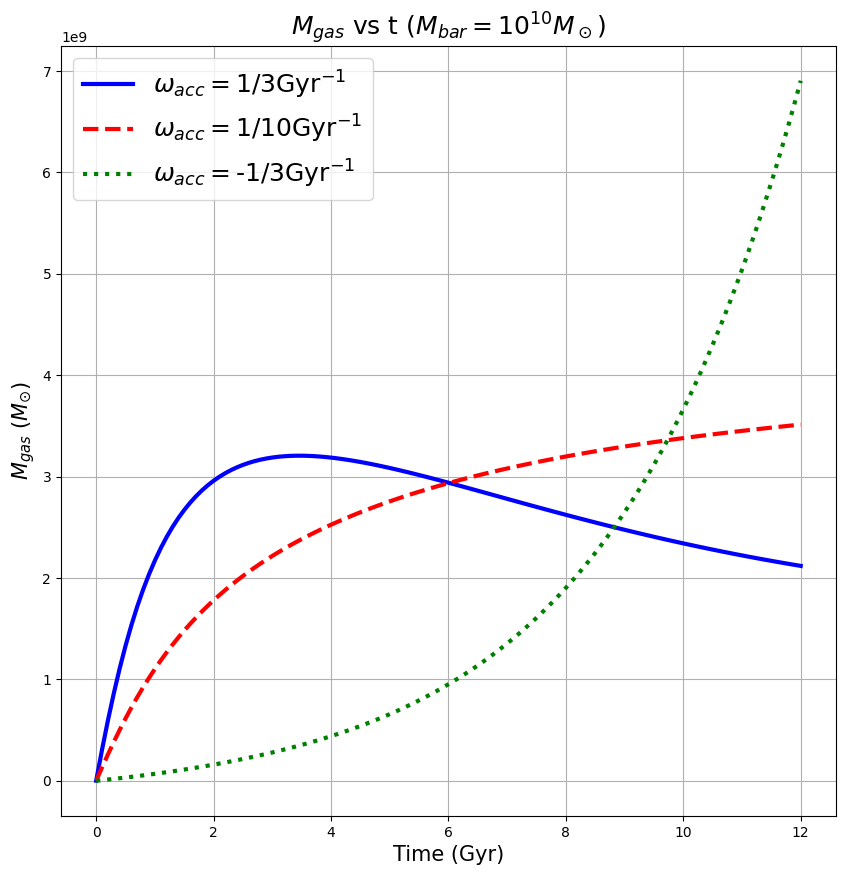

Execution time: 0.1298 seconds


In [42]:
dr = 120
integral_r = r.reshape(835,1)

Mass_gas_summed_cutoff_ksl1 = 2*np.pi*spint.simpson(integral_r*Sigma_gas_cutoff_ksl1, dx=dr, axis=0)
Mass_gas_summed_cutoff_ksl2 = 2*np.pi*spint.simpson(integral_r*Sigma_gas_cutoff_ksl2, dx=dr, axis=0)
Mass_gas_summed_cutoff_ksl3 = 2*np.pi*spint.simpson(integral_r*Sigma_gas_cutoff_ksl3, dx=dr, axis=0)
Mass_gas_summed_cutoff_ksl = np.array([Mass_gas_summed_cutoff_ksl1, Mass_gas_summed_cutoff_ksl2, Mass_gas_summed_cutoff_ksl3])
np.savetxt(f'../data/data9_JAX_aKSL/Mass_gas1_vs_t_{np.log10(M_bar_t0)}_cutoff_ksl.txt', Mass_gas_summed_cutoff_ksl1)
np.savetxt(f'../data/data9_JAX_aKSL/Mass_gas2_vs_t_{np.log10(M_bar_t0)}_cutoff_ksl.txt', Mass_gas_summed_cutoff_ksl2)
np.savetxt(f'../data/data9_JAX_aKSL/Mass_gas3_vs_t_{np.log10(M_bar_t0)}_cutoff_ksl.txt', Mass_gas_summed_cutoff_ksl3)

fig = figure(figsize=(10,10), facecolor='w')
frame = fig.add_subplot(1,1,1)
# frame.plot(M_times1[:-1], Mass_gas_summed_old_ksl1[:-1], label=fr"Standard KSL", color="blue", lw=3)
# frame.plot(M_times1[:-1], Mass_gas_summed_new_ksl1[:-1], label=fr"New Fitted KSL", linestyle="dashed", color="red", lw=3)
# frame.plot(M_times1[:-1], Mass_gas_summed_boissier1[:-1], label=fr"Boissier SFL", linestyle="dotted", color="green", lw=3)
frame.plot(M_times1[:-1], Mass_gas_summed_cutoff_ksl1[:-1], label=r"$\omega_{acc}=$"+f"{Fraction(1, int(t_acc[0]))}Gyr"+r'$^{-1}$', color="blue", lw=3)
frame.plot(M_times1[:-1], Mass_gas_summed_cutoff_ksl2[:-1], label=r"$\omega_{acc}=$"+f"{Fraction(1, int(t_acc[1]))}Gyr"+r'$^{-1}$', linestyle="dashed", color="red", lw=3)
frame.plot(M_times1[:-1], Mass_gas_summed_cutoff_ksl3[:-1], label=r"$\omega_{acc}=$"+f"{Fraction(1, int(t_acc[2]))}Gyr"+r'$^{-1}$', linestyle="dotted", color="green", lw=3)
frame.set_title(fr"$M_{{gas}}$ vs t ($M_{{bar}}=10^{{{np.log10(M_bar_t0):.0f}}}M_\odot$)", fontsize = 18)
frame.set_xlabel("Time (Gyr)", fontsize = 15)
frame.set_ylabel(r"$M_{gas}$ $(M_{\odot})$", fontsize = 15)
frame.legend(prop={'size': 18})
frame.grid()
show()
fig.savefig(f'../outputs/graphs10_JAX_aKSL/M_gas vs time (SFL variation, k={ki}).png')

## $M_{\star}$ vs t

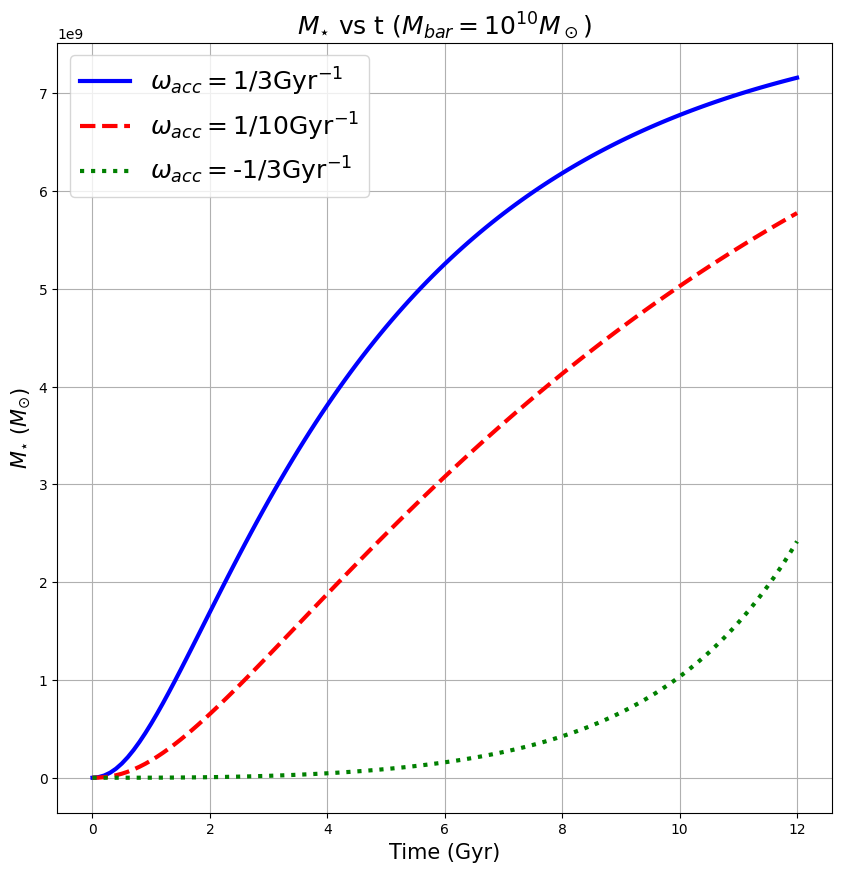

Execution time: 0.0964 seconds


In [43]:
Mass_sfr_summed_cutoff_ksl1 = 2*np.pi*spint.simpson(integral_r*M_sfrs_cutoff_ksl[0], dx=dr, axis=0)
Mass_sfr_summed_cutoff_ksl2 = 2*np.pi*spint.simpson(integral_r*M_sfrs_cutoff_ksl[1], dx=dr, axis=0)
Mass_sfr_summed_cutoff_ksl3 = 2*np.pi*spint.simpson(integral_r*M_sfrs_cutoff_ksl[2], dx=dr, axis=0)
Mass_time_star_cutoff_ksl_1 = dt*np.cumsum(Mass_sfr_summed_cutoff_ksl1)
Mass_time_star_cutoff_ksl_2 = dt*np.cumsum(Mass_sfr_summed_cutoff_ksl2)
Mass_time_star_cutoff_ksl_3 = dt*np.cumsum(Mass_sfr_summed_cutoff_ksl3)

np.savetxt(f'../data/data9_JAX_aKSL/Mass_SFR1_vs_t_{np.log10(M_bar_t0)}_cutoff_ksl.txt', Mass_sfr_summed_cutoff_ksl1)
np.savetxt(f'../data/data9_JAX_aKSL/Mass_SFR2_vs_t_{np.log10(M_bar_t0)}_cutoff_ksl.txt', Mass_sfr_summed_cutoff_ksl2)
np.savetxt(f'../data/data9_JAX_aKSL/Mass_SFR3_vs_t_{np.log10(M_bar_t0)}_cutoff_ksl.txt', Mass_sfr_summed_cutoff_ksl3)
np.savetxt(f'../data/data9_JAX_aKSL/Mass_star1_vs_t_{np.log10(M_bar_t0)}_cutoff_ksl.txt', Mass_time_star_cutoff_ksl_1)
np.savetxt(f'../data/data9_JAX_aKSL/Mass_star2_vs_t_{np.log10(M_bar_t0)}_cutoff_ksl.txt', Mass_time_star_cutoff_ksl_2)
np.savetxt(f'../data/data9_JAX_aKSL/Mass_star3_vs_t_{np.log10(M_bar_t0)}_cutoff_ksl.txt', Mass_time_star_cutoff_ksl_3)

fig = figure(figsize=(10,10), facecolor='w')
frame = fig.add_subplot(1,1,1)
frame.plot(M_times1[:-1], Mass_time_star_cutoff_ksl_1[:-1], label=r"$\omega_{acc}=$"+f"{Fraction(1, int(t_acc[0]))}Gyr"+r'$^{-1}$', color="blue", lw=3)
frame.plot(M_times1[:-1], Mass_time_star_cutoff_ksl_2[:-1], label=r"$\omega_{acc}=$"+f"{Fraction(1, int(t_acc[1]))}Gyr"+r'$^{-1}$', linestyle="dashed", color="red", lw=3)
frame.plot(M_times1[:-1], Mass_time_star_cutoff_ksl_3[:-1], label=r"$\omega_{acc}=$"+f"{Fraction(1, int(t_acc[2]))}Gyr"+r'$^{-1}$', linestyle="dotted", color="green", lw=3)
frame.set_title(fr"$M_{{\star}}$ vs t ($M_{{bar}}=10^{{{np.log10(M_bar_t0):.0f}}}M_\odot$)", fontsize = 18)
frame.set_xlabel("Time (Gyr)", fontsize = 15)
frame.set_ylabel(r"$M_{\star}$ $(M_{\odot})$", fontsize = 15)
frame.legend(prop={'size': 18})
frame.grid()
show()
fig.savefig(f'../outputs/graphs10_JAX_aKSL/M_star vs time (SFL variation, k={ki}).png')

## $M_{bar}$ vs t

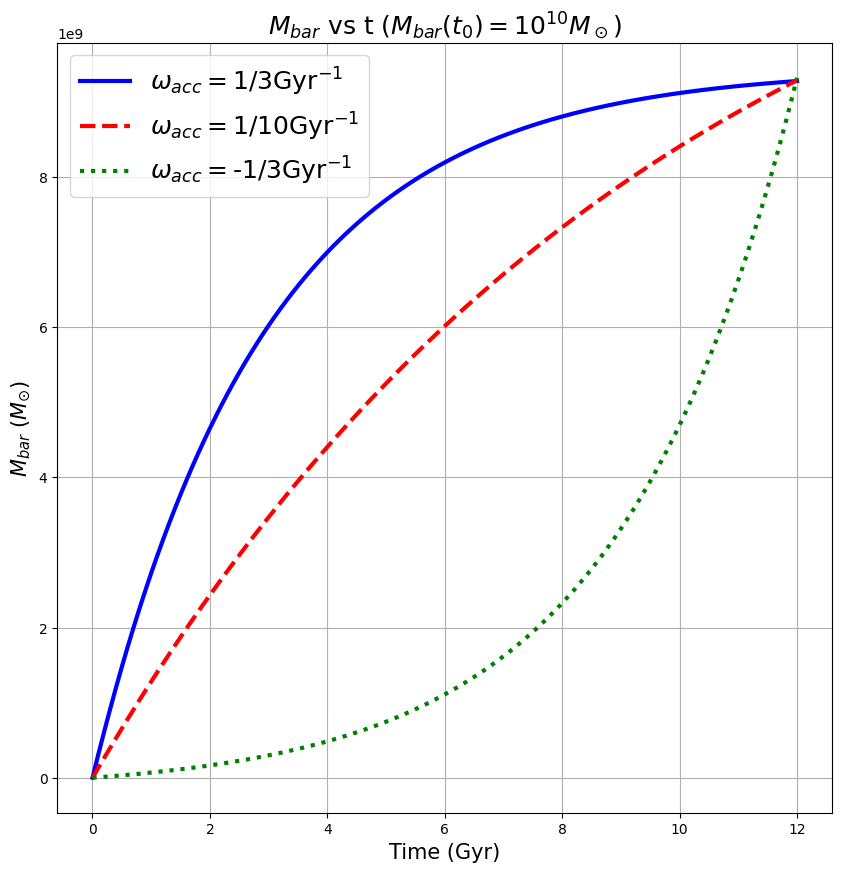

Execution time: 0.0906 seconds


In [44]:
Mass_time_bar_cutoff_ksl_1 = [np.sum(x) for x in zip(Mass_time_star_cutoff_ksl_1, Mass_gas_summed_cutoff_ksl1)]
Mass_time_bar_cutoff_ksl_2 = [np.sum(x) for x in zip(Mass_time_star_cutoff_ksl_2, Mass_gas_summed_cutoff_ksl2)]
Mass_time_bar_cutoff_ksl_3 = [np.sum(x) for x in zip(Mass_time_star_cutoff_ksl_3, Mass_gas_summed_cutoff_ksl3)]

np.savetxt(f'../data/data9_JAX_aKSL/Mass_bar1_vs_t_{np.log10(M_bar_t0)}_cutoff_ksl.txt', Mass_time_bar_cutoff_ksl_1)
np.savetxt(f'../data/data9_JAX_aKSL/Mass_bar2_vs_t_{np.log10(M_bar_t0)}_cutoff_ksl.txt', Mass_time_bar_cutoff_ksl_2)
np.savetxt(f'../data/data9_JAX_aKSL/Mass_bar3_vs_t_{np.log10(M_bar_t0)}_cutoff_ksl.txt', Mass_time_bar_cutoff_ksl_3)

fig = figure(figsize=(10,10), facecolor='w')
frame = fig.add_subplot(1,1,1)
frame.plot(M_times1[:-1], Mass_time_bar_cutoff_ksl_1[:-1], label=r"$\omega_{acc}=$"+f"{Fraction(1, int(t_acc[0]))}Gyr"+r'$^{-1}$', color="blue", lw=3)
frame.plot(M_times1[:-1], Mass_time_bar_cutoff_ksl_2[:-1], label=r"$\omega_{acc}=$"+f"{Fraction(1, int(t_acc[1]))}Gyr"+r'$^{-1}$', linestyle="dashed", color="red", lw=3)
frame.plot(M_times1[:-1], Mass_time_bar_cutoff_ksl_3[:-1], label=r"$\omega_{acc}=$"+f"{Fraction(1, int(t_acc[2]))}Gyr"+r'$^{-1}$', linestyle="dotted", color="green", lw=3)
# frame.plot(M_times1[:-1], Mass_time_bar_old_ksl_2[:-1], label=fr"Standard KSL", color="blue", lw=3)
# frame.plot(M_times1[:-1], Mass_time_bar_new_ksl_2[:-1], label=fr"New Fitted KSL", linestyle="dashed", color="red", lw=3)
# frame.plot(M_times1[:-1], Mass_time_bar_boissier_2[:-1], label=fr"Boissier SFL", linestyle="dotted", color="green", lw=3)
frame.set_title(fr"$M_{{bar}}$ vs t ($M_{{bar}}(t_0)=10^{{{np.log10(M_bar_t0):.0f}}}M_\odot$)", fontsize = 18)
frame.set_xlabel("Time (Gyr)", fontsize = 15)
frame.set_ylabel(r"$M_{bar}$ $(M_{\odot})$", fontsize = 15)
frame.legend(prop={'size': 18})
frame.grid()
show()
fig.savefig(f'../outputs/graphs10_JAX_aKSL/M_bar vs time (t_acc variation, k={ki}).png')

#  Global $f_{gas}$ vs t

/var/folders/hz/s07cwl6d5_v5tr1l0jp_v5dr0000gn/T/ipykernel_94638/3346488085.py:1: RuntimeWarning: invalid value encountered in divide
  f_global_gas_cutoff_ksl1 = np.divide(Mass_gas_summed_cutoff_ksl1, Mass_time_bar_cutoff_ksl_1)
/var/folders/hz/s07cwl6d5_v5tr1l0jp_v5dr0000gn/T/ipykernel_94638/3346488085.py:2: RuntimeWarning: invalid value encountered in divide
  f_global_gas_cutoff_ksl2 = np.divide(Mass_gas_summed_cutoff_ksl2, Mass_time_bar_cutoff_ksl_2)
/var/folders/hz/s07cwl6d5_v5tr1l0jp_v5dr0000gn/T/ipykernel_94638/3346488085.py:3: RuntimeWarning: invalid value encountered in divide
  f_global_gas_cutoff_ksl3 = np.divide(Mass_gas_summed_cutoff_ksl3, Mass_time_bar_cutoff_ksl_3)


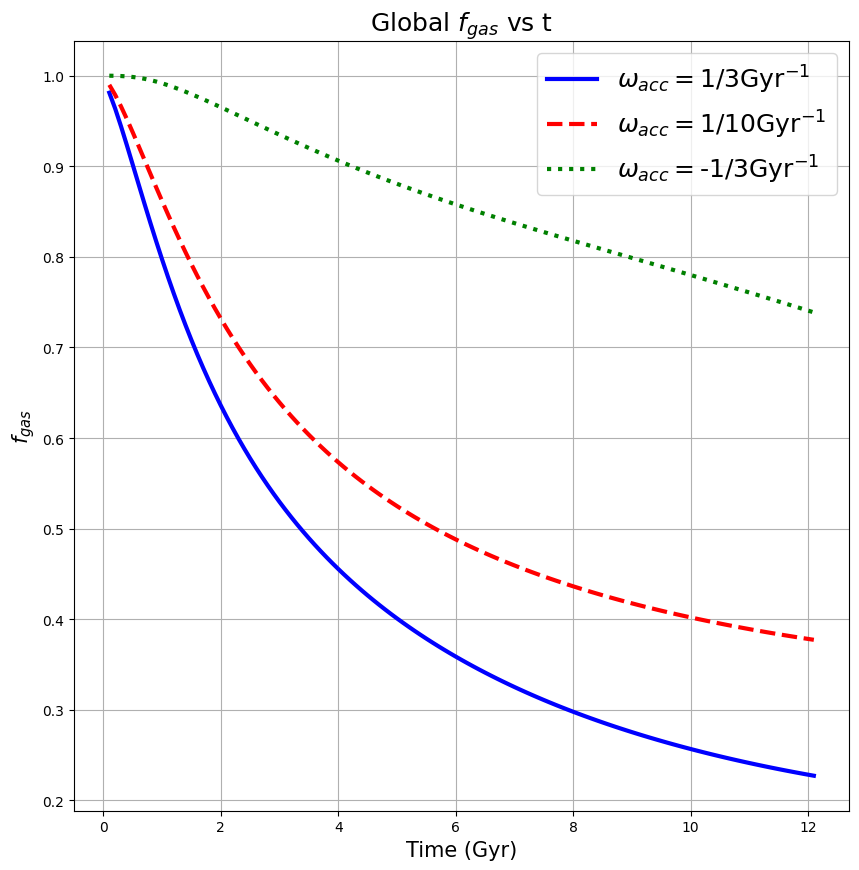

Execution time: 0.1027 seconds


In [45]:
f_global_gas_cutoff_ksl1 = np.divide(Mass_gas_summed_cutoff_ksl1, Mass_time_bar_cutoff_ksl_1)
f_global_gas_cutoff_ksl2 = np.divide(Mass_gas_summed_cutoff_ksl2, Mass_time_bar_cutoff_ksl_2)
f_global_gas_cutoff_ksl3 = np.divide(Mass_gas_summed_cutoff_ksl3, Mass_time_bar_cutoff_ksl_3)
np.savetxt(f'../data/data9_JAX_aKSL/f_gas1_vs_t_{np.log10(M_bar_t0)}_cutoff_ksl.txt', f_global_gas_cutoff_ksl1)
np.savetxt(f'../data/data9_JAX_aKSL/f_gas2_vs_t_{np.log10(M_bar_t0)}_cutoff_ksl.txt', f_global_gas_cutoff_ksl2)
np.savetxt(f'../data/data9_JAX_aKSL/f_gas3_vs_t_{np.log10(M_bar_t0)}_cutoff_ksl.txt', f_global_gas_cutoff_ksl3)

fig = figure(figsize=(10,10), facecolor='w')
frame = fig.add_subplot(1,1,1)
frame.plot(M_times1, f_global_gas_cutoff_ksl1, label=r"$\omega_{acc}=$"+f"{Fraction(1, int(t_acc[0]))}Gyr"+r'$^{-1}$', color="blue", lw=3)
frame.plot(M_times1, f_global_gas_cutoff_ksl2, label=r"$\omega_{acc}=$"+f"{Fraction(1, int(t_acc[1]))}Gyr"+r'$^{-1}$', linestyle="dashed", color="red", lw=3)
frame.plot(M_times1, f_global_gas_cutoff_ksl3, label=r"$\omega_{acc}=$"+f"{Fraction(1, int(t_acc[2]))}Gyr"+r'$^{-1}$', linestyle="dotted", color="green", lw=3)
frame.set_title(r"Global $f_{gas}$ vs t", fontsize = 18)
frame.set_xlabel("Time (Gyr)", fontsize = 15)
frame.set_ylabel(r"$f_{gas}$", fontsize = 15)
frame.legend(prop={'size': 18})
frame.grid()
show()
fig.savefig(f'../outputs/graphs10_JAX_aKSL/Global f_gas vs time (t_acc variation, k={ki}).png')

# Specific Angular Momentum $j_{bar}$

/var/folders/hz/s07cwl6d5_v5tr1l0jp_v5dr0000gn/T/ipykernel_94638/1233316197.py:19: RuntimeWarning: invalid value encountered in divide
  j_bar1 = np.divide(Nominator_bar1, Mass_time_bar_cutoff_ksl_1)
/var/folders/hz/s07cwl6d5_v5tr1l0jp_v5dr0000gn/T/ipykernel_94638/1233316197.py:20: RuntimeWarning: invalid value encountered in divide
  j_bar2 = np.divide(Nominator_bar2, Mass_time_bar_cutoff_ksl_2)
/var/folders/hz/s07cwl6d5_v5tr1l0jp_v5dr0000gn/T/ipykernel_94638/1233316197.py:21: RuntimeWarning: invalid value encountered in divide
  j_bar3 = np.divide(Nominator_bar3, Mass_time_bar_cutoff_ksl_3)


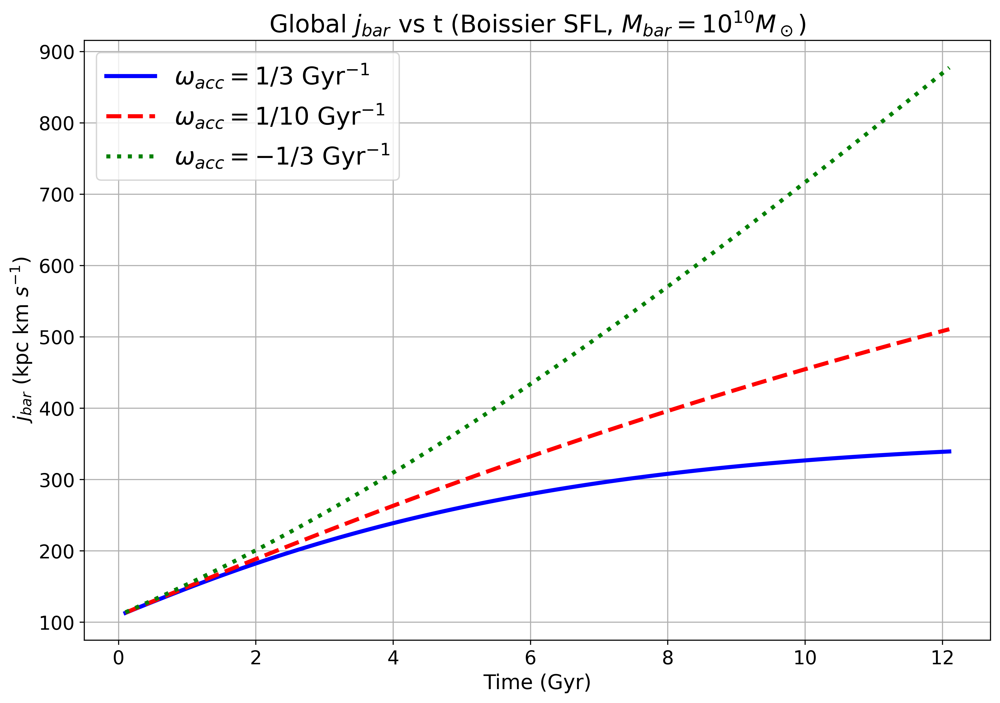

Execution time: 0.4940 seconds


In [46]:
SFL_type = "cutoff_ksl"

Nominator_gas1 = 2*np.pi*spint.simpson(integral_r**2*Sigma_gas_cutoff_ksl1*exp_vrot(integral_r, M_bar_t0), dx=dr, axis=0)
Nominator_gas2 = 2*np.pi*spint.simpson(integral_r**2*Sigma_gas_cutoff_ksl2*exp_vrot(integral_r, M_bar_t0), dx=dr, axis=0)
Nominator_gas3 = 2*np.pi*spint.simpson(integral_r**2*Sigma_gas_cutoff_ksl3*exp_vrot(integral_r, M_bar_t0), dx=dr, axis=0)

sfr_r_squared1 = 2*np.pi*spint.simpson(integral_r**2*M_sfrs_cutoff_ksl[0]*exp_vrot(integral_r, M_bar_t0), dx=dr, axis=0)
sfr_r_squared2 = 2*np.pi*spint.simpson(integral_r**2*M_sfrs_cutoff_ksl[1]*exp_vrot(integral_r, M_bar_t0), dx=dr, axis=0)
sfr_r_squared3 = 2*np.pi*spint.simpson(integral_r**2*M_sfrs_cutoff_ksl[2]*exp_vrot(integral_r, M_bar_t0), dx=dr, axis=0)

Nominator_star1 = dt*np.cumsum(sfr_r_squared1)
Nominator_star2 = dt*np.cumsum(sfr_r_squared2)
Nominator_star3 = dt*np.cumsum(sfr_r_squared3)

Nominator_bar1 = [np.sum(x) for x in zip(Nominator_star1, Nominator_gas1)]
Nominator_bar2 = [np.sum(x) for x in zip(Nominator_star2, Nominator_gas2)]
Nominator_bar3 = [np.sum(x) for x in zip(Nominator_star3, Nominator_gas3)]

j_bar1 = np.divide(Nominator_bar1, Mass_time_bar_cutoff_ksl_1)
j_bar2 = np.divide(Nominator_bar2, Mass_time_bar_cutoff_ksl_2)
j_bar3 = np.divide(Nominator_bar3, Mass_time_bar_cutoff_ksl_3)

np.savetxt('../data/data7/j_bar1_vs_t_'+f'{np.log10(M_bar_t0)}_'+f'{SFL_type}'+'.txt', j_bar1)
np.savetxt('../data/data7/j_bar2_vs_t_'+f'{np.log10(M_bar_t0)}_'+f'{SFL_type}'+'.txt', j_bar2)
np.savetxt('../data/data7/j_bar3_vs_t_'+f'{np.log10(M_bar_t0)}_'+f'{SFL_type}'+'.txt', j_bar3)

fig = figure(figsize=(12,8), dpi=400, facecolor='w')
frame = fig.add_subplot(1,1,1)
frame.plot(M_times1, j_bar1/1000, label=fr"$\omega_{{acc}} = {Fraction(1,int(t_acc[0]))}$ Gyr$^{{-1}}$", color="blue", lw=3)
frame.plot(M_times1, j_bar2/1000, label=fr"$\omega_{{acc}} = {Fraction(1,int(t_acc[1]))}$ Gyr$^{{-1}}$", linestyle="dashed", color="red", lw=3)
frame.plot(M_times1, j_bar3/1000, label=fr"$\omega_{{acc}} = {Fraction(1,int(t_acc[2]))}$ Gyr$^{{-1}}$", linestyle="dotted", color="green", lw=3)
frame.set_title(r"Global $j_{bar}$ vs t (Boissier SFL, $M_{bar}=10^{10}M_\odot$)", fontsize = 18)
frame.set_xlabel("Time (Gyr)", fontsize = 15)
frame.set_ylabel(r"$j_{bar}$ (kpc km $s^{-1}$)", fontsize = 15)
frame.legend(prop={'size': 18})
frame.tick_params(labelsize=14)
frame.grid()
show()
fig.savefig(f'../outputs/graphs10_JAX_aKSL/Global j_bar vs time (t_acc variation, k={ki}).png')

# Model Definer

In [47]:
def Full_final_definer(Mbar, t_acc_arr, star_formation_law, interpolator, res=120, Rmax=100.1, at_t0=True, ns=1, ks=1, atollerance=1e-8, rtollerance=1e-6):
    """
    Defines the global fraction of gas and baryonic specific angular momentum arrays.
    This function is self-contained; together with the Sigma_definer function, and the functions defining 
    the accretion radius and angular momentum, as well as the baryonic mass and rotational velocity, it 
    alone should give the arrays for the final FINAL graph.
    
    --------------
    Inputs:
        - Mbar (float)           --> Baryonic mass value for which you want to evaluate global gas fraction and 
                                     (specific) angular momentum.
        - t_acc_arr (np.array)   --> Array containing the accretion timescale values. This function now works 
                                     for any number of values within the array!
        - res (float)            --> (optional) Resolution of the radius array; gives the values of the radii at
                                     which values are evaluated. Default is 120 pc.
        - Rmax (float)           --> (optional) Maximum radius to evaluate. Default is 100.1 kpc. Together with
                                     res these defaults were chosen as to optimize run time and convergence of 
                                     specific angular momentum. 
        - at_t0 (bool)           --> (optional) Specifes whether to return just the values today (True), or the 
                                     entire evolution (False). Default is True.
        - ns (float)             --> (optional) Power parameter of the accreting angular momentum form. 
                                     Default is 1.
        - ks (float)             --> (optional) Slope parameter of the accreting angular momentum form. 
                                     Default is 1.
    
    Returns:
        - f_gas_array (np.array) --> Array containing, depending on at_t0, either the values of the global
                                     gas fraction today (t = 12Gyr), or in the entire evolution.
        - j_bar_array (np.array) --> Array containing, depending on at_t0, either the values of the specific
                                     angular momentum today (t = 12Gyr), or in the entire evolution.
    
    """
    
    r = np.arange(0,1000*Rmax,res)
    dr = res
    Mbar_full = np.full(M_times1.shape, Mbar)
    
    SD_gas = np.array([Sigma_definer(r, t_acc, Mbar, SFL_type=star_formation_law, interpolator=interpolator, n=ns, con=ks, atol=atollerance, rtol=rtollerance) for t_acc in t_acc_arr])
    if star_formation_law == "boissier":
        SD_sfr = np.array([SFL(sigma=SD_gas[i], sfl_type=star_formation_law, R=r, Mbar=Mbar_full) for i in range(len(SD_gas))])
    elif star_formation_law == "cutoff_ksl":
        SD_sfr = np.array([sfl_cutoff_array(SD_gas[i]) for i in range(len(SD_gas))])
    else:
        SD_sfr = np.array([SFL(sigma=SD_gas[i], sfl_type=star_formation_law, R=r, Mbar=Mbar) for i in range(len(SD_gas))])
    
    r = r.reshape(len(r),1)
    
    M_gas = np.array([2*np.pi*spint.simpson(r*SD_gas[i], dx=dr, axis=0) for i in range(len(SD_gas))])
    M_sfr = np.array([2*np.pi*spint.simpson(r*SD_sfr[i], dx=dr, axis=0) for i in range(len(SD_gas))])
    M_star = np.array([dt*np.cumsum(M_sfr[i]) for i in range(len(SD_gas))])
    M_bar = np.array([np.array([np.sum(x) for x in zip(M_star[i], M_gas[i])]) for i in range(len(SD_gas))])
    f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])

    #Mbar_allsame = np.full(len(M_bar[0]), M_bar[0][-1])
    #v_rot = v_btfr_def(Mbar_allsame[0])
    rv = rv_def(Mbar)
    
    nominator_gas = np.array([2*np.pi*spint.simpson(r**2*SD_gas[i]*exp_vrot(r, Mbar), dx=dr, axis=0) for i in range(len(SD_gas))])
    nominator_sfr = np.array([2*np.pi*spint.simpson(r**2*SD_sfr[i]*exp_vrot(r, Mbar), dx=dr, axis=0) for i in range(len(SD_gas))])
    nominator_star = np.array([dt*np.cumsum(nominator_sfr[i]) for i in range(len(SD_gas))])
    nominator_bar = np.array([np.array([np.sum(x) for x in zip(nominator_star[i], nominator_gas[i])]) for i in range(len(SD_gas))])
    j_bar = np.array([np.divide(nominator_bar[i], M_bar[i]) for i in range(len(SD_gas))])
    j_gas = np.array([np.divide(nominator_gas[i], M_gas[i]) for i in range(len(SD_gas))])
    j_star = np.array([np.divide(nominator_star[i], M_star[i]) for i in range(len(SD_gas))])
    
    M_star_t0 = M_star[:,-1]
    M_gas_t0  = M_gas[:,-1]
    
    if (at_t0==True):
        f_gas_array = f_gas_global[:,-1]
        j_bar_array = j_bar[:,-1]/1000
        j_gas_array = j_gas[:,-1]/1000
        j_star_array = j_star[:,-1]/1000
        return f_gas_array, j_bar_array, j_gas_array, j_star_array, M_star_t0, M_gas_t0
    else:
        f_gas_array = f_gas_global
        j_bar_array = j_bar/1000
        j_gas_array = j_gas/1000
        j_star_array = j_star/1000
        return f_gas_array, j_bar_array, j_gas_array, j_star_array, M_star, M_gas

def simpson_uniform_jax(y, dx, axis=0):
    """
    Simpson integration with uniform spacing dx in JAX.
    Handles both even and odd number of samples like scipy.integrate.simpson:
      - if N points => N-1 intervals
      - if (N-1) is odd (N even): Simpson on first N-1 points, trapezoid for last interval.
    """
    y = jnp.asarray(y)
    # move integration axis to 0 for convenience
    y = jnp.moveaxis(y, axis, 0)

    N = y.shape[0]

    # if N < 2, integral is zero
    if N < 2:
        return jnp.zeros_like(y[0])

    def simpson_all(y_local):
        w = jnp.ones(N)
        w = w.at[1:N-1:2].set(4.0)
        w = w.at[2:N-1:2].set(2.0)
        return dx / 3.0 * jnp.tensordot(w, y_local, axes=(0, 0))

    def simpson_plus_trap(y_local):
        # use Simpson on first N-1 points, trap on last interval
        Nsim = N - 1
        y_s = y_local[:Nsim] # Simpson part
        w = jnp.ones(Nsim)
        w = w.at[1:Nsim-1:2].set(4.0)
        w = w.at[2:Nsim-1:2].set(2.0)
        simp = dx / 3.0 * jnp.tensordot(w, y_s, axes=(0, 0))
        trap = dx * 0.5 * (y_local[-2] + y_local[-1])
        return simp + trap

    result = jax.lax.cond(
        (N % 2 == 1),
        simpson_all,
        simpson_plus_trap,
        y
    )

    return jnp.moveaxis(result, 0, axis)

@partial(jax.jit, static_argnames=("star_formation_law", "at_t0"))
def full_from_sigma_jax(SD_gas, Mbar, r_pc, dt, star_formation_law, at_t0=True):
    """
    SD_gas: (n_tacc, n_r, n_t)  Σ_gas in Msun/pc^2
    r_pc:   (n_r,) radii in pc
    dt:     scalar time step between entries in M_times1 (Gyr)
    Mbar:   scalar baryonic mass (Msun)

    Returns same outputs as your Full_final_definer (with /1000 for j).
    """
    SD_gas = jnp.asarray(SD_gas)
    r_pc = jnp.asarray(r_pc)
    dr = r_pc[1] - r_pc[0]

    n_tacc, n_r, n_t = SD_gas.shape

    r_col = r_pc[:, None]
    r2_col = r_col**2

    if star_formation_law != "cutoff_ksl":
        raise ValueError("full_from_sigma_jax currently implemented only for 'cutoff_ksl'.")

    # broadcast R just to satisfy the signature; it’s ignored for cutoff_ksl
    R_broad = r_col[None, :, :] # (1, n_r, 1) -> broadcasts to SD_gas
    Sigma_sfr = SFL_jax(SD_gas, "cutoff_ksl", R_broad, Mbar)  # (n_tacc, n_r, n_t)

    integrand_gas = r_col[None, :, :]*SD_gas
    integrand_sfr = r_col[None, :, :]*Sigma_sfr

    def integrate_radius(y):
        return 2.0 * jnp.pi * simpson_uniform_jax(y, dr, axis=0)

    M_gas = jax.vmap(integrate_radius)(integrand_gas)  
    M_sfr = jax.vmap(integrate_radius)(integrand_sfr)  

    M_star = dt*jnp.cumsum(M_sfr, axis=-1)           
    M_bar_tot = M_star + M_gas

    f_gas_global = M_gas / M_bar_tot                   

    v_rot = exp_vrot_jax(r_pc, Mbar)[:, None]
    integrand_gas_j = r2_col[None,:,:]*SD_gas*v_rot[None, :, :]
    integrand_sfr_j = r2_col[None,:,:]*Sigma_sfr*v_rot[None, :, :]

    def integrate_radius_j(y):
        return 2.0 * jnp.pi * simpson_uniform_jax(y, dr, axis=0)

    nom_gas  = jax.vmap(integrate_radius_j)(integrand_gas_j)
    nom_sfr  = jax.vmap(integrate_radius_j)(integrand_sfr_j)
    nom_star = dt * jnp.cumsum(nom_sfr, axis=-1)
    nom_bar  = nom_star + nom_gas

    j_bar  = nom_bar / jnp.where(M_bar_tot > 0, M_bar_tot, jnp.inf)
    j_gas  = nom_gas/ jnp.where(M_gas > 0, M_gas, jnp.inf)
    j_star = nom_star / jnp.where(M_star > 0, M_star, jnp.inf)

    if at_t0:
        f_gas_array  = f_gas_global[:, -1]
        j_bar_array  = j_bar[:, -1]/1000.0
        j_gas_array  = j_gas[:, -1]/1000.0
        j_star_array = j_star[:, -1]/1000.0
        M_star_t0    = M_star[:, -1]
        M_gas_t0     = M_gas[:, -1]
        return f_gas_array, j_bar_array, j_gas_array, j_star_array, M_star_t0, M_gas_t0
    else:
        return (f_gas_global,
                j_bar  / 1000.0,
                j_gas  / 1000.0,
                j_star / 1000.0,
                M_star,
                M_gas)

def C_def_jax(M_bar, t_acc, t0=12.0):
    """
    JAX-friendly version of C_def.
    """
    t_acc = jnp.asarray(t_acc, dtype=jnp.float64)

    pos = t_acc > 0.0
    neg = t_acc < 0.0
    infmask = jnp.isinf(t_acc)

    # positive t_acc
    C_pos = M_bar / (t_acc * (1.0 - jnp.exp(-t0 / t_acc)))

    # negative t_acc
    abs_t = jnp.abs(t_acc)
    C_neg = M_bar / (abs_t * (jnp.exp(t0 / abs_t) - 1.0))

    # infinite t_acc
    C_inf = M_bar / t0

    C = jnp.where(pos, C_pos, C_neg)
    C = jnp.where(infmask, C_inf, C)

    return C

@partial(jax.jit, static_argnames=("star_formation_law", "res", "Rmax", "at_t0"))
def Full_final_definer_jax(Mbar,
                           t_acc_arr,
                           star_formation_law,
                           r_acc_matrix_for_all_M_jax,
                           log_M_bar_array_jax,
                           res=120,
                           Rmax=100.1,
                           at_t0=True):
    """
    Fully JAX version. Works with t_acc_arr as a jnp.array and
    can be called inside a jitted mass loop.

    Mbar : scalar (Msun)
    t_acc_arr : 1D jnp.array (n_tacc,) of accretion times (Gyr)
    r_acc_matrix_for_all_M_jax : (n_M, n_t) in kpc
    log_M_bar_array_jax : (n_M,) grid used for r_acc_matrix
    """

    # radius grid in pc (static because res, Rmax are static)
    r_pc = jnp.arange(0.0, 1000.0*Rmax, res, dtype=jnp.float64)

    # precompute C(t_acc) for all t_acc
    C_vals = C_def_jax(Mbar, t_acc_arr)   # shape (n_tacc,)

    # vectorised call to Sigma_definer_jax over t_acc
    def sigma_for_one_tacc(t_acc_single, C_single):
        return Sigma_definer_jax(
            r_pc,
            t_acc_single,
            Mbar,
            C_single,
            star_formation_law,
            r_acc_matrix_for_all_M_jax,
            log_M_bar_array_jax,
        )

    SD_gas = jax.vmap(sigma_for_one_tacc, in_axes=(0, 0))(t_acc_arr, C_vals)

    # post-process entirely in JAX
    return full_from_sigma_jax(
        SD_gas,
        Mbar,
        r_pc,
        dt,
        star_formation_law,
        at_t0=at_t0,
    )

def process_mbar(M, t_acc_array, star_formation_law, interpolator, ns, ks):
    """
    Implements multiprocessing
    """
    return Full_final_definer(10**M, t_acc_array, star_formation_law, interpolator, ns=ns, ks=ks)


Execution time: 0.0062 seconds


In [48]:
@partial(jax.jit, static_argnames=("star_formation_law"))
def run_all_masses(Mbar_grid,
                   t_acc_arr,
                   r_acc_matrix_for_all_M_jax,
                   log_M_bar_array_jax,
                   star_formation_law):

    def per_mass(Mbar):
        return Full_final_definer_jax(
            Mbar,
            t_acc_arr,
            star_formation_law,
            r_acc_matrix_for_all_M_jax,
            log_M_bar_array_jax,
            at_t0=True,
        )

    f_gas_all, j_bar_all, j_gas_all, j_star_all, Ms_all, Mg_all = \
        jax.vmap(per_mass)(Mbar_grid)

    return f_gas_all, j_bar_all, j_gas_all, j_star_all, Ms_all, Mg_all

Execution time: 0.0005 seconds


# New KSL with Cutoff

## Experiments for k and n

In [46]:
log_M_bar_array_testing = np.linspace(8, 11.5, 30)
t_acc_array_testing = np.array([1,3,10,25,-10,5,-3])

Execution time: 0.0011 seconds


n = 0.3, k = 0.5


/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar = np.array([np.divide(nominator_bar[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:63: RuntimeWarning: invalid value encountered in divide
  j_gas = np.array([np.divide(nominator_gas[i], M_gas[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:64: RuntimeWarning: invalid value encountered in divide
  j_star = np.array([np.divide(nominator_star[i], M_star[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar

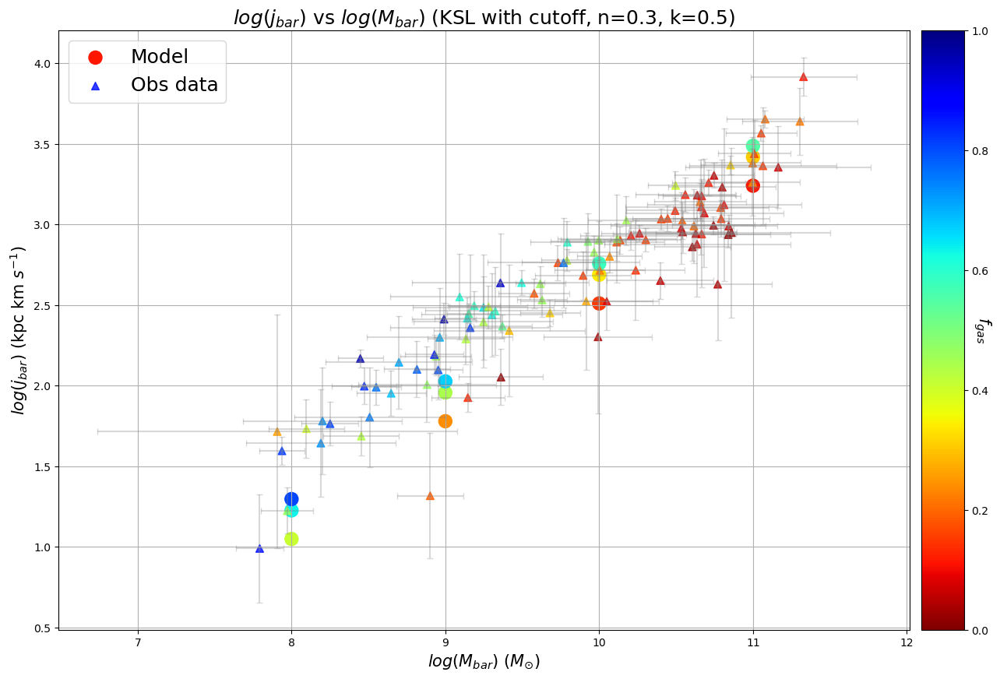

n = 0.3, k = 1.0


/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar = np.array([np.divide(nominator_bar[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:63: RuntimeWarning: invalid value encountered in divide
  j_gas = np.array([np.divide(nominator_gas[i], M_gas[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:64: RuntimeWarning: invalid value encountered in divide
  j_star = np.array([np.divide(nominator_star[i], M_star[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar

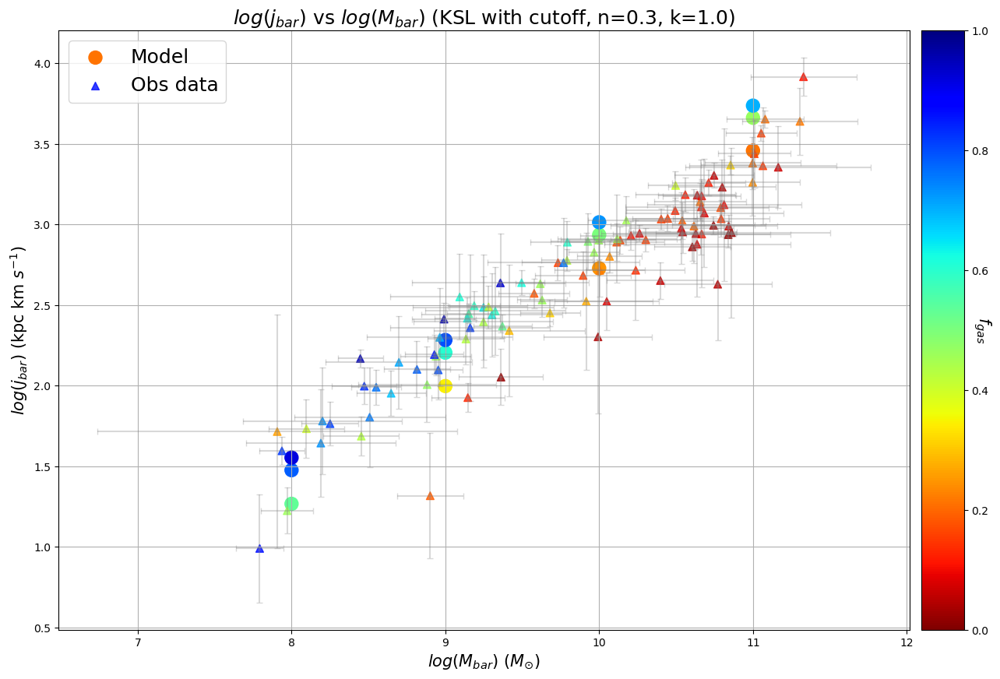

n = 0.3, k = 1.5


/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar = np.array([np.divide(nominator_bar[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:63: RuntimeWarning: invalid value encountered in divide
  j_gas = np.array([np.divide(nominator_gas[i], M_gas[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:64: RuntimeWarning: invalid value encountered in divide
  j_star = np.array([np.divide(nominator_star[i], M_star[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar

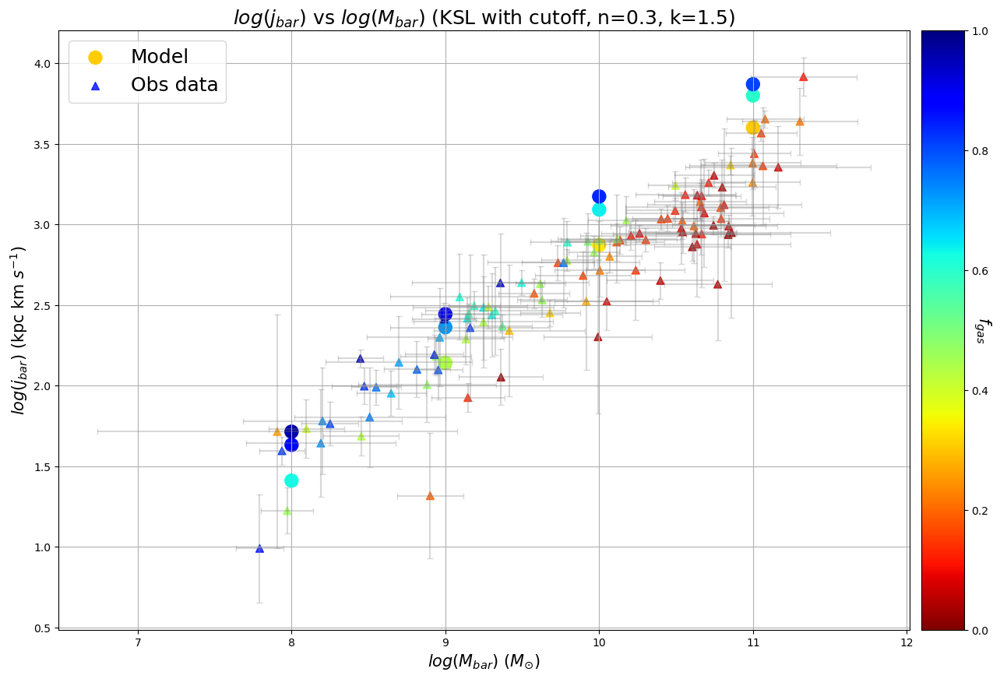

n = 0.3, k = 2.0


/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar = np.array([np.divide(nominator_bar[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:63: RuntimeWarning: invalid value encountered in divide
  j_gas = np.array([np.divide(nominator_gas[i], M_gas[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:64: RuntimeWarning: invalid value encountered in divide
  j_star = np.array([np.divide(nominator_star[i], M_star[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar

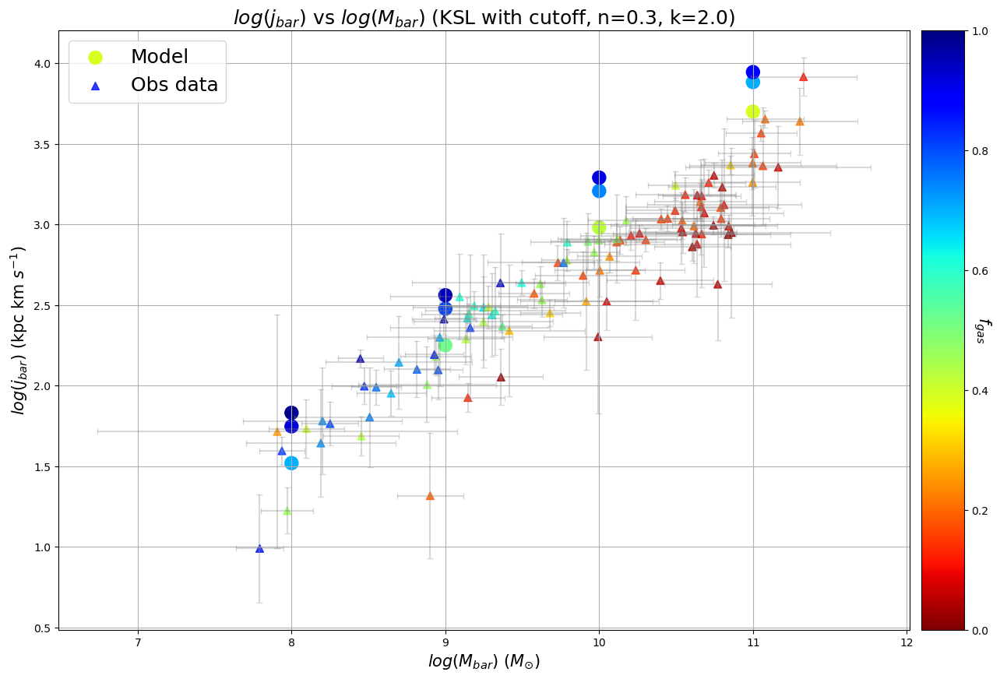

n = 0.5, k = 0.5


/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar = np.array([np.divide(nominator_bar[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:63: RuntimeWarning: invalid value encountered in divide
  j_gas = np.array([np.divide(nominator_gas[i], M_gas[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:64: RuntimeWarning: invalid value encountered in divide
  j_star = np.array([np.divide(nominator_star[i], M_star[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar

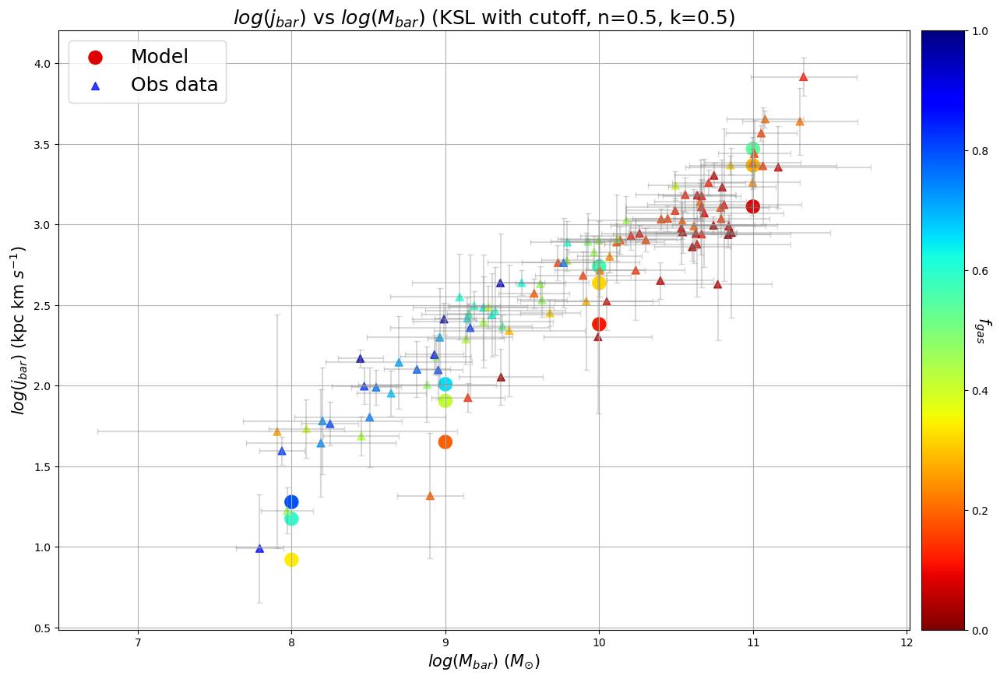

n = 0.5, k = 1.0


/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar = np.array([np.divide(nominator_bar[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:63: RuntimeWarning: invalid value encountered in divide
  j_gas = np.array([np.divide(nominator_gas[i], M_gas[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:64: RuntimeWarning: invalid value encountered in divide
  j_star = np.array([np.divide(nominator_star[i], M_star[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar

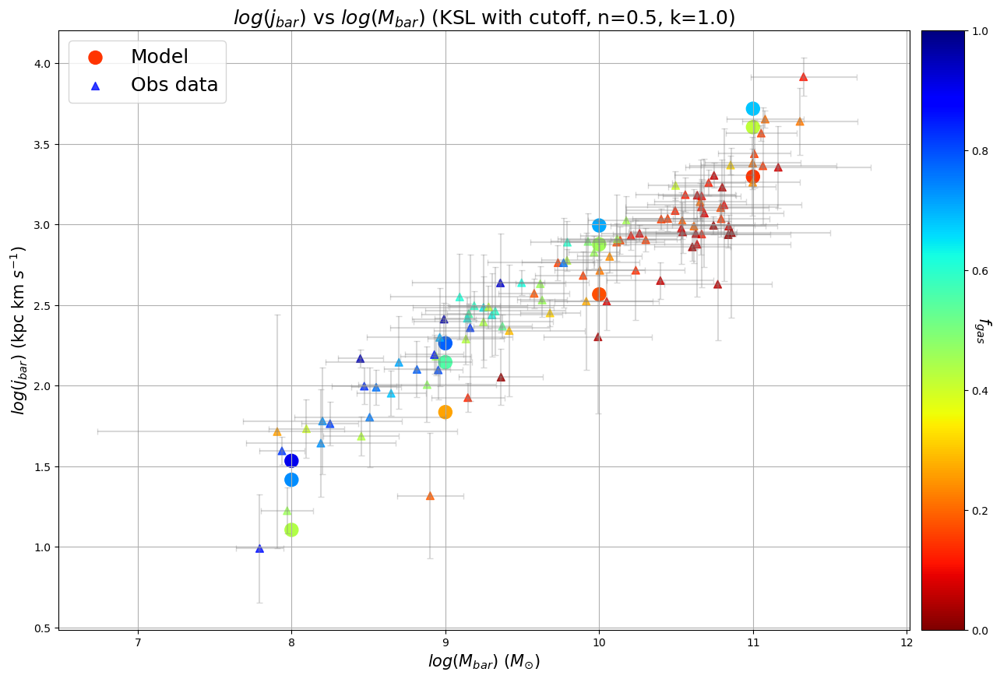

n = 0.5, k = 1.5


/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar = np.array([np.divide(nominator_bar[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:63: RuntimeWarning: invalid value encountered in divide
  j_gas = np.array([np.divide(nominator_gas[i], M_gas[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:64: RuntimeWarning: invalid value encountered in divide
  j_star = np.array([np.divide(nominator_star[i], M_star[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar

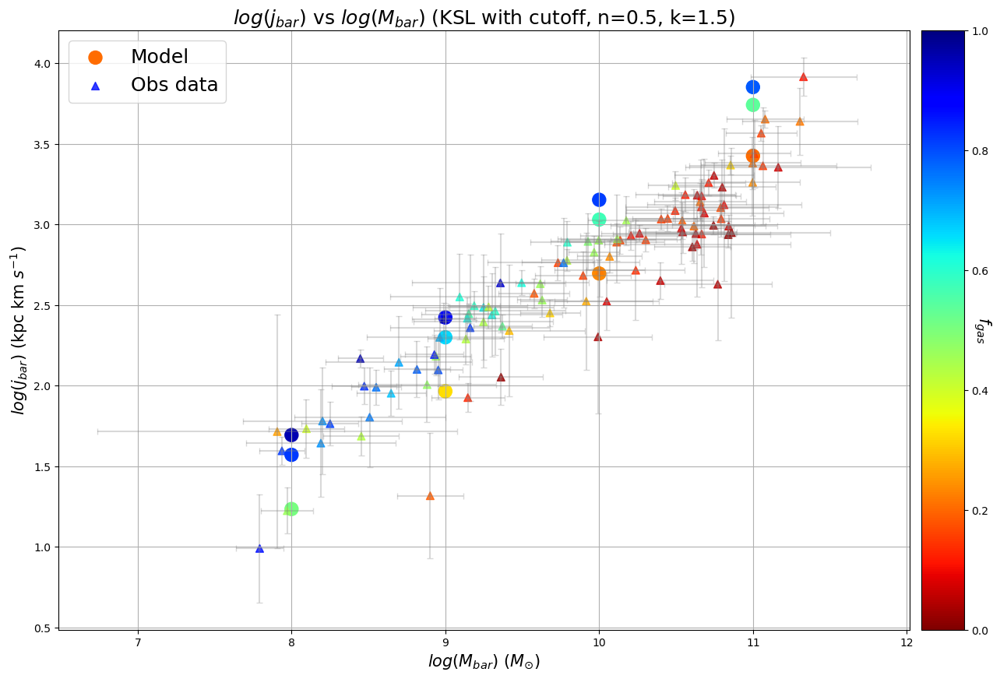

n = 0.5, k = 2.0


/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar = np.array([np.divide(nominator_bar[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:63: RuntimeWarning: invalid value encountered in divide
  j_gas = np.array([np.divide(nominator_gas[i], M_gas[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:64: RuntimeWarning: invalid value encountered in divide
  j_star = np.array([np.divide(nominator_star[i], M_star[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar

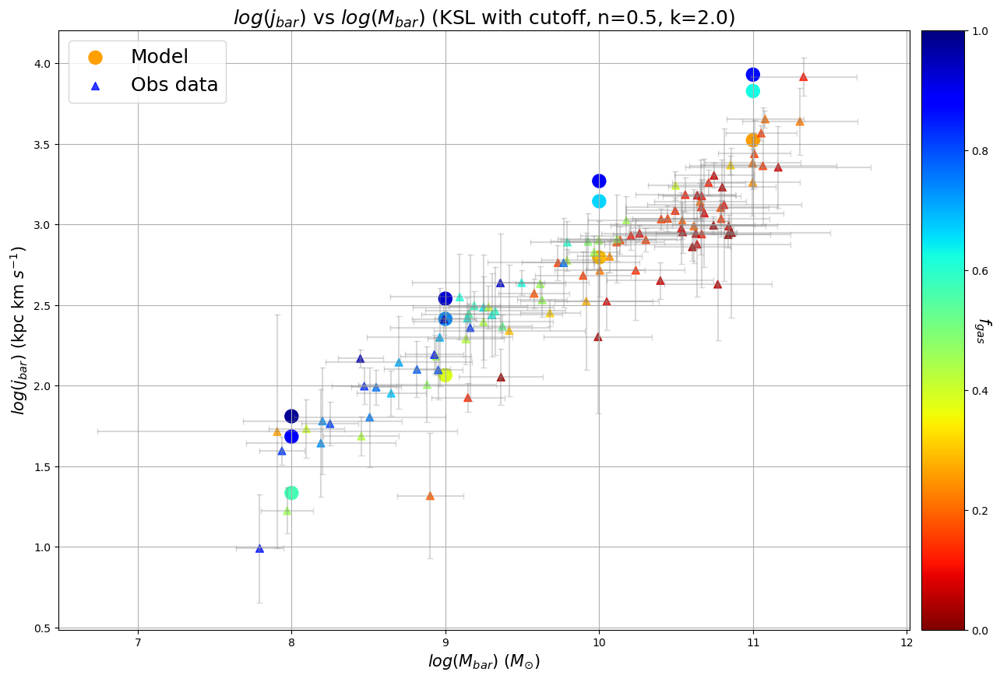

n = 1.0, k = 0.5


/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar = np.array([np.divide(nominator_bar[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:63: RuntimeWarning: invalid value encountered in divide
  j_gas = np.array([np.divide(nominator_gas[i], M_gas[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:64: RuntimeWarning: invalid value encountered in divide
  j_star = np.array([np.divide(nominator_star[i], M_star[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar

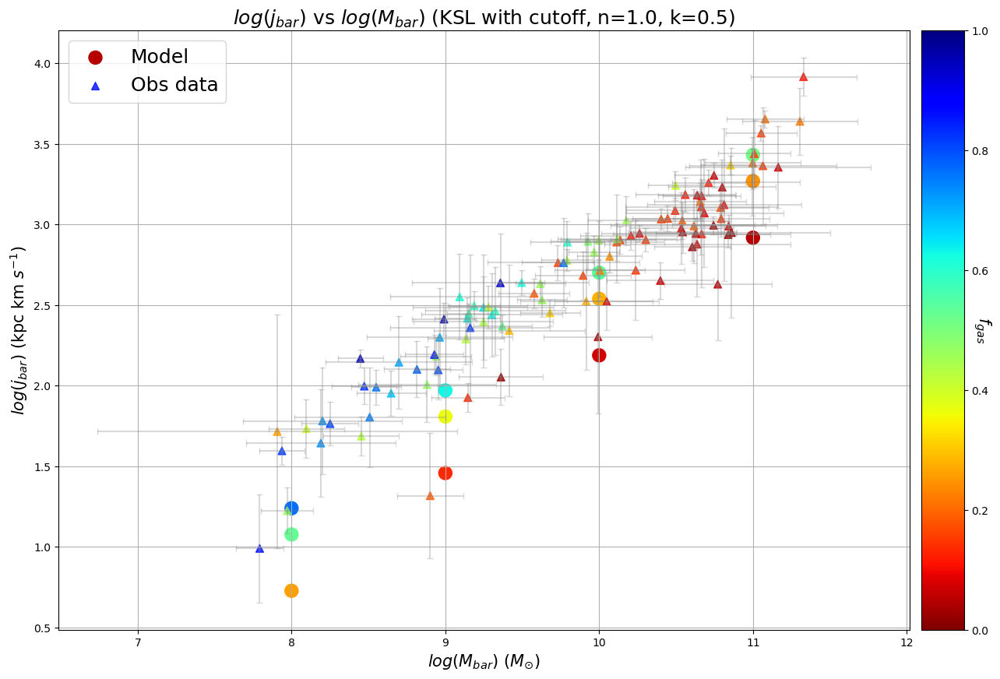

n = 1.0, k = 1.0


/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar = np.array([np.divide(nominator_bar[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:63: RuntimeWarning: invalid value encountered in divide
  j_gas = np.array([np.divide(nominator_gas[i], M_gas[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:64: RuntimeWarning: invalid value encountered in divide
  j_star = np.array([np.divide(nominator_star[i], M_star[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar

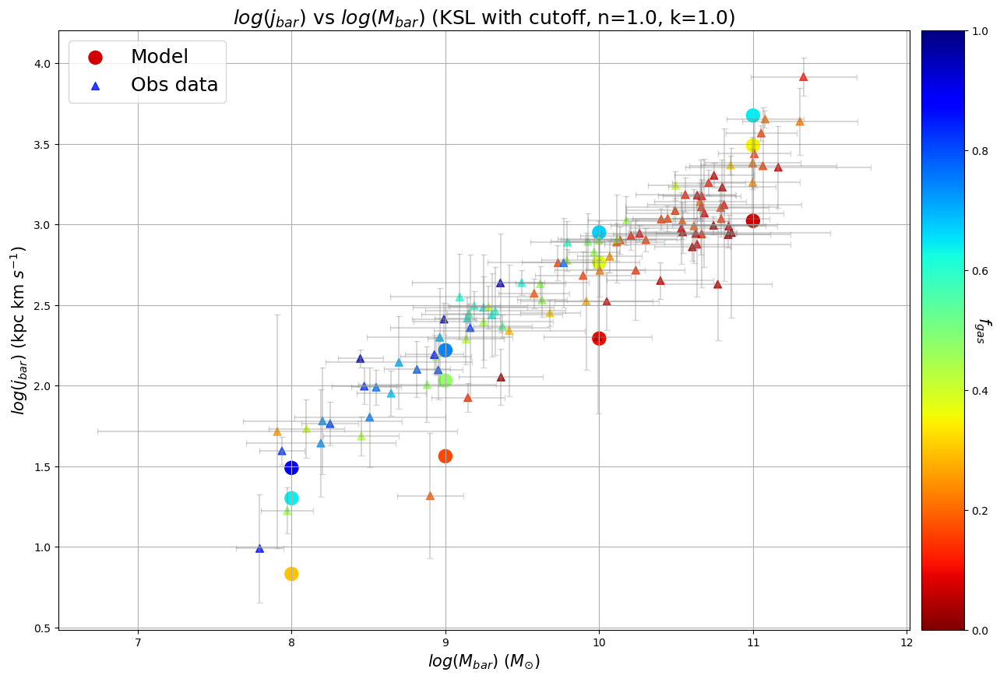

n = 1.0, k = 1.5


/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar = np.array([np.divide(nominator_bar[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:63: RuntimeWarning: invalid value encountered in divide
  j_gas = np.array([np.divide(nominator_gas[i], M_gas[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:64: RuntimeWarning: invalid value encountered in divide
  j_star = np.array([np.divide(nominator_star[i], M_star[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar

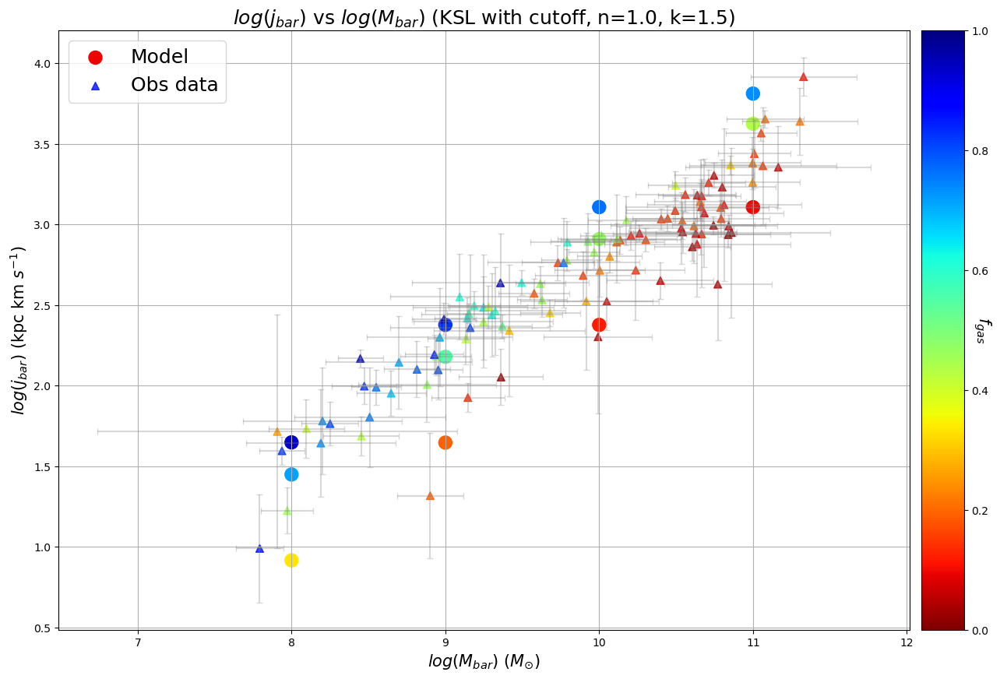

n = 1.0, k = 2.0


/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar = np.array([np.divide(nominator_bar[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:63: RuntimeWarning: invalid value encountered in divide
  j_gas = np.array([np.divide(nominator_gas[i], M_gas[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:64: RuntimeWarning: invalid value encountered in divide
  j_star = np.array([np.divide(nominator_star[i], M_star[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar

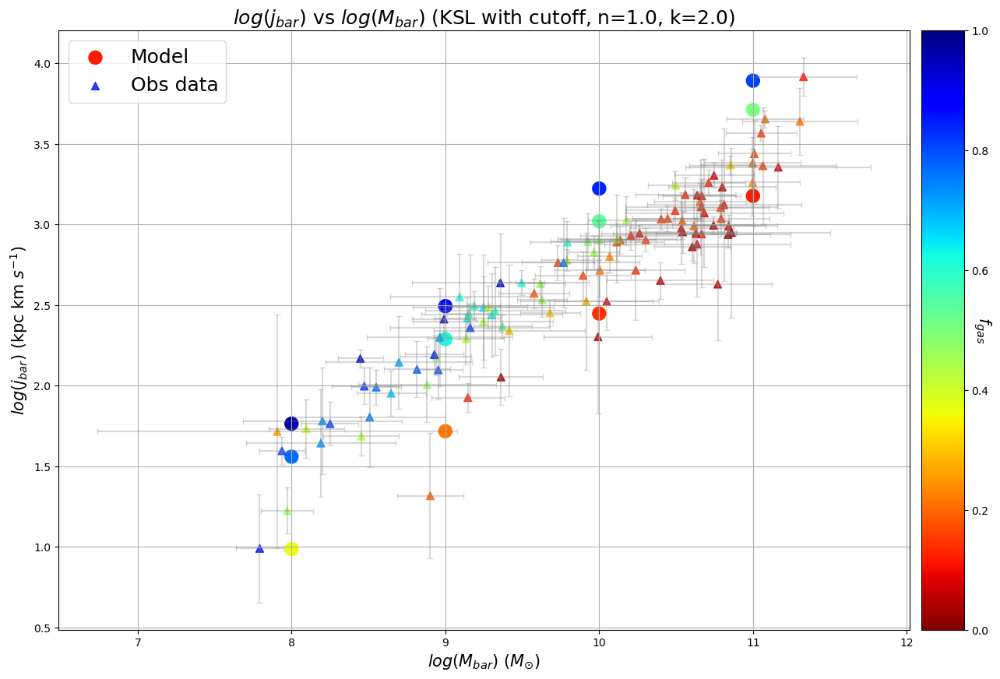

n = 1.5, k = 0.5


/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar = np.array([np.divide(nominator_bar[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:63: RuntimeWarning: invalid value encountered in divide
  j_gas = np.array([np.divide(nominator_gas[i], M_gas[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:64: RuntimeWarning: invalid value encountered in divide
  j_star = np.array([np.divide(nominator_star[i], M_star[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar

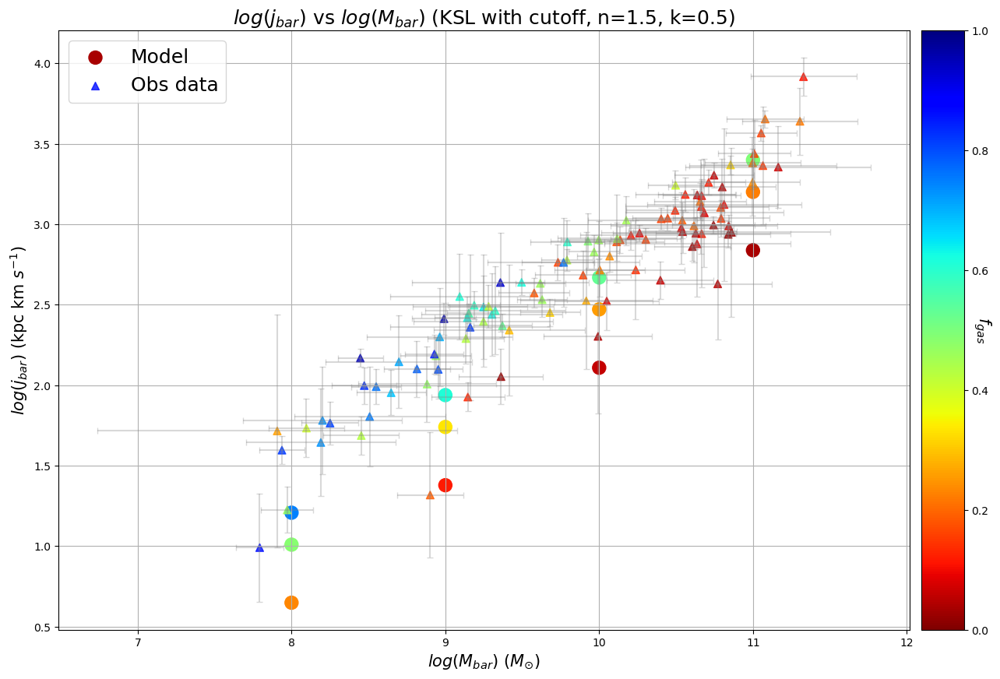

n = 1.5, k = 1.0


/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar = np.array([np.divide(nominator_bar[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:63: RuntimeWarning: invalid value encountered in divide
  j_gas = np.array([np.divide(nominator_gas[i], M_gas[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:64: RuntimeWarning: invalid value encountered in divide
  j_star = np.array([np.divide(nominator_star[i], M_star[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar

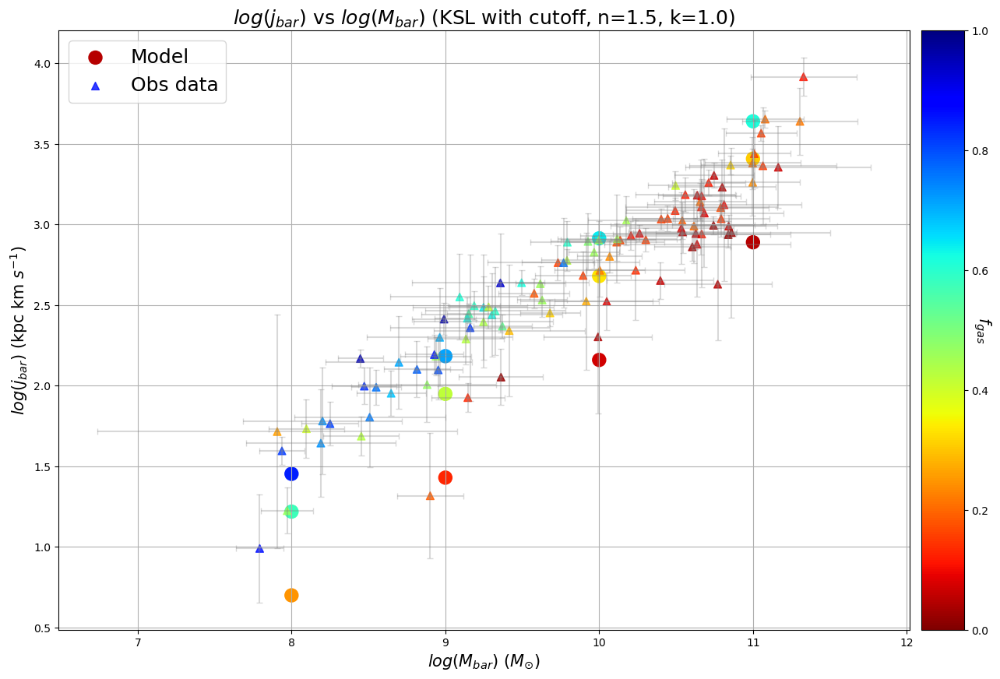

n = 1.5, k = 1.5


/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar = np.array([np.divide(nominator_bar[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:63: RuntimeWarning: invalid value encountered in divide
  j_gas = np.array([np.divide(nominator_gas[i], M_gas[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:64: RuntimeWarning: invalid value encountered in divide
  j_star = np.array([np.divide(nominator_star[i], M_star[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar

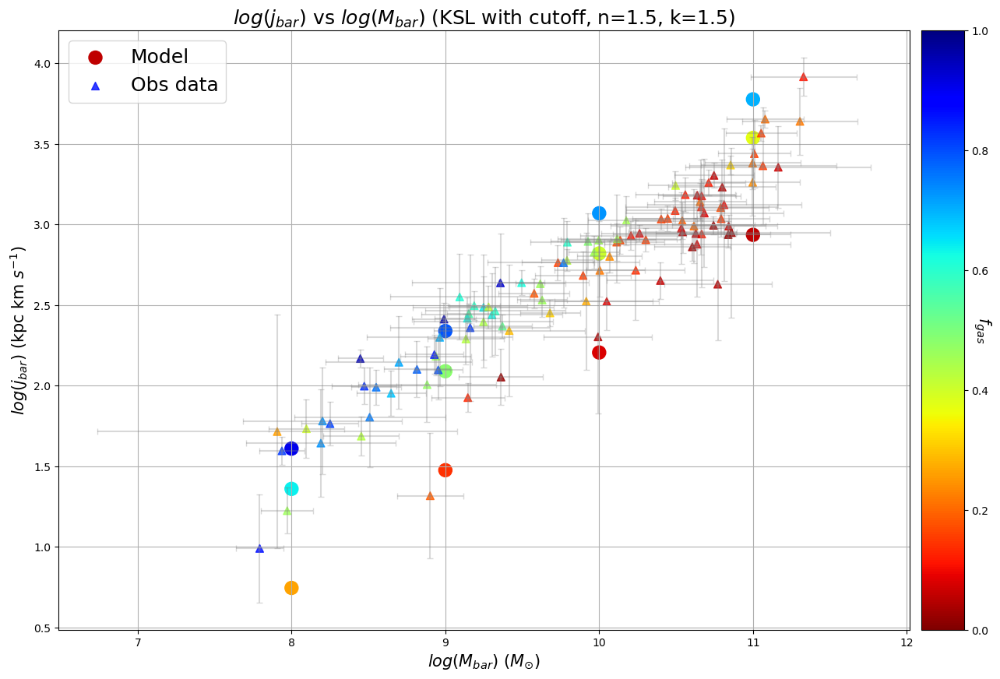

n = 1.5, k = 2.0


/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar = np.array([np.divide(nominator_bar[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:63: RuntimeWarning: invalid value encountered in divide
  j_gas = np.array([np.divide(nominator_gas[i], M_gas[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:64: RuntimeWarning: invalid value encountered in divide
  j_star = np.array([np.divide(nominator_star[i], M_star[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar

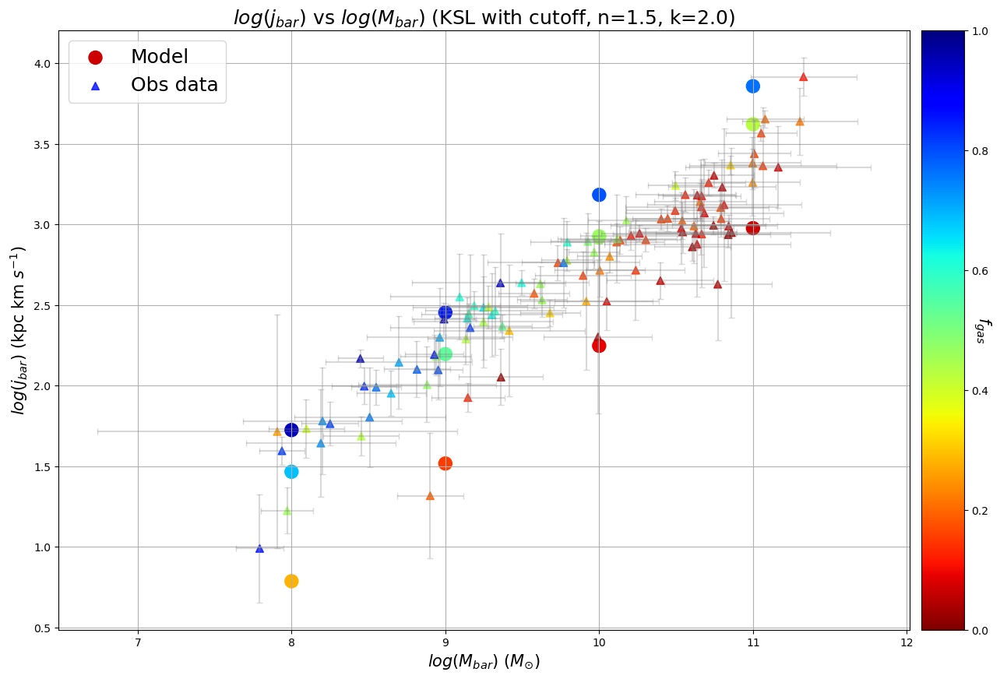

Execution time: 552.9589 seconds


In [ ]:
# for j, n, w, k in zip(range(len(n_values)), n_values, range(len(k_values)), k_values):

for j, n in enumerate(n_values):
    for w, k in enumerate(k_values):
        print(f"n = {n}, k = {k}")

        f_gas_array_temp_cutoff_ksl = np.zeros((len(log_M_bar_array_testing),len(t_acc_array_testing)))
        j_bar_array_temp_cutoff_ksl = np.zeros((len(log_M_bar_array_testing),len(t_acc_array_testing)))

        racc_interp = r_acc_interpolators_matrix[j, w]

        process_mbar_cutoff_ksl = partial(process_mbar, t_acc_array=t_acc_array_testing, star_formation_law="cutoff_ksl", interpolator=racc_interp, ns=n, ks=k)

        print(f'Running multiprocessing for M_bar models with {os.cpu_count()} CPUs...')
        with ProcessPoolExecutor() as executor:
            results = list(executor.map(process_mbar_cutoff_ksl, log_M_bar_array_testing))

        for i, (f_gas_temp, j_bar_temp,_, _, _, _) in enumerate(results):
            f_gas_array_temp_cutoff_ksl[i] = f_gas_temp
            j_bar_array_temp_cutoff_ksl[i] = j_bar_temp

        log_j_bar_array_temp = np.log10(j_bar_array_temp_cutoff_ksl)

        cmap = cm.jet_r
        mpl.rc("image", cmap="jet_r")
        fig = figure(figsize=(15,10),  facecolor='w')
        frame = fig.add_subplot(1,1,1)

        #Model
        divider = make_axes_locatable(frame)
        colbarframe1 = divider.append_axes("right", size="5%", pad=0.15)
        for x, y, z in zip(log_M_bar_array_testing, log_j_bar_array_temp, f_gas_array_temp_cutoff_ksl):
            mod = frame.scatter([x]*len(y), y, facecolors=cmap(z), s=150)
        mod.set_label("Model")
        cbar1 = fig.colorbar(mod, cax=colbarframe1)
        cbar1.set_label(r"$f_{gas}$", rotation=270, fontsize=15)

        #Data
        frame.scatter(obs_log_Mbar, obs_log_jbar, label="Obs data", marker="^", facecolors=cmap(BARY['fgas']), s=50, alpha=0.8)
        frame.errorbar(obs_log_Mbar, obs_log_jbar, xerr=obs_log_Mbar_errors, yerr=obs_log_jbar_errors, fmt = ' ', ecolor = 'grey', capsize = 3, alpha=0.3)

        frame.set_title(r"$log(j_{bar})$ vs $log(M_{bar})$ (KSL with cutoff"+f", n={n}, k={k})", fontsize = 18)
        frame.set_xlabel(r"$log(M_{bar})$ $(M_{\odot})$", fontsize = 15)
        frame.set_ylabel(r"$log(j_{bar})$ (kpc km $s^{-1}$)", fontsize = 15)
        frame.legend(prop={'size': 18})
        frame.grid()
        show()

# MCMC running

In [49]:
@partial(jax.jit, static_argnames=("star_formation_law", "at_t0"))
def full_from_sigma_jax_mcmc(SD_gas, Mbar, r_pc, dt, star_formation_law, at_t0=True):
    """
    SD_gas: (n_tacc, n_r, n_t)  Σ_gas in Msun/pc^2
    r_pc:   (n_r,) radii in pc
    dt:     scalar time step between entries in M_times1 (Gyr)
    Mbar:   scalar baryonic mass (Msun)

    Returns same outputs as your Full_final_definer (with /1000 for j).
    """
    SD_gas = jnp.asarray(SD_gas)
    r_pc = jnp.asarray(r_pc)
    dr = r_pc[1] - r_pc[0]

    n_tacc, n_r, n_t = SD_gas.shape

    r_col = r_pc[:, None]
    r2_col = r_col**2

    if star_formation_law != "cutoff_ksl":
        raise ValueError("full_from_sigma_jax currently implemented only for 'cutoff_ksl'.")

    R_broad = r_col[None, :, :]
    Sigma_sfr = SFL_jax(SD_gas, "cutoff_ksl", R_broad, Mbar)  # (n_tacc, n_r, n_t)

    integrand_gas = r_col[None, :, :]*SD_gas
    integrand_sfr = r_col[None, :, :]*Sigma_sfr

    def integrate_radius(y):
        return 2.0 * jnp.pi * simpson_uniform_jax(y, dr, axis=0)

    M_gas = jax.vmap(integrate_radius)(integrand_gas)  
    M_sfr = jax.vmap(integrate_radius)(integrand_sfr)  
    M_star = dt*jnp.cumsum(M_sfr, axis=-1)
    M_bar_tot = M_star + M_gas

    f_gas_global = M_gas / M_bar_tot                   

    if at_t0:
        return f_gas_global[:, -1]
    else:
        return f_gas_global
    
@partial(jax.jit, static_argnames=("star_formation_law", "res", "Rmax", "at_t0"))
def Full_final_definer_jax_mcmc(Mbar,
                           t_acc_arr,
                           star_formation_law,
                           r_acc_matrix_for_all_M_jax,
                           log_M_bar_array_jax,
                           res=120,
                           Rmax=100.1,
                           at_t0=True):
    """
    Fully JAX version. Works with t_acc_arr as a jnp.array and
    can be called inside a jitted mass loop.

    Mbar : scalar (Msun)
    t_acc_arr : 1D jnp.array (n_tacc,) of accretion times (Gyr)
    r_acc_matrix_for_all_M_jax : (n_M, n_t) in kpc
    log_M_bar_array_jax : (n_M,) grid used for r_acc_matrix
    """

    r_pc = jnp.arange(0.0, 1000.0*Rmax, res, dtype=jnp.float64)

    C_vals = C_def_jax(Mbar, t_acc_arr)

    def sigma_for_one_tacc(t_acc_single, C_single):
        return Sigma_definer_jax(
            r_pc,
            t_acc_single,
            Mbar,
            C_single,
            star_formation_law,
            r_acc_matrix_for_all_M_jax,
            log_M_bar_array_jax,
        )

    SD_gas = jax.vmap(sigma_for_one_tacc, in_axes=(0, 0))(t_acc_arr, C_vals)

    return full_from_sigma_jax_mcmc(
        SD_gas,
        Mbar,
        r_pc,
        dt,
        star_formation_law,
        at_t0=at_t0,
    )
    
@partial(jax.jit, static_argnames=("star_formation_law", "res", "Rmax", "at_t0"))
def fgas_and_jbar_for_galaxies_jax(Mbar_array,
                                   t_acc_array,
                                   star_formation_law,
                                   r_acc_matrix_for_all_M_jax,
                                   log_M_bar_array_jax,
                                   res=120,
                                   Rmax=100.1,
                                   at_t0=True):
    """
    For each galaxy (Mbar, t_acc) return (f_gas(t0), j_bar(t0)) from the full JAX model.
    """

    def per_gal(Mbar, t_acc):
        # length-1 t_acc array
        f_gas_arr, j_bar_arr, _, _, _, _ = Full_final_definer_jax(
            Mbar,
            jnp.array([t_acc], dtype=jnp.float64),
            star_formation_law,
            r_acc_matrix_for_all_M_jax,
            log_M_bar_array_jax,
            res=res,
            Rmax=Rmax,
            at_t0=at_t0,
        )
        # f_gas_arr, j_bar_arr have shape (1,) over t_acc; take element 0
        return f_gas_arr[0], j_bar_arr[0]

    # vmapped over galaxies
    fgas_mod, jbar_mod = jax.vmap(per_gal)(Mbar_array, t_acc_array)
    return fgas_mod, jbar_mod

Execution time: 0.0033 seconds


### Solve for $\omega_\mathrm{acc}$ from the analytical $j_\mathrm{bar}$

In [50]:
x_grid_jax = jnp.linspace(0.0, 1.0, 256, dtype=jnp.float64)
dx_x = x_grid_jax[1] - x_grid_jax[0]

Execution time: 0.0371 seconds


In [51]:
# @jax.jit
# def F_omega_jax(omega, n, t0):
#     """
#     Dimensionless function

#         F(omega; n, t0) = ∫_0^1 x^n e^{-omega t0 x} dx  /  ∫_0^1 e^{-omega t0 x} dx

#     computed numerically on a fixed x-grid. This works for both ω>0 and ω<0.

#     - For ω → +∞: F → 0
#     - For ω = 0 : F = 1/(n+1)
#     - For ω → -∞: F → 1
#     """
#     omega = jnp.asarray(omega)

#     exponent = -omega[..., None]*(t0*x_grid_jax[None, :])
#     exp_term = jnp.exp(exponent)

#     num = simpson_uniform_jax((x_grid_jax[None, :]**n)*exp_term, dx_x, axis=-1)
#     den = simpson_uniform_jax(exp_term, dx_x, axis=-1)

#     return num/den



@jax.jit
def incomplete_gamma_integral_jax(omega, n, t0, upper_limit=1.0):
    """
    Compute the incomplete gamma-like integral:
        ∫_0^{upper_limit} x^n * exp(-omega * t0 * x) dx
    
    numerically using Simpson's rule.
    
    Parameters:
    -----------
    omega : array-like
        The omega parameter(s)
    n : float
        The power of x in the integrand
    t0 : float
        Time parameter (typically age of universe)
    upper_limit : float, default=1.0
        Upper limit of integration
    
    Returns:
    --------
    integral : array-like (same shape as omega)
        The value of the integral
    
    Note:
    -----
    This can be compared to scipy.special.gammainc or scipy.integrate.quad
    for validation purposes.
    """
    omega = jnp.asarray(omega)
    
    # Use the x_grid for integration
    # Note: assumes x_grid_jax goes from 0 to 1 with spacing dx_x
    # If upper_limit != 1, we'd need to scale, but for now keep it at 1
    x = x_grid_jax[None, :] * upper_limit
    dx = dx_x * upper_limit
    
    exponent = -omega[..., None] * (t0 * x)
    integrand = (x**n) * jnp.exp(exponent)
    
    result = simpson_uniform_jax(integrand, dx, axis=-1)
    return result

@jax.jit
def F_omega_jax(omega, n, t0):
    """
    Dimensionless function

        F(omega; n, t0) = ∫_0^1 x^n e^{-omega t0 x} dx  /  ∫_0^1 e^{-omega t0 x} dx

    computed numerically using the incomplete_gamma_integral_jax function.
    This works for both ω>0 and ω<0.

    - For ω → +∞: F → 0
    - For ω = 0 : F = 1/(n+1)
    - For ω → -∞: F → 1
    """
    omega = jnp.asarray(omega)
    
    # Numerator: ∫_0^1 x^n * exp(-omega * t0 * x) dx
    num = incomplete_gamma_integral_jax(omega, n, t0, upper_limit=1.0)
    
    # Denominator: ∫_0^1 exp(-omega * t0 * x) dx = ∫_0^1 x^0 * exp(-omega * t0 * x) dx
    den = incomplete_gamma_integral_jax(omega, 0.0, t0, upper_limit=1.0)
    
    return num / den


@jax.jit
def solve_omega_bisect_jax(y_target, n, t0, omega_min=-1/3, omega_max=1.0, n_iter=40):
    y_target = jnp.asarray(y_target)

    lo = jnp.full_like(y_target, omega_min)
    hi = jnp.full_like(y_target, omega_max)

    def body_fun(i, state):
        lo, hi = state
        mid = 0.5*(lo + hi)
        F_mid = F_omega_jax(mid, n, t0)

        cond = F_mid > y_target

        lo_new = jnp.where(cond, mid, lo)
        hi_new = jnp.where(cond, hi, mid)
        return (lo_new, hi_new)

    lo_final, hi_final = lax.fori_loop(0, n_iter, body_fun, (lo, hi))
    omega = 0.5 * (lo_final + hi_final)
    return omega

@jax.jit
def solve_omega_bisect_autobracket_jax(
    y_target, n, t0,
    omega0=1.0,
    max_expand=60,
    n_iter=40,
):
    """
    Auto-bracket + bisection for monotone DECREASING F(omega).

    Starts with lo=-omega0, hi=+omega0 and expands:
      while F(lo) < y: lo *= 2  (more negative)
      while F(hi) > y: hi *= 2  (more positive)

    Returns:
      omega : array same shape as y_target (NaN where not bracketed)
      ok    : boolean mask where a valid bracket was found; 
              not ok if y_target is <0 or >1, or if F(lo) or F(hi) is non-finite.
    """
    y_target = jnp.asarray(y_target)

    lo = jnp.full_like(y_target, -omega0)
    hi = jnp.full_like(y_target,  omega0)

    def expand_step(i, state):
        lo, hi = state
        F_lo = F_omega_jax(lo, n, t0)
        F_hi = F_omega_jax(hi, n, t0)

        need_lo = F_lo < y_target   # F too small -> move lo more negative
        need_hi = F_hi > y_target   # F too large -> move hi more positive

        lo = jnp.where(need_lo, lo * 1.5, lo)
        hi = jnp.where(need_hi, hi * 1.5, hi)
        return (lo, hi)

    lo, hi = lax.fori_loop(0, max_expand, expand_step, (lo, hi))

    F_lo = F_omega_jax(lo, n, t0)
    F_hi = F_omega_jax(hi, n, t0)

    ok = (jnp.isfinite(F_lo) & jnp.isfinite(F_hi) &
          (F_lo >= y_target) & (F_hi <= y_target))

    # If not bracketed, keep omega as NaN (so you can mask later)
    lo = jnp.where(ok, lo, jnp.nan)
    hi = jnp.where(ok, hi, jnp.nan)

    def bisect_step(i, state):
        lo, hi = state
        mid = 0.5 * (lo + hi)
        F_mid = F_omega_jax(mid, n, t0)

        # for decreasing F: F(mid) > y => root is to the right => lo = mid
        go_right = F_mid > y_target
        lo = jnp.where(go_right, mid, lo)
        hi = jnp.where(go_right, hi,  mid)
        return (lo, hi)

    lo, hi = lax.fori_loop(0, n_iter, bisect_step, (lo, hi))
    omega = 0.5 * (lo + hi)

    return omega, ok

Execution time: 0.0048 seconds


/var/folders/hz/s07cwl6d5_v5tr1l0jp_v5dr0000gn/T/ipykernel_94638/3824593080.py:43: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax2.legend()


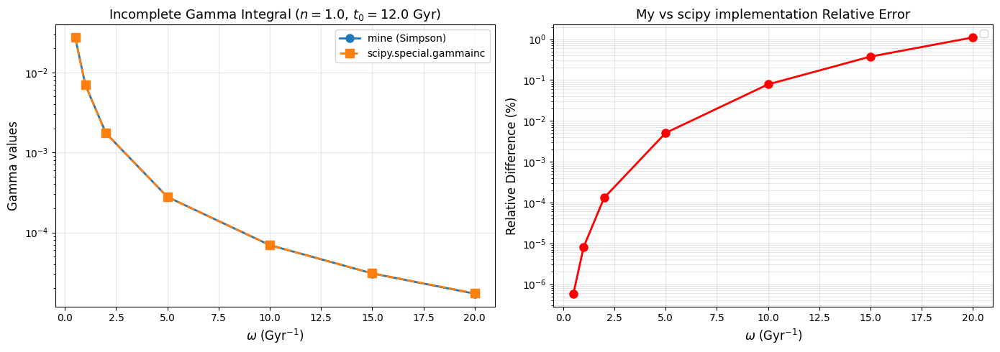


Comparison: mine (Simpson) vs scipy.special.gammainc
omega [Gyr⁻¹] | mine         | scipy       | Rel. Diff (%)
-----------------------------------------------------------------
      0.5 | 2.729580e-02 | 2.729580e-02 |       0.0000
      1.0 | 6.943889e-03 | 6.943890e-03 |       0.0000
      2.0 | 1.736109e-03 | 1.736111e-03 |       0.0001
      5.0 | 2.777637e-04 | 2.777778e-04 |       0.0051
     10.0 | 6.939010e-05 | 6.944444e-05 |       0.0783
     15.0 | 3.074824e-05 | 3.086420e-05 |       0.3757
     20.0 | 1.716932e-05 | 1.736111e-05 |       1.1047
Execution time: 0.2585 seconds


In [52]:
# Test parameters
omega_test = np.array([0.5, 1.0, 2.0, 5.0, 10.0, 15.0, 20.0])
n = 1.0
t0 = 12.0

# Compute with both methods - vectorized for JAX
results_jax = incomplete_gamma_integral_jax(omega_test, n, t0, upper_limit=1.0)
results_jax = np.array(results_jax)

results_scipy = []
for om in omega_test:
    # Scipy incomplete gamma
    # ∫_0^1 x^n * exp(-omega*t0*x) dx = (1/(omega*t0))^(n+1) * γ(n+1, omega*t0)
    a = n + 1.0
    x = om * t0
    gamma_lower = gammainc(a, x) * gamma(a)  # γ(a, x) = regularized * complete
    res_scipy = gamma_lower / ((om * t0) ** a)
    results_scipy.append(res_scipy)

results_scipy = np.array(results_scipy)

# Plot comparison
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

# Left: Direct comparison
ax1.semilogy(omega_test, results_jax, 'o-', lw=2, markersize=8, label='mine (Simpson)')
ax1.semilogy(omega_test, results_scipy, 's--', lw=2, markersize=8, label='scipy.special.gammainc')
ax1.set_xlabel(r'$\omega$ (Gyr$^{-1}$)', fontsize=12)
ax1.set_ylabel(r'Gamma values', fontsize=12)
ax1.set_title(rf'Incomplete Gamma Integral ($n=${n:.1f}, $t_0=${t0:.1f} Gyr)', fontsize=13)
ax1.legend()
ax1.grid(alpha=0.3)

# Right: Relative difference
rel_diff = 100 * np.abs(results_jax - results_scipy) / results_scipy
ax2.semilogy(omega_test, rel_diff, 'o-', lw=2, markersize=8, color='red')
ax2.set_xlabel(r'$\omega$ (Gyr$^{-1}$)', fontsize=12)
ax2.set_ylabel('Relative Difference (%)', fontsize=12)
ax2.set_title('My vs scipy implementation Relative Error', fontsize=13)
ax2.grid(alpha=0.3, which='both')
# ax2.axhline(y=0.1, color='gray', linestyle='--', alpha=0.5, label='0.1%')
# ax2.axhline(y=1.0, color='gray', linestyle='--', alpha=0.5, label='1%')
ax2.legend()

plt.tight_layout()
plt.show()

# Print comparison table
print("\nComparison: mine (Simpson) vs scipy.special.gammainc")
print("omega [Gyr⁻¹] | mine         | scipy       | Rel. Diff (%)")
print("-" * 65)
for i, om in enumerate(omega_test):
    print(f"{om:9.1f} | {results_jax[i]:.6e} | {results_scipy[i]:.6e} | {rel_diff[i]:12.4f}")

### Get $f_\mathrm{gas}$ from model definer for all galaxies (masses)

In [53]:
@partial(jax.jit, static_argnames=("star_formation_law", "res", "Rmax", "at_t0"))
def fgas_for_galaxies_jax(Mbar_array,
                          t_acc_array,
                          star_formation_law,
                          r_acc_matrix_for_all_M_jax,
                          log_M_bar_array_jax,
                          res=120,
                          Rmax=100.1,
                          at_t0=True):

    def per_gal(Mbar, t_acc):
        # single t_acc, so we pass a length-1 array
        f_gas_arr = Full_final_definer_jax_mcmc(
                Mbar,
                jnp.array([t_acc], dtype=jnp.float64),
                star_formation_law,
                r_acc_matrix_for_all_M_jax,
                log_M_bar_array_jax,
                res=res,
                Rmax=Rmax,
                at_t0=at_t0,
            )
        return f_gas_arr

    return jax.vmap(per_gal)(Mbar_array, t_acc_array)

def j_minner(Mbar):
    jmax = j_maxer(Mbar)
    return jmax / 10.0

Execution time: 0.0015 seconds


### Log Likelihood

In [87]:
@jax.jit
def logL_jax(theta, logM_obs, jbar_obs, fgas_obs, sigma_fgas_obs, sigma_j_obs,
             r_acc_matrix_for_all_M_jax, log_M_bar_array_jax, 
             t0=12.0, omega_min=-10.0, omega_max=10.0):
    """
    Joint log-likelihood in f_gas, with j_bar likelihood for clipped galaxies.

    theta            : array-like [n, k]
    logM_obs         : (Ngal,) log10(Mbar_obs)
    jbar_obs         : (Ngal,) observed j_bar (same units as j_maxer)
    fgas_obs         : (Ngal,) observed gas fraction
    sigma_fgas_obs   : (Ngal,) 1-sigma errors on f_gas
    sigma_j_obs      : (Ngal,) 1-sigma errors on j_bar
    r_acc_matrix_for_all_M_jax : (n_M, n_t) accretion radii grid (kpc)
    log_M_bar_array_jax        : (n_M,) log10(Mbar) grid used for r_acc_matrix
    omega_min        : minimum omega; unbracketable galaxies with y_raw < 0 get this
    omega_max        : maximum omega; unbracketable galaxies with y_raw > 1 or 
                       successfully bracketed galaxies with omega > omega_max get this
    """
    
    n = theta[0]
    k = theta[1]

    def invalid():
        return -jnp.inf

    def body():
        Mbar_obs = 10.0**logM_obs
        j_max = j_maxer(Mbar_obs)
        j_min = j_max/10.0
        delta_j = jnp.maximum(k*j_max - j_min, 1e-12)
        y_raw = (jbar_obs - j_min)/(delta_j)

        # Use autobracket solver (no fixed bounds)
        omega, ok = solve_omega_bisect_autobracket_jax(y_raw, n, t0)

        # For galaxies that couldn't be bracketed (ok=False), 
        # assign omega_min or omega_max based on y_raw
        omega_assigned = jnp.where(ok, omega, jnp.where(y_raw < 0.0,
                omega_max,  # y_raw < 0 --> need very positive omega
                omega_min   # y_raw > 1 --> need very negative omega
            )
        )

        # Track which galaxies are outside [omega_min, omega_max]
        # These include: failed brackets + successfully bracketed but omega > omega_max
        was_clipped = (~ok) | (ok & (omega_assigned > omega_max)) | (ok & (omega_assigned < omega_min))
        
        # Clip all omega to [omega_min, omega_max]
        omega_clipped = jnp.clip(omega_assigned, omega_min, omega_max)

        # Safe omega for t_acc calculation
        omega_safe = jnp.where(jnp.abs(omega_clipped) < 1e-4,
                               jnp.sign(omega_clipped)*1e-4, omega_clipped)
        t_acc = 1.0/omega_safe

        # Compute model for all galaxies
        fgas_mod, jbar_mod = fgas_and_jbar_for_galaxies_jax(
            Mbar_obs, t_acc, "cutoff_ksl",
            r_acc_matrix_for_all_M_jax, log_M_bar_array_jax, at_t0=True)

        # f_gas likelihood for all galaxies
        sig_f = jnp.maximum(sigma_fgas_obs, 4e-3)
        resid_f = (fgas_mod - fgas_obs) / sig_f
        logL_f = -0.5 * jnp.sum(resid_f**2)

        # j_bar likelihood ONLY for clipped galaxies
        sig_j = jnp.maximum(sigma_j_obs, 1e-6)
        resid_j = (jbar_mod - jbar_obs) / sig_j
        logL_j = -0.5 * jnp.sum(jnp.where(was_clipped, resid_j**2, 0.0))

        return logL_f + logL_j

    return lax.cond((n <= 0.0) | (k <= 0.0), lambda _: invalid(), lambda _: body(), operand=None)

# @jax.jit
# def logL_jax(theta, logM_obs, jbar_obs, fgas_obs, sigma_fgas_obs, sigma_j_obs,
#              r_acc_matrix_for_all_M_jax, log_M_bar_array_jax, 
#              t0=12.0, omega_min=-20.0, omega_max=20.0):
#     """
#     Joint log-likelihood in f_gas, with j_bar likelihood ONLY for failed galaxies.

#     theta            : array-like [n, k]
#     logM_obs         : (Ngal,) log10(Mbar_obs)
#     jbar_obs         : (Ngal,) observed j_bar (same units as j_maxer)
#     fgas_obs         : (Ngal,) observed gas fraction
#     sigma_fgas_obs   : (Ngal,) 1-sigma errors on f_gas
#     sigma_j_obs      : (Ngal,) 1-sigma errors on j_bar
#     r_acc_matrix_for_all_M_jax : (n_M, n_t) accretion radii grid (kpc)
#     log_M_bar_array_jax        : (n_M,) log10(Mbar) grid used for r_acc_matrix
#     omega_min        : omega assigned to failed galaxies with y_raw < 0
#     omega_max        : omega assigned to failed galaxies with y_raw > 1
    
#     Now that NaNs are resolved with adaptive timesteps:
#     - Successfully bracketed galaxies (ok=True) use their actual omega (no clipping)
#     - Failed galaxies (ok=False) get assigned omega_min/omega_max + j_bar likelihood
#     """
    
#     n = theta[0]
#     k = theta[1]

#     def invalid():
#         return -jnp.inf

#     def body():
#         Mbar_obs = 10.0**logM_obs
#         j_max = j_maxer(Mbar_obs)
#         j_min = j_max/10.0
#         delta_j = jnp.maximum(k*j_max - j_min, 1e-12)
#         y_raw = (jbar_obs - j_min)/(delta_j)

#         # Use autobracket solver
#         omega, ok = solve_omega_bisect_autobracket_jax(y_raw, n, t0)

#         # For FAILED galaxies only (ok=False), assign omega_min or omega_max based on y_raw
#         # Successfully bracketed galaxies keep their actual omega
#         omega_for_model = jnp.where(ok, omega, 
#             jnp.where(y_raw < 0.0, omega_max, omega_min) # CHANGED: omega_max for y<0, omega_min for y>1 instead of vice versa
#         )

#         # Safe omega for t_acc calculation (avoid division by zero)
#         omega_safe = jnp.where(jnp.abs(omega_for_model) < 1e-4,
#                                jnp.sign(omega_for_model + 1e-10) * 1e-4, 
#                                omega_for_model)
#         t_acc = 1.0 / omega_safe

#         # Compute model for all galaxies
#         fgas_mod, jbar_mod = fgas_and_jbar_for_galaxies_jax(
#             Mbar_obs, t_acc, "cutoff_ksl",
#             r_acc_matrix_for_all_M_jax, log_M_bar_array_jax, at_t0=True)

#         # f_gas likelihood for ALL galaxies (both ok and failed)
#         sig_f = jnp.maximum(sigma_fgas_obs, 4e-3)
#         resid_f = (fgas_mod - fgas_obs) / sig_f
#         logL_f = -0.5 * jnp.sum(resid_f**2)

#         # j_bar likelihood ONLY for FAILED galaxies (ok=False)
#         # These are galaxies that couldn't be bracketed
#         sig_j = jnp.maximum(sigma_j_obs, 1e-6)
#         resid_j = (jbar_mod - jbar_obs) / sig_j
#         logL_j = -0.5 * jnp.sum(jnp.where(~ok, resid_j**2, 0.0))

#         return logL_f + logL_j

#     return lax.cond((n <= 0.0) | (k <= 0.0), lambda _: invalid(), lambda _: body(), operand=None)

Execution time: 0.0073 seconds


In [55]:
def make_log_probability(logM_obs_jax,
                         jbar_obs_jax,
                         fgas_obs_jax,
                         sigma_fgas_jax,
                         sigma_jbar_jax,
                         log_M_bar_array_jax):

    @jax.jit
    def logL_fixed_obs(theta_jax, r_acc_matrix_jax):
        return logL_jax(theta_jax,
                        logM_obs_jax,
                        jbar_obs_jax,
                        fgas_obs_jax,
                        sigma_fgas_jax,
                        sigma_jbar_jax,
                        r_acc_matrix_jax,
                        log_M_bar_array_jax,
                        t0=12.0)

    def log_prior(theta):
        n, k = theta
        if 0.1 < n < 2.5 and 1.0 < k < 3.0:
            return 0.0
        return -np.inf

    def log_probability(theta):
        """
        This is what emcee will call.
        theta is a numpy array [n, k].
        """
        lp = log_prior(theta)
        if not np.isfinite(lp):
            return lp

        n, k = theta

        r_acc_matrix_np = build_r_acc_matrix_for_all_M(n, k)
        r_acc_matrix_jax = jnp.array(r_acc_matrix_np, dtype=jnp.float64)

        theta_jax = jnp.array(theta, dtype=jnp.float64)
        ll = float(logL_fixed_obs(theta_jax, r_acc_matrix_jax))

        if not np.isfinite(ll):
            return -np.inf

        return lp + ll

    return log_probability

# blackjax version
def make_log_probability_jax(logM_obs_jax,
                             jbar_obs_jax,
                             fgas_obs_jax,
                             sigma_fgas_jax,
                             sigma_jbar_jax,
                             log_M_bar_array_jax):

    @jax.jit
    def log_probability(theta):
        theta = jnp.reshape(theta, (-1,))
        n, k = theta[0], theta[1]
        in_bounds = (n > 0.1) & (n < 2.5) & (k > 1.0) & (k < 3.0)

        def body(_):
            r_acc_matrix_jax = build_r_acc_matrix_for_all_M_jax(n, k)
            return logL_jax(theta,
                            logM_obs_jax,
                            jbar_obs_jax,
                            fgas_obs_jax,
                            sigma_fgas_jax,
                            sigma_jbar_jax,
                            r_acc_matrix_jax,
                            log_M_bar_array_jax,
                            t0=12.0)

        return jax.lax.cond(in_bounds, body, lambda _: -jnp.inf, operand=None)

    return log_probability

class LogProbabilityEmcee:
    """
    Callable class for emcee that wraps logL_jax.
    Unlike closures, class instances can be pickled for multiprocessing.
    """
    def __init__(self, logM_obs_jax, jbar_obs_jax, fgas_obs_jax,
                 sigma_fgas_jax, sigma_jbar_jax, log_M_bar_array_jax):
        # Store all observation data as instance attributes
        self.logM_obs_jax = logM_obs_jax
        self.jbar_obs_jax = jbar_obs_jax
        self.fgas_obs_jax = fgas_obs_jax
        self.sigma_fgas_jax = sigma_fgas_jax
        self.sigma_jbar_jax = sigma_jbar_jax
        self.log_M_bar_array_jax = log_M_bar_array_jax
        
        # Prior bounds
        self.n_bounds = (0.1, 2.5)
        self.k_bounds = (1.0, 3.0)
    
    def log_prior(self, theta):
        n, k = theta
        if self.n_bounds[0] < n < self.n_bounds[1] and self.k_bounds[0] < k < self.k_bounds[1]:
            return 0.0
        return -np.inf
    
    def __call__(self, theta):
        """Called by emcee for each walker position."""
        lp = self.log_prior(theta)
        if not np.isfinite(lp):
            return lp
        
        n, k = theta
        
        # Build r_acc matrix for this (n, k)
        r_acc_matrix_np = build_r_acc_matrix_for_all_M(n, k)
        r_acc_matrix_jax = jnp.array(r_acc_matrix_np, dtype=jnp.float64)
        
        theta_jax = jnp.array(theta, dtype=jnp.float64)
        ll = float(logL_jax(theta_jax,
                           self.logM_obs_jax,
                           self.jbar_obs_jax,
                           self.fgas_obs_jax,
                           self.sigma_fgas_jax,
                           self.sigma_jbar_jax,
                           r_acc_matrix_jax,
                           self.log_M_bar_array_jax,
                           t0=12.0))
        
        if not np.isfinite(ll):
            return -np.inf
        
        return lp + ll

Execution time: 0.0029 seconds


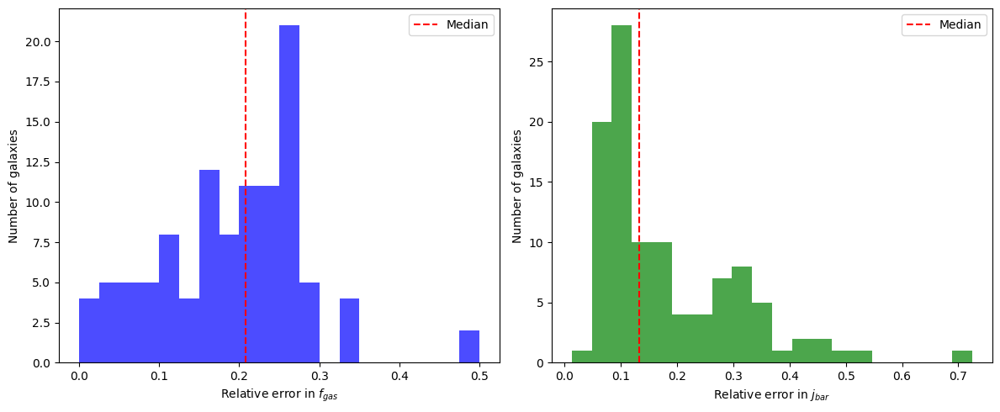

Execution time: 0.0927 seconds


In [56]:
# plot relative errors in f_gas and j_bar (in two separate histograms) and show the median values
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
rel_errors_fgas = BARY['e_fgas'] / BARY['fgas']
plt.hist(rel_errors_fgas, bins=20, color='blue', alpha=0.7)
plt.axvline(np.median(rel_errors_fgas), color='red', linestyle='dashed', label='Median')
plt.xlabel('Relative error in $f_{gas}$')
plt.ylabel('Number of galaxies')
plt.legend()
plt.subplot(1,2,2)
rel_errors_jbar = BARY['e_j'] / BARY['j']
plt.hist(rel_errors_jbar, bins=20, color='green', alpha=0.7)
plt.axvline(np.median(rel_errors_jbar), color='red', linestyle='dashed', label='Median')
plt.xlabel('Relative error in $j_{bar}$')
plt.ylabel('Number of galaxies')
plt.legend()
plt.tight_layout()
plt.show()

In [57]:
print(np.median(rel_errors_fgas), np.median(rel_errors_jbar))

0.20833333333333334 0.13209003215434084
Execution time: 0.0007 seconds


In [58]:
# load HIX data, and add them to the obs_data arrays
HIX_data = pd.read_csv('../data/compilation_AM_others/HIX.csv')

obs_log_Mbar_mcmc = np.log10(np.concatenate((BARY['Mass(Msun)'], 10**HIX_data['logMbar'].to_numpy())))
obs_jbar_mcmc = np.concatenate((BARY['j'], 10**HIX_data['logjbar'].to_numpy()))
obs_fgas_mcmc = np.concatenate((BARY['fgas'], HIX_data['fgas'].to_numpy()))

obs_fgas_errors_mcmc = np.concatenate((BARY['e_fgas'], 0.21*HIX_data['fgas'].to_numpy()))
obs_jbar_errors_mcmc = np.concatenate((BARY['e_j'], 0.13*(10**HIX_data['logjbar'].to_numpy())))

Execution time: 0.0023 seconds


In [59]:
logM_obs_jax = jnp.array(obs_log_Mbar_mcmc, dtype=jnp.float64)
jbar_obs_jax = jnp.array(obs_jbar_mcmc, dtype=jnp.float64)
fgas_obs_jax = jnp.array(obs_fgas_mcmc, dtype=jnp.float64)
sigma_fgas_jax = jnp.array(obs_fgas_errors_mcmc, dtype=jnp.float64)
sigma_jbar_jax = jnp.array(obs_jbar_errors_mcmc, dtype=jnp.float64)
logM_grid_jax = jnp.array(log_M_bar_array, dtype=jnp.float64)

Execution time: 0.0080 seconds


In [60]:
t0 = 12.0
Ngal = obs_log_Mbar_mcmc.size

print(f"Testing omega inversion for {Ngal} galaxies")

n_grid = np.linspace(0.1, 2.0, 4)
k_grid = np.linspace(1.0, 3.0, 4)

for n_val in n_grid:
    for k_val in k_grid:
        Mbar_obs = 10.0**obs_log_Mbar_mcmc
        j_max = j_maxer(Mbar_obs)
        j_min = j_max / 10.0
        delta_j = k_val*j_max - j_min

        denom = delta_j
        denom = np.where(denom == 0.0, np.nan, denom)
        y_target_np = (obs_jbar_mcmc - j_min) / denom

        y_min = np.nanmin(y_target_np)
        y_max = np.nanmax(y_target_np)
        n_outside = np.sum((y_target_np < 0.0) | (y_target_np > 1.0) | ~np.isfinite(y_target_np))

        print(f"\n=== n = {n_val:.3f}, k = {k_val:.3f} ===")
        print(f"y_target range: min={y_min:.4f}, max={y_max:.4f}, "
              f"outside [0,1]: {n_outside}/{Ngal}")

        if n_outside == Ngal:
            print("All y_target outside [0,1] or non-finite --> inversion is ill-defined here.")
            continue

        y_target = jnp.array(y_target_np, dtype=jnp.float64)
        omega = solve_omega_bisect_jax(y_target, n_val, t0)

        F_val = F_omega_jax(omega, n_val, t0)
        jbar_rec = j_min + delta_j * np.array(F_val)#k_val * 

        diff = jbar_rec - obs_jbar_mcmc
        with np.errstate(divide='ignore', invalid='ignore'):
            rel_err = diff / obs_jbar_mcmc

        max_abs_diff = np.nanmax(np.abs(diff))
        max_rel_err  = np.nanmax(np.abs(rel_err))
        mean_rel_err = np.nanmean(np.abs(rel_err[np.isfinite(rel_err)]))

        print(f"max |j_rec - j_obs|      = {max_abs_diff:.6g}")
        print(f"max |(j_rec - j_obs)/j| = {max_rel_err:.6g}")
        print(f"mean |(j_rec - j_obs)/j|= {mean_rel_err:.6g}")

        sorted_indices = np.argsort(-np.abs(rel_err))
        print("Top 5 (index, j_obs, j_rec, rel_err, abs_err):")
        for rank in range(min(5, Ngal)):
            idx = sorted_indices[rank]
            print(f"  {idx:3d},  {obs_jbar_mcmc[idx]:.4e}, "
                  f"{jbar_rec[idx]:.4e}, "
                  f"{rel_err[idx]:+.3e}, "
                  f"{diff[idx]:+.3e}")
        # idx_examples = np.linspace(0, Ngal-1, min(5, Ngal), dtype=int)
        # print("Example galaxies (index, j_obs, j_rec, rel_err, abs_err):")
        # for idx in idx_examples:
        #     print(f"  {idx:3d}: {obs_jbar_mcmc[idx]:.4e}  {jbar_rec[idx]:.4e}  "
        #           f"{rel_err[idx]:+.3e}  {diff[idx]:+.3e}")

Testing omega inversion for 117 galaxies

=== n = 0.100, k = 1.000 ===
y_target range: min=0.0045, max=2.2220, outside [0,1]: 19/117
max |j_rec - j_obs|      = 3779.79
max |(j_rec - j_obs)/j| = 6.31628
mean |(j_rec - j_obs)/j|= 0.723031
Top 5 (index, j_obs, j_rec, rel_err, abs_err):
   58,  4.2670e+02, 3.1219e+03, +6.316e+00, +2.695e+03
   24,  2.0800e+01, 1.3482e+02, +5.482e+00, +1.140e+02
   60,  2.0130e+02, 8.4383e+02, +3.192e+00, +6.425e+02
  102,  8.9170e+02, 3.6286e+03, +3.069e+00, +2.737e+03
   61,  8.6600e+02, 3.4999e+03, +3.041e+00, +2.634e+03

=== n = 0.100, k = 1.667 ===
y_target range: min=0.0026, max=1.2764, outside [0,1]: 2/117
max |j_rec - j_obs|      = 8232.68
max |(j_rec - j_obs)/j| = 11.0241
mean |(j_rec - j_obs)/j|= 1.64974
Top 5 (index, j_obs, j_rec, rel_err, abs_err):
   58,  4.2670e+02, 5.1307e+03, +1.102e+01, +4.704e+03
   24,  2.0800e+01, 2.2157e+02, +9.653e+00, +2.008e+02
   60,  2.0130e+02, 1.3868e+03, +5.889e+00, +1.186e+03
  102,  8.9170e+02, 5.9635e+03, +5.

In [61]:
def compute_y_target(logM_obs_jax, jbar_obs_jax, k_val):
    """
    y_target = (j_obs - j_min) / (k * (j_max - j_min))
    """
    Mbar_obs = 10.0**logM_obs_jax
    j_max = j_maxer(Mbar_obs)
    j_min = j_max / 10.0
    delta_j = k_val*j_max - j_min
    y = (jbar_obs_jax - j_min) / (delta_j)
    return y

t0 = 12.0

n_vals = [0.1, 0.5, 0.75, 1.0, 1.5, 2.0]
k_vals = [1.0, 1.5, 2.0, 2.5]

omega_min = -1/3.
omega_max = 1.0

print(f"Testing bracket [{omega_min}, {omega_max}] for F_omega_jax\n")

for n in n_vals:
    F_lo = float(F_omega_jax(omega_max, n, t0).item())
    F_hi = float(F_omega_jax(omega_min, n, t0).item())

    print(f"=== n = {n:.3f} ===")
    print(f"  F(omega_max={omega_max}) = {F_lo:.6e}")
    print(f"  F(omega_min={omega_min}) = {F_hi:.6e}")
    print("  (allowed y_target in this bracket: [{:.3e}, {:.3e}])".format(F_lo, F_hi))

    for k in k_vals:
        y = compute_y_target(logM_obs_jax, jbar_obs_jax, k)
        y_np = jnp.array(y)

        y_min = float(jnp.min(y_np))
        y_max = float(jnp.max(y_np))

        outside_low  = jnp.sum(y_np < F_lo)
        outside_high = jnp.sum(y_np > F_hi)
        total = y_np.size

        print(f"    k = {k:.3f}: y_target in [{y_min:.3e}, {y_max:.3e}]")
        print(f"       below F(omega_max): {int(outside_low)}/{total}")
        print(f"       above F(omega_min): {int(outside_high)}/{total}")

    print()

Testing bracket [-0.3333333333333333, 1.0] for F_omega_jax

=== n = 0.100 ===
  F(omega_max=1.0) = 7.350407e-01
  F(omega_min=-0.3333333333333333) = 9.684739e-01
  (allowed y_target in this bracket: [7.350e-01, 9.685e-01])
    k = 1.000: y_target in [4.542e-03, 2.222e+00]
       below F(omega_max): 73/117
       above F(omega_min): 24/117
    k = 1.500: y_target in [2.920e-03, 1.428e+00]
       below F(omega_max): 105/117
       above F(omega_min): 3/117
    k = 2.000: y_target in [2.152e-03, 1.053e+00]
       below F(omega_max): 114/117
       above F(omega_min): 1/117
    k = 2.500: y_target in [1.703e-03, 8.332e-01]
       below F(omega_max): 116/117
       above F(omega_min): 0/117

=== n = 0.500 ===
  F(omega_max=1.0) = 2.555856e-01
  F(omega_min=-0.3333333333333333) = 8.651747e-01
  (allowed y_target in this bracket: [2.556e-01, 8.652e-01])
    k = 1.000: y_target in [4.542e-03, 2.222e+00]
       below F(omega_max): 23/117
       above F(omega_min): 28/117
    k = 1.500: y_target

In [62]:
def count_problematic_galaxies(n_val, k_val, omega_max, 
                                logM_obs_jax, jbar_obs_jax, t0=12.0):
    """
    Count galaxies with problematic omega values for given (n, k).
    
    Returns:
        n_failed_inversion: galaxies where autobracket solver failed
        n_above_omega_max: galaxies with omega > omega_max (but solver succeeded)
        n_below_omega_min: galaxies with omega < omega_min (if you want to track this)
    """
    theta = jnp.array([n_val, k_val])
    n, k = n_val, k_val
    
    Mbar_obs = 10.0**logM_obs_jax
    j_max = j_maxer(Mbar_obs)
    j_min = j_max/10.0
    delta_j = jnp.maximum(k*j_max - j_min, 1e-12)
    y_raw = (jbar_obs_jax - j_min)/(delta_j)
    
    # Solve for omega
    omega, ok = solve_omega_bisect_autobracket_jax(y_raw, n, t0)
    
    # Count statistics
    n_total = len(logM_obs_jax)
    n_failed_inversion = int(jnp.sum(~ok))
    n_above_omega_max = int(jnp.sum(ok & (omega > omega_max)))
    n_below_omega_min = int(jnp.sum(ok & (omega < -omega_max)))  # negative extreme
    
    return {
        'n_total': n_total,
        'n_failed_inversion': n_failed_inversion,
        'n_above_omega_max': n_above_omega_max,
        'n_below_omega_min': n_below_omega_min,
        'total_problematic': n_failed_inversion + n_above_omega_max + n_below_omega_min,
    }

def create_omega_problem_table(n_values, k_values, omega_max_values, 
                                logM_obs_jax, jbar_obs_jax, t0=12.0):
    """
    Create a table showing problematic galaxies for different (n, k, omega_max) combinations.
    """
    results = []
    
    for omega_max in omega_max_values:
        for n_val in n_values:
            for k_val in k_values:
                counts = count_problematic_galaxies(
                    n_val, k_val, omega_max, 
                    logM_obs_jax, jbar_obs_jax, t0
                )
                results.append({
                    'n': n_val,
                    'k': k_val,
                    'omega_max': omega_max,
                    **counts,
                    'pct_problematic': 100 * counts['total_problematic'] / counts['n_total']
                })
    
    return pd.DataFrame(results)

# Example usage (uncomment and modify as needed):
n_values = [0.5, 1.0, 1.5, 2.0]
k_values = [1.0, 1.5, 2.0, 2.5]
omega_max_values = [25.0]

df_problems = create_omega_problem_table(
    n_values, k_values, omega_max_values,
    logM_obs_jax, jbar_obs_jax
)

print("\nNumber of problematic galaxies (Summary Table):")

# Display pivot table for each omega_max
for omega_max in omega_max_values:
    print(f"\n=== omega_max = {omega_max} Gyr^-1 ===")
    subset = df_problems[df_problems['omega_max'] == omega_max]
    pivot = subset.pivot_table(
        values='total_problematic',
        index='n',
        columns='k',
        aggfunc='sum'
    )
    print(pivot)


Number of problematic galaxies (Summary Table):

=== omega_max = 25.0 Gyr^-1 ===
k    1.0  1.5  2.0  2.5
n                      
0.5   22    5    4    5
1.0   20    4    2    1
1.5   20    3    1    0
2.0   20    3    1    0
Execution time: 0.3340 seconds


Testing omega inversion with n=0.355, k=1.75
omega bounds: [-20.0, 20.0]

Status:
  OK: 101 galaxies
  NOT OK: 2 galaxies
  CLIPPED (+5.01): 1 galaxies
  CLIPPED (+15.17): 1 galaxies
  CLIPPED (+62.90): 1 galaxies
  CLIPPED (+10.06): 1 galaxies
  CLIPPED (+4.76): 1 galaxies
  CLIPPED (+1.00): 1 galaxies
  CLIPPED (+0.84): 1 galaxies
  CLIPPED (+4.41): 1 galaxies
  CLIPPED (+94.85): 1 galaxies
  CLIPPED (+24.59): 1 galaxies
  CLIPPED (+22.28): 1 galaxies
  CLIPPED (+9.26): 1 galaxies
  CLIPPED (+17.05): 1 galaxies
  CLIPPED (+22.71): 1 galaxies

galaxies with status=OK (101 galaxies):
Max absolute difference in j_bar: 1433.172675 kpc km/s
Mean absolute difference in j_bar: 68.400174 kpc km/s
Max relative difference: 16.2758 %
Mean relative difference: 4.413420 %

--- Full Table: ALL 117 galaxies ---
 galaxy_idx    logM  j_bar_input  omega_raw  omega_used  j_bar_model  abs_diff  rel_diff_pct           status
          0  7.7931       9.8000     9.7401      9.7401      10.7547    0.9547  

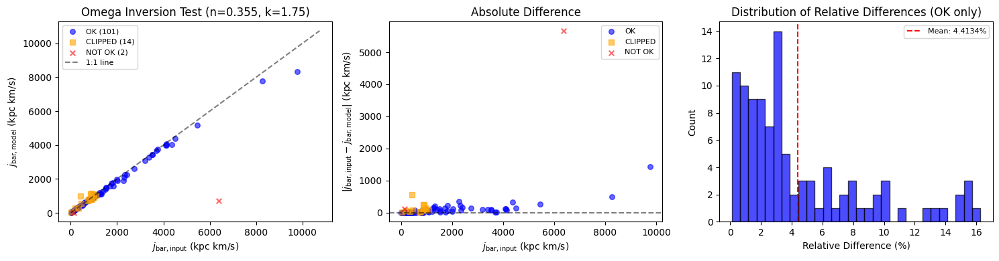

Execution time: 6.0032 seconds


In [63]:
def test_omega_inversion_with_model(n_val, k_val, logM_obs_jax, jbar_obs_jax,
                                     r_acc_matrix_for_all_M_jax, log_M_bar_array_jax,
                                     omega_min=-20.0, omega_max=20.0, t0=12.0):
    """
    Test the omega inversion by comparing input j_bar with j_bar computed from the full model.
    Computes the model for ALL galaxies, with status labels.
    """
    Mbar_obs = 10.0**logM_obs_jax
    j_max = j_maxer(Mbar_obs)
    j_min = j_max / 10.0
    delta_j = jnp.maximum(k_val * j_max - j_min, 1e-12)
    
    # Compute y_raw from observed j_bar
    y_raw = (jbar_obs_jax - j_min) / delta_j
    
    # Solve for omega
    omega, ok = solve_omega_bisect_autobracket_jax(y_raw, n_val, t0)
    
    # For failed galaxies, assign omega_min or omega_max based on y_raw
    omega_assigned = jnp.where(ok, omega, 
        jnp.where(y_raw < 0.0, omega_min, omega_max)
    )
    
    # Track clipping
    clipped_high = ok & (omega > omega_max)
    clipped_low = ok & (omega < omega_min)
    was_clipped = clipped_high | clipped_low
    clip_amount = jnp.where(clipped_high, omega - omega_max,
                   jnp.where(clipped_low, omega - omega_min, 0.0))
    
    # Clip omega to bounds
    omega_clipped = jnp.clip(omega_assigned, omega_min, omega_max)
    
    # Compute t_acc from clipped omega (for ALL galaxies)
    omega_safe = jnp.where(jnp.abs(omega_clipped) < 1e-4,
                           jnp.sign(omega_clipped + 1e-10) * 1e-4, omega_clipped)
    t_acc = 1.0 / omega_safe
    
    # Run the full model for ALL galaxies
    fgas_mod, jbar_mod = fgas_and_jbar_for_galaxies_jax(
        Mbar_obs, t_acc, "cutoff_ksl",
        r_acc_matrix_for_all_M_jax, log_M_bar_array_jax, at_t0=True)
    
    # Compute differences
    abs_diff = jnp.abs(jbar_obs_jax - jbar_mod)
    rel_diff_pct = 100.0 * abs_diff / jnp.maximum(jbar_obs_jax, 1e-12)
    
    # Create status labels
    def make_status(ok_val, clipped_high_val, clipped_low_val, clip_val):
        if not ok_val:
            return "NOT OK"
        elif clipped_high_val:
            return f"CLIPPED (+{clip_val:.2f})"
        elif clipped_low_val:
            return f"CLIPPED ({clip_val:.2f})"
        else:
            return "OK"
    
    status = [make_status(ok[i], clipped_high[i], clipped_low[i], clip_amount[i]) 
              for i in range(len(ok))]
    
    # Create results DataFrame
    results = pd.DataFrame({
        'galaxy_idx': np.arange(len(logM_obs_jax)),
        'logM': np.array(logM_obs_jax),
        'j_bar_input': np.array(jbar_obs_jax),
        'y_raw': np.array(y_raw),
        'omega_raw': np.array(omega),
        'omega_used': np.array(omega_clipped),
        't_acc': np.array(t_acc),
        'fgas_mod': np.array(fgas_mod),
        'j_bar_model': np.array(jbar_mod),
        'abs_diff': np.array(abs_diff),
        'rel_diff_pct': np.array(rel_diff_pct),
        'status': status,
        'solver_ok': np.array(ok),
        'was_clipped': np.array(was_clipped),
    })
    
    return results

# Test with specific (n, k) values
n_test, k_test = 0.355, 1.75
omega_min_test, omega_max_test = -20.0, 20.0

print(f"Testing omega inversion with n={n_test}, k={k_test}")
print(f"omega bounds: [{omega_min_test}, {omega_max_test}]")
print("=" * 80)

results_df = test_omega_inversion_with_model(
    n_test, k_test, logM_obs_jax, jbar_obs_jax,
    jnp.array(build_r_acc_matrix_for_all_M(n_test, k_test), dtype=jnp.float64), log_M_bar_array_jax,
    omega_min=omega_min_test, omega_max=omega_max_test
)

# Summary by status
print(f"\nStatus:")
status_counts = results_df['status'].value_counts()
for status, count in status_counts.items():
    print(f"  {status}: {count} galaxies")

# Statistics for OK galaxies only
ok_df = results_df[results_df['status'] == 'OK']
print(f"\ngalaxies with status=OK ({len(ok_df)} galaxies):")
if len(ok_df) > 0:
    print(f"Max absolute difference in j_bar: {ok_df['abs_diff'].max():.6f} kpc km/s")
    print(f"Mean absolute difference in j_bar: {ok_df['abs_diff'].mean():.6f} kpc km/s")
    print(f"Max relative difference: {ok_df['rel_diff_pct'].max():.4f} %")
    print(f"Mean relative difference: {ok_df['rel_diff_pct'].mean():.6f} %")

# Show full table for ALL galaxies
print(f"\n--- Full Table: ALL {len(results_df)} galaxies ---")
cols_to_show = ['galaxy_idx', 'logM', 'j_bar_input', 'omega_raw', 'omega_used', 'j_bar_model', 'abs_diff', 'rel_diff_pct', 'status']
print(results_df[cols_to_show].to_string(index=False, float_format=lambda x: f"{x:.4f}"))

# Plot: j_bar_input vs j_bar_model for all galaxies
fig, axes = plt.subplots(1, 3, figsize=(15, 4), facecolor='w')

# Plot 1: Scatter of input vs model (color by status)
ax1 = axes[0]
ok_mask = results_df['status'] == 'OK'
clipped_mask = results_df['status'].str.contains('CLIPPED')
notok_mask = results_df['status'] == 'NOT OK'

ax1.scatter(results_df.loc[ok_mask, 'j_bar_input'], results_df.loc[ok_mask, 'j_bar_model'], 
            alpha=0.6, s=30, c='blue', label=f'OK ({ok_mask.sum()})')
if clipped_mask.sum() > 0:
    ax1.scatter(results_df.loc[clipped_mask, 'j_bar_input'], results_df.loc[clipped_mask, 'j_bar_model'], 
                alpha=0.6, s=30, c='orange', marker='s', label=f'CLIPPED ({clipped_mask.sum()})')
if notok_mask.sum() > 0:
    ax1.scatter(results_df.loc[notok_mask, 'j_bar_input'], results_df.loc[notok_mask, 'j_bar_model'], 
                alpha=0.6, s=30, c='red', marker='x', label=f'NOT OK ({notok_mask.sum()})')

# 1:1 line
all_jbar = np.concatenate([results_df['j_bar_input'].values, results_df['j_bar_model'].values])
lims = [all_jbar.min() * 0.9, all_jbar.max() * 1.1]
ax1.plot(lims, lims, 'k--', alpha=0.5, label='1:1 line')
ax1.set_xlabel(r'$j_{\rm bar, input}$ (kpc km/s)')
ax1.set_ylabel(r'$j_{\rm bar, model}$ (kpc km/s)')
ax1.set_title(f'Omega Inversion Test (n={n_test}, k={k_test})')
ax1.legend(fontsize=8)

# Plot 2: Residuals vs j_bar_input
ax2 = axes[1]
ax2.scatter(results_df.loc[ok_mask, 'j_bar_input'], results_df.loc[ok_mask, 'abs_diff'], 
            alpha=0.6, s=30, c='blue', label='OK')
if clipped_mask.sum() > 0:
    ax2.scatter(results_df.loc[clipped_mask, 'j_bar_input'], results_df.loc[clipped_mask, 'abs_diff'], 
                alpha=0.6, s=30, c='orange', marker='s', label='CLIPPED')
if notok_mask.sum() > 0:
    ax2.scatter(results_df.loc[notok_mask, 'j_bar_input'], results_df.loc[notok_mask, 'abs_diff'], 
                alpha=0.6, s=30, c='red', marker='x', label='NOT OK')
ax2.axhline(0, color='k', linestyle='--', alpha=0.5)
ax2.set_xlabel(r'$j_{\rm bar, input}$ (kpc km/s)')
ax2.set_ylabel(r'$|j_{\rm bar, input} - j_{\rm bar, model}|$ (kpc km/s)')
ax2.set_title('Absolute Difference')
ax2.legend(fontsize=8)

# Plot 3: Histogram of relative differences (OK galaxies only)
ax3 = axes[2]
if len(ok_df) > 0:
    ax3.hist(ok_df['rel_diff_pct'], bins=30, edgecolor='black', alpha=0.7, color='blue')
    ax3.axvline(ok_df['rel_diff_pct'].mean(), color='r', linestyle='--', 
                label=f'Mean: {ok_df["rel_diff_pct"].mean():.4f}%')
    # ax3.axvline(ok_df['rel_diff_pct'].median(), color='orange', linestyle='--',
    #             label=f'Median: {ok_df["rel_diff_pct"].median():.4f}%')
ax3.set_xlabel('Relative Difference (%)')
ax3.set_ylabel('Count')
ax3.set_title('Distribution of Relative Differences (OK only)')
ax3.legend(fontsize=8)

plt.tight_layout()
plt.show()

In [64]:
n_test, k_test = 0.5, 2.0
omega_tests = [-5.0, -1.0, 0.5, 1.0, 5.0, 10.0]
gal_idx = 10

logM = logM_obs_jax[gal_idx]
Mbar = 10.0**logM
j_max = j_maxer(jnp.array([Mbar]))[0]
j_min = j_max / 10.0
delta_j = k_test * j_max - j_min

print(f"Galaxy {gal_idx}: logM={float(logM):.2f}, jbar_obs={float(jbar_obs_jax[gal_idx]):.1f}")
print(f"j_min={float(j_min):.2f}, j_max={float(j_max):.2f}, delta_j={float(delta_j):.2f}")
print("\nomega    t_acc   j_bar_model  j_bar_F_omega  abs_diff  rel_diff(%)")
print("-" * 70)

for omega in omega_tests:
    t_acc = 1.0 / omega
    
    fgas_mod, jbar_mod = fgas_and_jbar_for_galaxies_jax(
        jnp.array([Mbar]), jnp.array([t_acc]), "cutoff_ksl",
        jnp.array(build_r_acc_matrix_for_all_M(n_test, k_test), dtype=jnp.float64), log_M_bar_array_jax, at_t0=True)
    jbar_mod = float(jbar_mod[0])
    
    y_pred = float(F_omega_jax(jnp.array([omega]), n_test, t0=12.0)[0])
    jbar_pred = float(j_min + y_pred * delta_j)
    
    abs_diff = abs(jbar_mod - jbar_pred)
    rel_diff = 100.0 * abs_diff / jbar_mod
    
    print(f"{omega:6.1f}  {t_acc:7.3f}  {jbar_mod:11.2f}  {jbar_pred:13.2f}  {abs_diff:8.2f}  {rel_diff:11.4f}")

Galaxy 10: logM=9.37, jbar_obs=234.6
j_min=38.98, j_max=389.83, delta_j=740.68

omega    t_acc   j_bar_model  j_bar_F_omega  abs_diff  rel_diff(%)
----------------------------------------------------------------------
  -5.0   -0.200       762.57         773.46     10.89       1.4282
  -1.0   -1.000       737.84         747.31      9.47       1.2836
   0.5    2.000       300.39         305.56      5.16       1.7194
   1.0    1.000       223.74         228.29      4.55       2.0356
   5.0    0.200       116.65         122.80      6.15       5.2718
  10.0    0.100        88.99          96.94      7.94       8.9224
Execution time: 1.5915 seconds


Solved omega for 117 galaxies in 0.00035 seconds.
N galaxies           : 117
Solved (ok)          : 113   (0.966)
Unsolved             : 4; 0.034
omega range (solved) : [-0.3943, 88.79]
omega<0              : 21; 0.186
omega>10             : 5; 0.044
y_raw range          : [0.003097, 1.515]


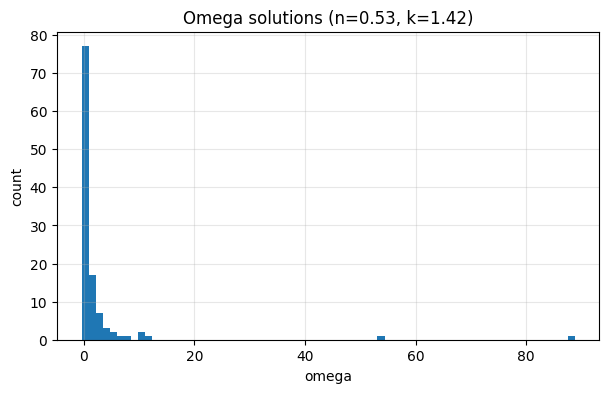

Execution time: 0.3054 seconds


In [153]:
n_test = 0.53
k_test = 1.42
t0 = 12.0

Mbar_obs = 10.0**logM_obs_jax
j_max = j_maxer(Mbar_obs)
j_min = j_max / 10.0
delta_j = k_test*j_max - j_min

y_raw = (jbar_obs_jax - j_min) / (delta_j)

time_0 = time.time()
omega, ok = solve_omega_bisect_autobracket_jax(y_raw, n_test, t0, omega0=1.0, max_expand=60, n_iter=50)
time_1 = time.time()
print(f"Solved omega for {y_raw.size} galaxies in {time_1 - time_0:.5f} seconds.")

omega_np = np.asarray(jax.device_get(omega))
ok_np = np.asarray(jax.device_get(ok))
y_np = np.asarray(jax.device_get(y_raw))

mask = ok_np & np.isfinite(omega_np)

print(f"N galaxies           : {len(y_np)}")
print(f"Solved (ok)          : {mask.sum()}   ({mask.sum()/len(y_np):.3f})")
print(f"Unsolved             : {(~mask).sum()}; {(~mask).sum()/len(y_np):.3f}")
if mask.any():
    print(f"omega range (solved) : [{omega_np[mask].min():.4g}, {omega_np[mask].max():.4g}]")
    print(f"omega<0              : {(omega_np[mask] < 0).sum()}; {(omega_np[mask] < 0).mean():.3f}")
    print(f"omega>10             : {(omega_np[mask] > 10.0).sum()}; {(omega_np[mask] > 10.0).mean():.3f}")
    print(f"y_raw range          : [{np.nanmin(y_np):.4g}, {np.nanmax(y_np):.4g}]")

plt.figure(figsize=(7,4))
plt.hist(omega_np[mask], bins=70)
plt.xlabel("omega")
plt.ylabel("count")
plt.title(f"Omega solutions (n={n_test}, k={k_test})")
plt.grid(True, alpha=0.3)
plt.show()

# # Optional: split by sign (often helpful)
# plt.figure(figsize=(7,4))
# plt.hist(omega_np[mask & (omega_np < 0)], bins=40, label="omega < 0", alpha=0.7)
# plt.hist(omega_np[mask & (omega_np > 0)], bins=40, label="omega > 0", alpha=0.7)
# plt.xlabel("omega")
# plt.ylabel("count")
# plt.title(f"Omega solutions by sign (n={n_test}, k={k_test})")
# plt.legend()
# plt.grid(True, alpha=0.3)
# plt.show()

In [66]:
unsolved = (~ok_np) | (~np.isfinite(omega_np)) | (~np.isfinite(y_np))
idx_uns = np.where(unsolved)[0]

print(f"Unsolved galaxies: {len(idx_uns)}")
print("Indices:", idx_uns.tolist())

names = np.asarray(BARY["Name"].to_list() + ['HIX_galaxy']*len(HIX_data))

for i in idx_uns:
    nm = names[i]
    print(f"\n{nm}")
    print(f"  idx      = {i}")
    print(f"  y_raw    = {y_np[i]}")
    print(f"  omega    = {omega_np[i]}")
    print(f"  j_obs    = {np.asarray(jax.device_get(jbar_obs_jax))[i]}")
    print(f"  logM_obs = {np.asarray(jax.device_get(logM_obs_jax))[i]}")
    print(f"  fgas_obs = {np.asarray(jax.device_get(fgas_obs_jax))[i]}")

Unsolved galaxies: 2
Indices: [5, 114]

DDO154    
  idx      = 5
  y_raw    = 1.055755420380042
  omega    = nan
  j_obs    = 147.6
  logM_obs = 8.44715803134222
  fgas_obs = 0.95

HIX_galaxy
  idx      = 114
  y_raw    = 1.2498484536189234
  omega    = nan
  j_obs    = 6377.799997397691
  logM_obs = 10.59246815
  fgas_obs = 0.6782401482
Execution time: 0.0009 seconds


In [ ]:
# Diagnostic: compare logL_f and logL_j for k=1.8 vs k=1.75, both with n=0.355
# This will help understand why there's a ~2000 logL drop between k=1.8 and k=1.75

def logL_diagnostic(theta, logM_obs, jbar_obs, fgas_obs, sigma_fgas_obs, sigma_j_obs,
                    r_acc_matrix_for_all_M_jax, log_M_bar_array_jax, 
                    t0=12.0, omega_min=-20.0, omega_max=20.0):
    """
    Same as logL_jax but returns logL_f and logL_j separately for diagnostics.
    Also returns number of ok vs failed galaxies.
    """
    n = theta[0]
    k = theta[1]
    
    Mbar_obs = 10.0**logM_obs
    j_max = j_maxer(Mbar_obs)
    j_min = j_max/10.0
    delta_j = jnp.maximum(k*j_max - j_min, 1e-12)
    y_raw = (jbar_obs - j_min)/(delta_j)

    # Use autobracket solver
    omega, ok = solve_omega_bisect_autobracket_jax(y_raw, n, t0)

    # For FAILED galaxies only (ok=False), assign omega_min or omega_max based on y_raw
    omega_for_model = jnp.where(ok, omega, 
        jnp.where(y_raw < 0.0, omega_min, omega_max))

    # Safe omega for t_acc calculation
    omega_safe = jnp.where(jnp.abs(omega_for_model) < 1e-4,
                           jnp.sign(omega_for_model + 1e-10) * 1e-4, 
                           omega_for_model)
    t_acc = 1.0 / omega_safe

    # Compute model for all galaxies
    fgas_mod, jbar_mod = fgas_and_jbar_for_galaxies_jax(
        Mbar_obs, t_acc, "cutoff_ksl",
        r_acc_matrix_for_all_M_jax, log_M_bar_array_jax, at_t0=True)

    # f_gas likelihood for ALL galaxies
    sig_f = jnp.maximum(sigma_fgas_obs, 4e-3)
    resid_f = (fgas_mod - fgas_obs) / sig_f
    logL_f = -0.5 * jnp.sum(resid_f**2)

    # j_bar likelihood ONLY for FAILED galaxies (ok=False)
    sig_j = jnp.maximum(sigma_j_obs, 1e-6)
    resid_j = (jbar_mod - jbar_obs) / sig_j
    logL_j = -0.5 * jnp.sum(jnp.where(~ok, resid_j**2, 0.0))
    
    n_ok = jnp.sum(ok)
    n_failed = jnp.sum(~ok)

    return logL_f, logL_j, n_ok, n_failed, fgas_mod, jbar_mod, ok, y_raw

# Test both parameter sets
n_test = 0.355
k_values = [1.75, 1.80]

print("=" * 70)
print(f"Diagnostic comparison: n = {n_test}")
print("=" * 70)

for k_test in k_values[::-1]:
    theta_test = jnp.array([n_test, k_test], dtype=jnp.float64)
    r_acc_matrix_test = build_r_acc_matrix_for_all_M_jax(n_test, k_test)
    
    logL_f, logL_j, n_ok, n_failed, fgas_mod, jbar_mod, ok, y_raw = logL_diagnostic(
        theta_test, logM_obs_jax, jbar_obs_jax, fgas_obs_jax, 
        sigma_fgas_jax, sigma_jbar_jax,
        r_acc_matrix_test, log_M_bar_array_jax
    )
    
    logL_total = logL_f + logL_j
    
    print(f"\nk = {k_test}:")
    print(f"  logL_f (f_gas, all galaxies) = {float(logL_f):.2f}")
    print(f"  logL_j (j_bar, failed only)  = {float(logL_j):.2f}")
    print(f"  logL_total                   = {float(logL_total):.2f}")
    print(f"  n_ok (solved)                = {int(n_ok)}")
    print(f"  n_failed (unsolved)          = {int(n_failed)}")
    
    # Show which galaxies failed
    ok_np = np.asarray(jax.device_get(ok))
    y_raw_np = np.asarray(jax.device_get(y_raw))
    failed_idx = np.where(~ok_np)[0]
    if len(failed_idx) > 0:
        print(f"  Failed galaxy indices: {failed_idx.tolist()}")
        for idx in failed_idx:
            print(f"    idx={idx}: y_raw={y_raw_np[idx]:.4f}")

print("\n" + "=" * 70)
print("DIFFERENCE (k=1.80 - k=1.75):")
print("=" * 70)

# Recalculate to get the difference
theta_175 = jnp.array([n_test, 1.75], dtype=jnp.float64)
theta_180 = jnp.array([n_test, 1.80], dtype=jnp.float64)

r_acc_175 = build_r_acc_matrix_for_all_M_jax(n_test, 1.75)
r_acc_180 = build_r_acc_matrix_for_all_M_jax(n_test, 1.80)

logL_f_175, logL_j_175, _, _, fgas_175, jbar_175, ok_175, _ = logL_diagnostic(
    theta_175, logM_obs_jax, jbar_obs_jax, fgas_obs_jax, 
    sigma_fgas_jax, sigma_jbar_jax, r_acc_175, log_M_bar_array_jax)

logL_f_180, logL_j_180, _, _, fgas_180, jbar_180, ok_180, _ = logL_diagnostic(
    theta_180, logM_obs_jax, jbar_obs_jax, fgas_obs_jax, 
    sigma_fgas_jax, sigma_jbar_jax, r_acc_180, log_M_bar_array_jax)

print(f"  Delta logL_f = {float(logL_f_180 - logL_f_175):.2f}")
print(f"  Delta logL_j = {float(logL_j_180 - logL_j_175):.2f}")
print(f"  Delta logL_total = {float((logL_f_180 + logL_j_180) - (logL_f_175 + logL_j_175)):.2f}")

Diagnostic comparison: n = 0.355

k = 1.75:
  logL_f (f_gas, all galaxies) = -3489.44
  logL_j (j_bar, failed only)  = -144.54
  logL_total                   = -3633.98
  n_ok (solved)                = 115
  n_failed (unsolved)          = 2
  Failed galaxy indices: [5, 114]
    idx=5: y_raw=1.0238
    idx=114: y_raw=1.2120

k = 1.8:
  logL_f (f_gas, all galaxies) = -1159.36
  logL_j (j_bar, failed only)  = -23.27
  logL_total                   = -1182.63
  n_ok (solved)                = 116
  n_failed (unsolved)          = 1
  Failed galaxy indices: [114]
    idx=114: y_raw=1.1763

DIFFERENCE (k=1.80 - k=1.75):
  Delta logL_f = 2330.08
  Delta logL_j = 121.27
  Delta logL_total = 2451.35
Execution time: 55.8809 seconds


In [77]:
# Get per-galaxy contributions to logL_f
def logL_diagnostic_per_galaxy(theta, logM_obs, jbar_obs, fgas_obs, sigma_fgas_obs, sigma_j_obs,
                                r_acc_matrix_for_all_M_jax, log_M_bar_array_jax, 
                                t0=12.0, omega_min=-20.0, omega_max=20.0):
    n = theta[0]
    k = theta[1]
    
    Mbar_obs = 10.0**logM_obs
    j_max = j_maxer(Mbar_obs)
    j_min = j_max/10.0
    delta_j = jnp.maximum(k*j_max - j_min, 1e-12)
    y_raw = (jbar_obs - j_min)/(delta_j)

    omega, ok = solve_omega_bisect_autobracket_jax(y_raw, n, t0)
    omega_for_model = jnp.where(ok, omega, 
        jnp.where(y_raw < 0.0, omega_min, omega_max))

    omega_safe = jnp.where(jnp.abs(omega_for_model) < 1e-4,
                           jnp.sign(omega_for_model + 1e-10) * 1e-4, 
                           omega_for_model)
    t_acc = 1.0 / omega_safe

    fgas_mod, jbar_mod = fgas_and_jbar_for_galaxies_jax(
        Mbar_obs, t_acc, "cutoff_ksl",
        r_acc_matrix_for_all_M_jax, log_M_bar_array_jax, at_t0=True)

    sig_f = jnp.maximum(sigma_fgas_obs, 4e-3)
    resid_f = (fgas_mod - fgas_obs) / sig_f
    logL_f_per_galaxy = -0.5 * resid_f**2  # Per-galaxy contribution
    
    return logL_f_per_galaxy, omega_for_model, fgas_mod, ok

# Compare DDO154 (idx=5) specifically
for k_test in [1.75, 1.80]:
    theta_test = jnp.array([0.355, k_test], dtype=jnp.float64)
    r_acc = build_r_acc_matrix_for_all_M_jax(0.355, k_test)
    
    logL_f_per, omega, fgas_mod, ok = logL_diagnostic_per_galaxy(
        theta_test, logM_obs_jax, jbar_obs_jax, fgas_obs_jax,
        sigma_fgas_jax, sigma_jbar_jax, r_acc, log_M_bar_array_jax)
    
    idx = 5  # DDO154
    print(f"\nk={k_test}:")
    print(f"  DDO154 solvable: {bool(ok[idx])}")
    print(f"  DDO154 omega: {float(omega[idx]):.3f}")
    print(f"  DDO154 fgas_mod: {float(fgas_mod[idx]):.4f}")
    print(f"  DDO154 fgas_obs: {float(fgas_obs_jax[idx]):.4f}")
    print(f"  DDO154 logL_f contribution: {float(logL_f_per[idx]):.2f}")
    print(f"  All OTHER galaxies logL_f: {float(jnp.sum(logL_f_per) - logL_f_per[idx]):.2f}")


k=1.75:
  DDO154 solvable: False
  DDO154 omega: 20.000
  DDO154 fgas_mod: 0.2644
  DDO154 fgas_obs: 0.9500
  DDO154 logL_f contribution: -2350.53
  All OTHER galaxies logL_f: -1138.91

k=1.8:
  DDO154 solvable: True
  DDO154 omega: -4.704
  DDO154 fgas_mod: 0.9909
  DDO154 fgas_obs: 0.9500
  DDO154 logL_f contribution: -8.37
  All OTHER galaxies logL_f: -1150.99
Execution time: 27.3365 seconds


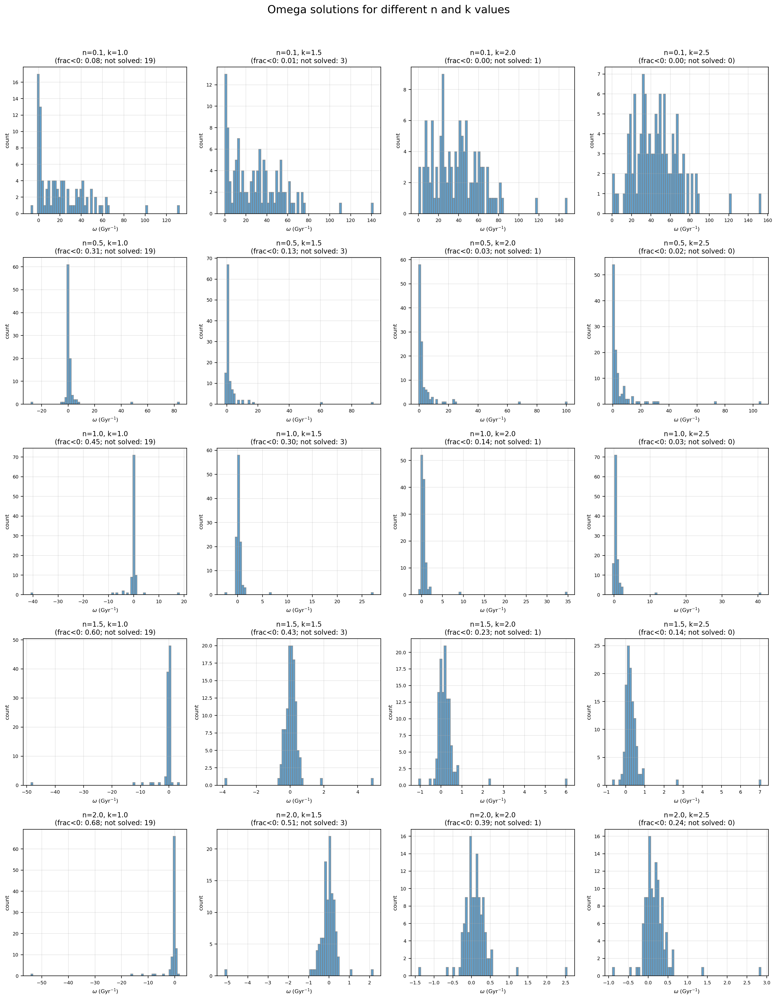

Execution time: 1.4467 seconds


In [68]:
# Mosaic of omega histograms for different n and k values
n_vals = [0.1, 0.5, 1.0, 1.5, 2.0]
k_vals = [1.0, 1.5, 2.0, 2.5]
t0 = 12.0

fig, axes = plt.subplots(len(n_vals), len(k_vals), figsize=(16, 20), dpi=200)
fig.suptitle("Omega solutions for different n and k values", fontsize=16, y=1.02)

for i, n_test in enumerate(n_vals):
    for j, k_test in enumerate(k_vals):
        ax = axes[i, j]
        
        # Compute y_raw for this (n, k) combination
        Mbar_obs = 10.0**logM_obs_jax
        j_max = j_maxer(Mbar_obs)
        j_min = j_max / 10.0
        delta_j = k_test*j_max - j_min
        y_raw = (jbar_obs_jax - j_min) / (delta_j)
        
        # Solve for omega
        omega, ok = solve_omega_bisect_autobracket_jax(y_raw, n_test, t0, omega0=1.0, max_expand=60, n_iter=50)
        
        omega_np = np.asarray(jax.device_get(omega))
        ok_np = np.asarray(jax.device_get(ok))
        y_np = np.asarray(jax.device_get(y_raw))
        
        mask = ok_np & np.isfinite(omega_np)
        unsolved = (~ok_np) | (~np.isfinite(omega_np)) | (~np.isfinite(y_np))
        idx_uns = np.where(unsolved)[0]
        
        # Plot histogram
        if mask.any():
            ax.hist(omega_np[mask], bins=70, alpha=0.7, edgecolor='grey')
            frac_neg = (omega_np[mask] < 0).mean()
            ax.set_title(f"n={n_test}, k={k_test}\n(frac<0: {frac_neg:.2f}; not solved: {len(idx_uns)})", fontsize=10)
        else:
            ax.set_title(f"n={n_test}, k={k_test}\n(no solutions)", fontsize=10)
        
        ax.set_xlabel(r"$\omega$ (Gyr$^{-1}$)", fontsize=8)
        ax.set_ylabel("count", fontsize=8)
        ax.grid(True, alpha=0.3)
        ax.tick_params(axis='both', labelsize=7)

plt.tight_layout()
plt.show()

In [90]:
# Initial positions of walkers
ndim = 2
nwalkers = 8
nsteps = 125
initial = np.array([.6, 1.5]) # (n, k)
pos = initial + .1*np.random.randn(nwalkers, ndim)

Execution time: 0.0051 seconds


In [91]:
log_prob = LogProbabilityEmcee(
    logM_obs_jax, jbar_obs_jax, fgas_obs_jax,
    sigma_fgas_jax, sigma_jbar_jax, logM_grid_jax
)#make_log_probability(logM_obs_jax, jbar_obs_jax, fgas_obs_jax, sigma_fgas_jax, sigma_jbar_jax, logM_grid_jax)

Execution time: 0.0005 seconds


In [92]:
def run_mcmc(log_prob, nwalkers, ndim, nsteps, 
             filename='../outputs/mcmc_chains/chain_emcee_jax.h5',
             fresh_start=True, 
             initial_pos=None,
             max_workers=12,
             nsteps_is_total=False):
    """
    Run MCMC with emcee, with option to continue from previous run.
    
    Parameters:
    -----------
    log_prob : callable
        Log probability function
    nwalkers : int
        Number of walkers
    ndim : int
        Number of dimensions
    nsteps : int
        Number of steps to run (additional steps if continuing)
    filename : str
        Path to HDF5 backend file
    fresh_start : bool
        If True, reset and start fresh. If False, continue from previous run.
    initial_pos : array-like, optional
        Initial positions for fresh start. Required if fresh_start=True.
    max_workers : int
        Number of parallel workers; 12 for my Mac
    nsteps_is_total : bool
        If True, nsteps is the total target (will compute remaining).
        If False, nsteps is additional steps to run.
    
    Returns:
    --------
    sampler : emcee.EnsembleSampler
    """
    
    def init_worker():
        os.environ['JAX_ENABLE_X64'] = '1'
        jax.config.update("jax_enable_x64", True)
    
    backend = emcee.backends.HDFBackend(filename)
    
    if fresh_start:
        backend.reset(nwalkers, ndim)
        if initial_pos is None:
            raise ValueError("initial_pos required for fresh start")
        pos = initial_pos
        steps_to_run = nsteps
        print(f"Starting fresh MCMC with {nwalkers} walkers, {steps_to_run} steps")
    else:
        current_steps = backend.iteration
        if current_steps == 0:
            raise ValueError("No previous run found. Use fresh_start=True")
        pos = backend.get_last_sample()
        
        if nsteps_is_total:
            steps_to_run = nsteps - current_steps
            if steps_to_run <= 0:
                print(f"Chain already has {current_steps} steps, which meets/exceeds target of {nsteps}. No additional steps to run.")
                return emcee.EnsembleSampler(nwalkers, ndim, log_prob, backend=backend)
        else:
            steps_to_run = nsteps
        print(f"Resuming from step {current_steps}, running {steps_to_run} more steps (target: {current_steps + steps_to_run})")
    
    executor = get_reusable_executor(max_workers=max_workers, initializer=init_worker)
    
    sampler = emcee.EnsembleSampler(nwalkers, ndim, log_prob, 
                                     pool=executor, backend=backend)
    
    sampler.run_mcmc(pos, steps_to_run, progress=True)
    
    print(f"Done! Total steps: {backend.iteration}")
    
    return sampler

Execution time: 0.0022 seconds


In [94]:
# for fresh start, set fresh_start=True and provide initial_pos, omit nsteps_is_total
#sampler = run_mcmc(log_prob, nwalkers, ndim, nsteps, fresh_start=True, initial_pos=pos)
# for continuing, set fresh_start=False and omit initial_pos, set nsteps_is_total=True
sampler = run_mcmc(log_prob, nwalkers, ndim, nsteps, fresh_start=False, nsteps_is_total=True)

Resuming from step 8, running 117 more steps (target: 125)


100%|██████████| 117/117 [54:08<00:00, 27.77s/it]

Done! Total steps: 125
Execution time: 3248.6676 seconds


In [95]:
flat_samples = sampler.get_chain(flat=True)
flat_logp = sampler.get_log_prob(flat=True) # discard=burn_in, thin=thin, 

print("Acceptance fractions per walker:")
print(sampler.acceptance_fraction)

print("Mean acceptance fraction:", np.mean(sampler.acceptance_fraction))

imax = np.argmax(flat_logp)
best_sample = flat_samples[imax]
best_n, best_k = best_sample

print(f"Best sample from this run: n = {best_n:.4f}, k = {best_k:.4f}")

Acceptance fractions per walker:
[0.656 0.6   0.632 0.68  0.656 0.664 0.656 0.616]
Mean acceptance fraction: 0.645
Best sample from this run: n = 0.5319, k = 1.4143
Execution time: 0.0035 seconds


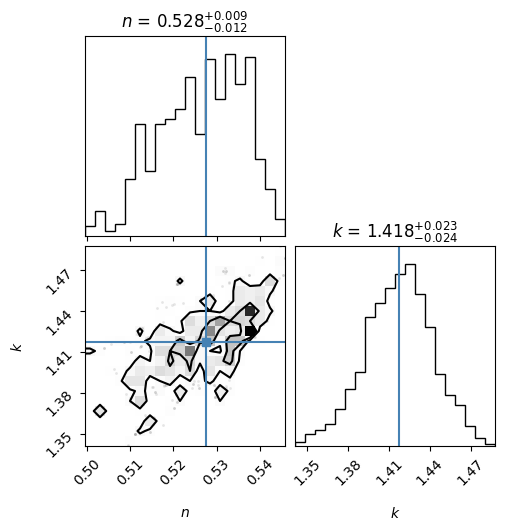

Execution time: 0.2561 seconds


In [96]:
# Apply burn-in to remove early exploration phase
burn_in = min(50, nsteps//4)  # discard first 50 steps or quarter the chain
chain = sampler.get_chain()  # shape: (nsteps, nwalkers, ndim)
chain_after_burnin = chain[burn_in:, :, :]  # discard burn-in samples

# Flatten the post-burn-in chain
flat_samples_burnin = chain_after_burnin.reshape(-1, ndim)

# Compute medians from post-burn-in samples
n_median = np.median(flat_samples_burnin[:, 0])
k_median = np.median(flat_samples_burnin[:, 1])

labels = [r"$n$", r"$k$"]

fig = corner.corner(flat_samples_burnin, labels=labels, levels=(1.-np.exp(-0.5), 1.-np.exp(-2.0)), truths=[n_median, k_median], show_titles=True, title_fmt=".3f")

#plt.suptitle(f'emcee Corner Plot (burn-in={burn_in} steps)', y=1.02)
plt.show()
fig.savefig("../outputs/graphs10_JAX_aKSL/mcmc_kn_corner_plot.png")

Keeping 11/12 walkers
Removed walkers: [8]


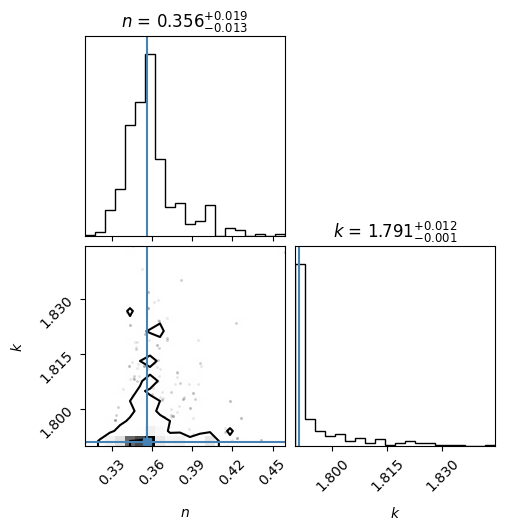

Execution time: 0.0788 seconds


In [76]:
chain = sampler.get_chain()

log_prob = sampler.get_log_prob()  # shape: (nsteps, nwalkers)
final_log_prob = log_prob[-1, :]

median_lp = np.median(final_log_prob)
mad = np.median(np.abs(final_log_prob - median_lp))

# Flag walkers that are way worse than the median
threshold = 10  # number of MADs
good_walkers = np.where(final_log_prob > median_lp - threshold * mad)[0]
print(f"Keeping {len(good_walkers)}/{nwalkers} walkers")
print(f"Removed walkers: {[i for i in range(nwalkers) if i not in good_walkers]}")

# Apply burn-in to remove early exploration phase
burn_in = min(50, nsteps//4)
chain_after_burnin = chain[burn_in:, :, :]  # (nsteps-burn_in, nwalkers, ndim)

# Remove bad walkers
chain_clean = chain_after_burnin[:, good_walkers, :]

flat_samples_clean = chain_clean.reshape(-1, ndim)

n_median = np.median(flat_samples_clean[:, 0])
k_median = np.median(flat_samples_clean[:, 1])

labels = [r"$n$", r"$k$"]
fig = corner.corner(flat_samples_clean, labels=labels, 
                    levels=(1.-np.exp(-0.5), 1.-np.exp(-2.0)), 
                    truths=[n_median, k_median], 
                    show_titles=True, title_fmt=".3f")
plt.show()
fig.savefig("../outputs/graphs10_JAX_aKSL/mcmc_kn_corner_plot.png")

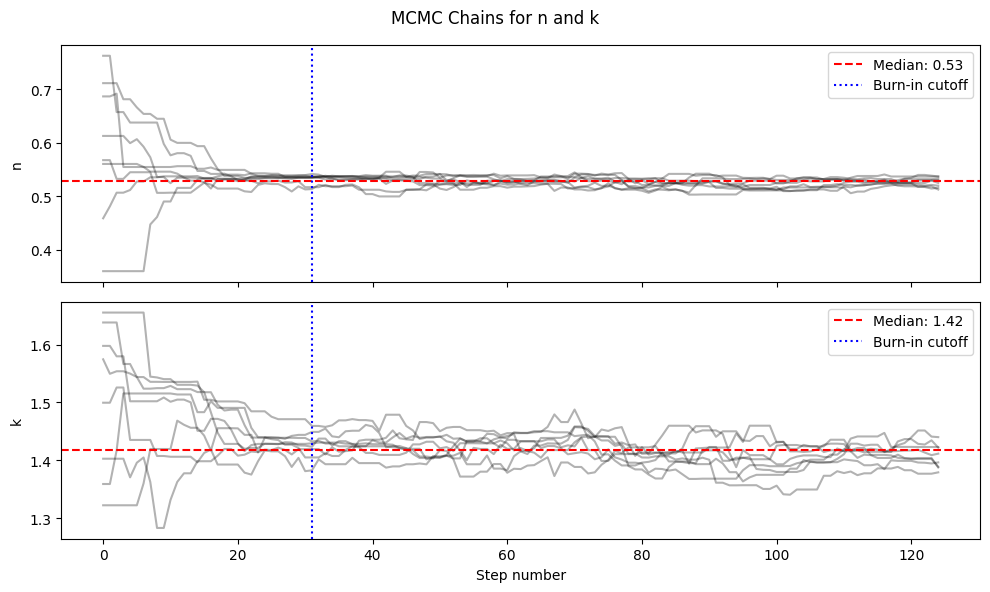

Execution time: 0.0985 seconds


In [ ]:
#chain = sampler.get_chain()

fig, axes = plt.subplots(2, 1, figsize=(10, 6), sharex=True)

axes[0].plot(chain[:, :, 03], alpha=0.3, color='k')
axes[0].set_ylabel('n')
axes[0].axhline(n_median, color='r', linestyle='--', label=f'Median: {n_median:.2f}')
axes[0].axvline(burn_in, color='b', linestyle=':', label='Burn-in cutoff')

axes[1].plot(chain[:, :, 1], alpha=0.3, color='k')
axes[1].set_ylabel('k')
axes[1].axhline(k_median, color='r', linestyle='--', label=f'Median: {k_median:.2f}')
axes[1].axvline(burn_in, color='b', linestyle=':', label='Burn-in cutoff')
axes[1].set_xlabel('Step number')

axes[0].legend()
axes[1].legend()
plt.suptitle('MCMC Chains for n and k')
plt.tight_layout()
plt.show()
fig.savefig("../outputs/graphs10_JAX_aKSL/mcmc_kn_chains.png")

### Grid Search

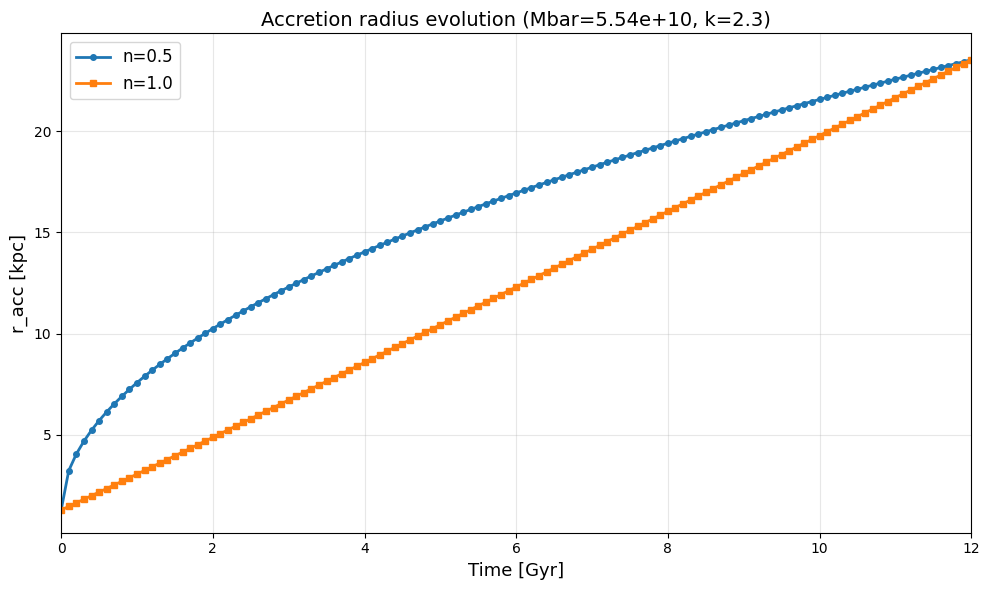

Execution time: 0.3567 seconds


In [93]:
# Quick plot: r_acc vs time for n=0.5 and n=1.0

Mbar_test = 5.54e10
k_test = 2.3

M_idx = np.argmin(np.abs(log_M_bar_array - np.log10(Mbar_test)))
r_acc_n05 = build_r_acc_matrix_for_all_M(0.5, k_test)[M_idx, :]
r_acc_n10 = build_r_acc_matrix_for_all_M(1.0, k_test)[M_idx, :]

plt.figure(figsize=(10, 6))
plt.plot(M_times1, r_acc_n05, 'o-', lw=2, label='n=0.5', markersize=4)
plt.plot(M_times1, r_acc_n10, 's-', lw=2, label='n=1.0', markersize=4)
plt.xlabel('Time [Gyr]', fontsize=13)
plt.ylabel('r_acc [kpc]', fontsize=13)
plt.title(f'Accretion radius evolution (Mbar={Mbar_test:.2e}, k={k_test})', fontsize=14)
plt.legend(fontsize=12)
plt.grid(alpha=0.3)
plt.xlim(0, 12)
plt.tight_layout()
plt.show()

In [138]:
n_grid = np.arange(0.3, 0.8, 0.05)#np.array([0.1, 0.25, 0.4, 0.6, 1.])
k_grid = np.arange(1.0, 2.0, 0.05)#np.array([1.0, 1.5, 1.75, 2.0, 2.5])

logL_grid = np.zeros((len(n_grid), len(k_grid)))
for i, n_val in enumerate(n_grid):
    for j, k_val in enumerate(k_grid):
        theta_ij = jnp.array([n_val, k_val], dtype=jnp.float64)

        r_acc_matrix_np_ij = build_r_acc_matrix_for_all_M(n_val, k_val)
        r_acc_matrix_jax_ij = jnp.array(r_acc_matrix_np_ij, dtype=jnp.float64)

        logL_ij = logL_jax(theta_ij,
                           logM_obs_jax,
                           jbar_obs_jax,
                           fgas_obs_jax,
                           sigma_fgas_jax,
                           sigma_jbar_jax,
                           r_acc_matrix_jax_ij,
                           logM_grid_jax)

        logL_grid[i, j] = float(logL_ij)
        
        print(f"Computed logL at n={n_val}, k={k_val}: {logL_grid[i, j]}")

Computed logL at n=0.3, k=1.0: -1571.247420870023
Computed logL at n=0.3, k=1.05: -1555.5735438816837
Computed logL at n=0.3, k=1.1: -1573.2476102538433
Computed logL at n=0.3, k=1.1500000000000001: -1610.6097349227239
Computed logL at n=0.3, k=1.2000000000000002: -1661.974842441382
Computed logL at n=0.3, k=1.2500000000000002: -1735.8428610450458
Computed logL at n=0.3, k=1.3000000000000003: -1827.3624087490105
Computed logL at n=0.3, k=1.3500000000000003: -1934.7647220439771
Computed logL at n=0.3, k=1.4000000000000004: -2052.6954708295007
Computed logL at n=0.3, k=1.4500000000000004: -2177.3490320587125
Computed logL at n=0.3, k=1.5000000000000004: -2306.978275091246
Computed logL at n=0.3, k=1.5500000000000005: -2442.1424468089626
Computed logL at n=0.3, k=1.6000000000000005: -2584.3739496791854
Computed logL at n=0.3, k=1.6500000000000006: -2733.797617854334
Computed logL at n=0.3, k=1.7000000000000006: -2888.031545965233
Computed logL at n=0.3, k=1.7500000000000007: -3046.0996926

Best fit: n=0.550, k=1.500, logL=-1217.39


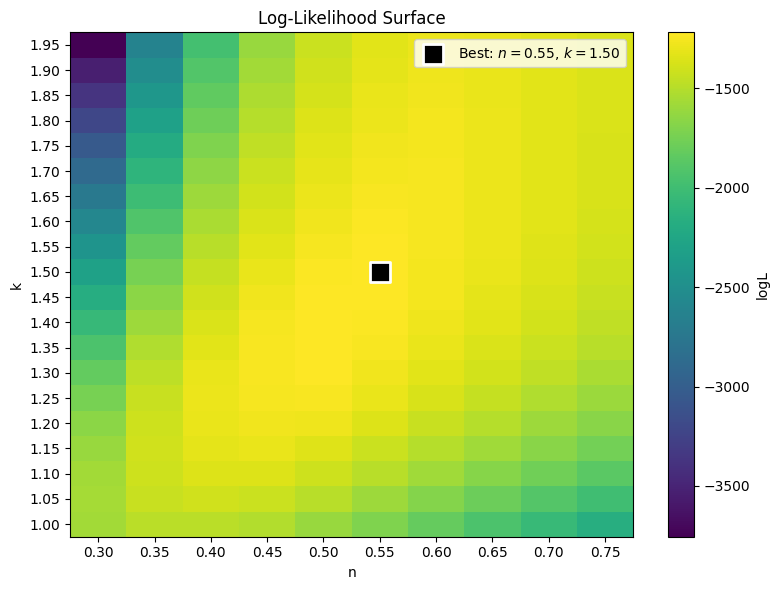

Execution time: 0.1276 seconds


In [146]:
# Find best fit
imax = np.unravel_index(np.argmax(logL_grid), logL_grid.shape)
n_best, k_best = n_grid[imax[0]], k_grid[imax[1]]
print(f"Best fit: n={n_best:.3f}, k={k_best:.3f}, logL={logL_grid[imax]:.2f}")

plt.figure(figsize=(8,6))

axl = plt.pcolormesh(n_grid, k_grid, logL_grid.T, 
                      cmap='viridis',
                      shading='auto')

plt.scatter([n_best], [k_best], color='k', marker='s', s=200, 
            edgecolors='white', linewidths=2, 
            label=r'Best: $n=%.2f$, $k=%.2f$' % (n_best, k_best))
plt.colorbar(axl, label='logL')
plt.xticks(n_grid)
plt.yticks(k_grid)
plt.xlabel('n')
plt.ylabel('k')
plt.title('Log-Likelihood Surface')
plt.legend()
plt.tight_layout()
plt.savefig("../outputs/graphs10_JAX_aKSL/logL_surface.png", dpi=150)
plt.show()

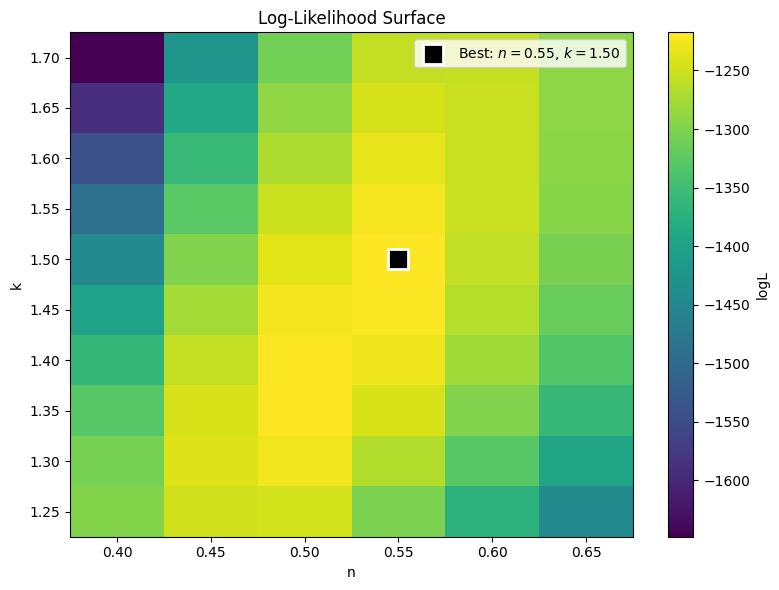

Execution time: 0.0635 seconds


In [150]:
plt.figure(figsize=(8,6))

axl = plt.pcolormesh(n_grid[2:8], k_grid[5:-5], logL_grid[2:8, 5:-5].T, 
                      cmap='viridis',
                      shading='auto')

plt.scatter([n_best], [k_best], color='k', marker='s', s=200, 
            edgecolors='white', linewidths=2, 
            label=r'Best: $n=%.2f$, $k=%.2f$' % (n_best, k_best))
plt.colorbar(axl, label='logL')
plt.xticks(n_grid[2:8])
plt.yticks(k_grid[5:-5])
plt.xlabel('n')
plt.ylabel('k')
plt.title('Log-Likelihood Surface')
plt.legend()
plt.tight_layout()
#plt.savefig("../outputs/graphs10_JAX_aKSL/logL_surface.png", dpi=150)
plt.show()

In [71]:
Mbar_obs = 10.0**obs_log_Mbar_mcmc

j_max = j_maxer(Mbar_obs)
j_min = j_max / 10.0

# k_min for each galaxy: from j_obs <= k*j_max
# At y=1 boundary: j_obs - j_min = k*j_max - j_min  =>  j_obs = k*j_max  =>  k = j_obs/j_max
k_min_per_galaxy = obs_jbar_mcmc / j_max

mask = obs_jbar_mcmc > j_min

if np.any(mask):
    k_min_sample = np.max(k_min_per_galaxy[mask])
    k_min = max(1.0, k_min_sample)
else:
    # All galaxies have j_obs <= j_min, so k >= 1 already makes them solvable
    k_min = 1.0

print(f"Suggested k_min from j_obs <= k*j_max: {k_min:.3f}")

Suggested k_min from j_obs <= k*j_max: 2.100
Execution time: 0.0070 seconds


In [72]:
names_comp = np.concatenate((BARY['Name'], ['HIX_galaxy']*len(HIX_data)))

idx_sorted = np.argsort(k_min_per_galaxy[mask])[::-1]
for i in idx_sorted[:5]:
    print(i, names_comp[i], obs_log_Mbar_mcmc[i], obs_jbar_mcmc[i], j_max[i], k_min_per_galaxy[i])
    
print("\nk_min values for top 5 galaxies:")
for i in idx_sorted[:5]:    
    print(f"{k_min_per_galaxy[i]:.3f}")
    
print([names_comp[i] for i in idx_sorted[:5]])

114 HIX_galaxy 10.59246815 6377.799997397691 3037.3983276937197 2.0997575257902774
5 DDO154     8.44715803134222 147.6 82.49456995133419 1.7892086726080674
2 DDO101     7.90687353472207 52.0 33.267309630764835 1.5630960416441855
85 UGC06446   9.093421685162236 355.8 244.45438396696355 1.4554862720240032
12 LVHIS030   8.991226075692495 259.3 205.87093419554284 1.259526999346632

k_min values for top 5 galaxies:
2.100
1.789
1.563
1.455
1.260
['HIX_galaxy', 'DDO154    ', 'DDO101    ', 'UGC06446  ', 'LVHIS030  ']
Execution time: 0.0035 seconds


In [151]:
# zoom in around best n, k
n_zoom = np.arange(0.49, 0.56, 0.01)
k_zoom = np.arange(1.35, 1.47, 0.01)

logL_zoom = np.zeros((len(n_zoom), len(k_zoom)))
for i, n_val in enumerate(n_zoom):
    for j, k_val in enumerate(k_zoom):
        theta_ij = jnp.array([n_val, k_val], dtype=jnp.float64)

        r_acc_matrix_np_ij = build_r_acc_matrix_for_all_M(n_val, k_val)
        r_acc_matrix_jax_ij = jnp.array(r_acc_matrix_np_ij, dtype=jnp.float64)

        logL_ij = logL_jax(theta_ij,
                           logM_obs_jax,
                           jbar_obs_jax,
                           fgas_obs_jax,
                           sigma_fgas_jax,
                           sigma_jbar_jax,
                           r_acc_matrix_jax_ij,
                           logM_grid_jax)

        logL_zoom[i, j] = float(logL_ij)
        
        print(f"Computed logL at n={n_val}, k={k_val}: {logL_zoom[i, j]}")

Computed logL at n=0.49, k=1.35: -1219.8581390179568
Computed logL at n=0.49, k=1.36: -1219.6866020752511
Computed logL at n=0.49, k=1.37: -1219.8471225757446
Computed logL at n=0.49, k=1.3800000000000001: -1220.326141683889
Computed logL at n=0.49, k=1.3900000000000001: -1221.1988595717442
Computed logL at n=0.49, k=1.4000000000000001: -1222.3920957492878
Computed logL at n=0.49, k=1.4100000000000001: -1223.8442503703966
Computed logL at n=0.49, k=1.4200000000000002: -1225.5372425650316
Computed logL at n=0.49, k=1.4300000000000002: -1227.4621798152994
Computed logL at n=0.49, k=1.4400000000000002: -1229.5963297886556
Computed logL at n=0.49, k=1.4500000000000002: -1231.9342714237023
Computed logL at n=0.49, k=1.4600000000000002: -1234.467396942379
Computed logL at n=0.5, k=1.35: -1218.0081360886966
Computed logL at n=0.5, k=1.36: -1217.425736700277
Computed logL at n=0.5, k=1.37: -1217.170838902578
Computed logL at n=0.5, k=1.3800000000000001: -1217.2256196662966
Computed logL at n=0

Best fit: n=0.530, k=1.410, logL=-1213.42


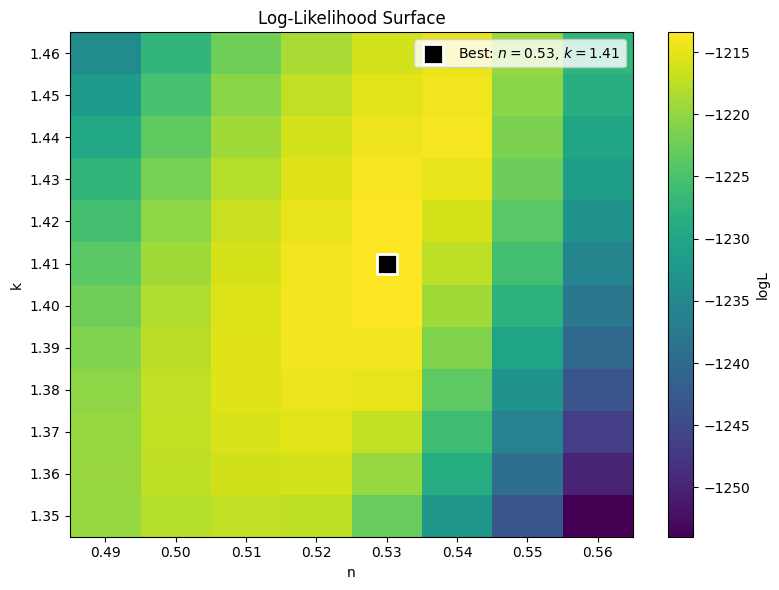

Execution time: 0.0683 seconds


In [152]:
# Find best fit
imax = np.unravel_index(np.argmax(logL_zoom), logL_zoom.shape)
n_best, k_best = n_zoom[imax[0]], k_zoom[imax[1]]
print(f"Best fit: n={n_best:.3f}, k={k_best:.3f}, logL={logL_zoom[imax]:.2f}")

plt.figure(figsize=(8,6))

axl = plt.pcolormesh(n_zoom, k_zoom, logL_zoom.T, 
                      cmap='viridis',
                      shading='auto')

plt.scatter([n_best], [k_best], color='k', marker='s', s=200, 
            edgecolors='white', linewidths=2, 
            label=r'Best: $n=%.2f$, $k=%.2f$' % (n_best, k_best))
plt.colorbar(axl, label='logL')
plt.xticks(n_zoom)
plt.yticks(k_zoom)
plt.xlabel('n')
plt.ylabel('k')
plt.title('Log-Likelihood Surface')
plt.legend()
plt.tight_layout()
#plt.savefig("../outputs/graphs10_JAX_aKSL/logL_surface.png", dpi=150)
plt.show()

# Final Plots

## Final Plot (10 $t_{acc}$ and 50 $M_{bar}$)

In [128]:
ns = 0.53#0.355#1.118
ks = 1.42#1.791#2.264

r_acc_matrix_np  = build_r_acc_matrix_for_all_M(ns, ks)
r_acc_matrix_jax = jnp.array(r_acc_matrix_np, dtype=jnp.float64)

log_M_bar_array = np.linspace(8,11.5,50)
logM_grid_jax = jnp.array(log_M_bar_array, dtype=jnp.float64)

omega_acc_array = np.array([-0.3, 0.1, 1/3, 0.5, 0.75, 1, 4, 8, 10], dtype=float)
t_acc_array = 1/omega_acc_array#np.array([1, 2, 3, 10, 25, -25, -10, -3], dtype=float)
t_acc_jax = jnp.array(t_acc_array, dtype=jnp.float64)

Mbar_grid = 10.0**log_M_bar_array
Mbar_grid_jax = jnp.array(Mbar_grid, dtype=jnp.float64)

f_gas_j, j_bar_j, j_gas_j, j_star_j, Ms_j, Mg_j = run_all_masses(
    Mbar_grid_jax,
    t_acc_jax,
    r_acc_matrix_jax,
    logM_grid_jax,
    star_formation_law="cutoff_ksl"
)

f_gas_array_10_50_cutoff_ksl = np.array(f_gas_j)
j_bar_array_10_50_cutoff_ksl = np.array(j_bar_j)
j_gas_array_10_50_cutoff_ksl = np.array(j_gas_j)
j_star_array_10_50_cutoff_ksl = np.array(j_star_j)
Mstar_grid = np.array(Ms_j)
Mgas_grid = np.array(Mg_j)
np.savetxt('../data/data9_JAX_aKSL/final_f_gas_cutoff_ksl.txt', f_gas_array_10_50_cutoff_ksl)
np.savetxt('../data/data9_JAX_aKSL/final_j_bar_cutoff_ksl.txt', j_bar_array_10_50_cutoff_ksl)
np.savetxt('../data/data9_JAX_aKSL/final_j_gas_cutoff_ksl.txt', j_gas_array_10_50_cutoff_ksl)
np.savetxt('../data/data9_JAX_aKSL/final_j_star_cutoff_ksl.txt', j_star_array_10_50_cutoff_ksl)
np.savetxt('../data/data9_JAX_aKSL/final_Mstar_grid_cutoff_ksl.txt', Mstar_grid)
np.savetxt('../data/data9_JAX_aKSL/final_Mgas_grid_cutoff_ksl.txt', Mgas_grid)

Execution time: 14.7628 seconds


### Plot

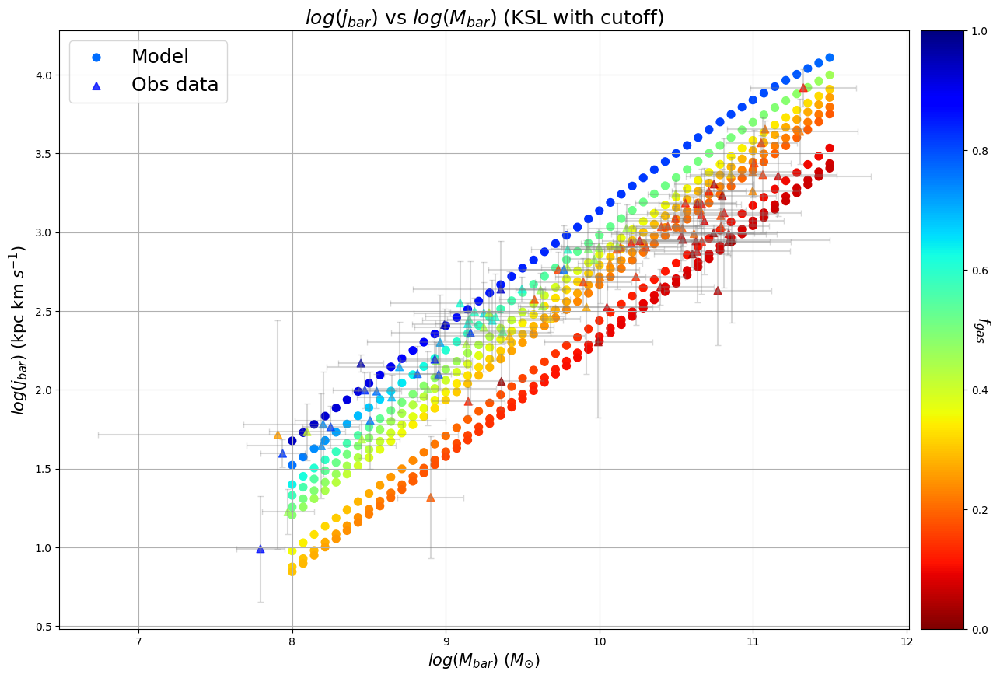

Execution time: 0.1675 seconds


In [129]:
f_gas_array_10_50_cutoff_ksl = np.nan_to_num(np.loadtxt('../data/data9_JAX_aKSL/final_f_gas_cutoff_ksl.txt'), nan=np.nan, posinf=1.0, neginf=0.0)
j_bar_array_10_50_cutoff_ksl = np.nan_to_num(np.loadtxt('../data/data9_JAX_aKSL/final_j_bar_cutoff_ksl.txt'), nan=np.nan, posinf=1.0, neginf=0.0)
log_M_bar_array = np.linspace(8,11.5,50)
t_acc_array = np.array([1,2,3,10,25,-25,-10,-3,-2,-1])

log_f_gas_array_10_50 = np.log10(f_gas_array_10_50_cutoff_ksl)
log_j_bar_array_10_50 = np.log10(j_bar_array_10_50_cutoff_ksl)

cmap = cm.jet_r
mpl.rc("image", cmap="jet_r")
fig = figure(figsize=(15,10),  facecolor='w')
frame = fig.add_subplot(1,1,1)

#Model
divider = make_axes_locatable(frame)
colbarframe1 = divider.append_axes("right", size="5%", pad=0.15)
for x, y, z in zip(log_M_bar_array, log_j_bar_array_10_50, f_gas_array_10_50_cutoff_ksl):
    mod = frame.scatter([x]*len(y), y, facecolors=cmap(z), s=50)
mod.set_label("Model")
cbar1 = fig.colorbar(mod, cax=colbarframe1)
cbar1.set_label(r"$f_{gas}$", rotation=270, fontsize=15)

#Data
frame.scatter(obs_log_Mbar, obs_log_jbar, label="Obs data", marker="^", facecolors=cmap(obs_fgas), s=50, alpha=0.8)
frame.errorbar(obs_log_Mbar, obs_log_jbar, xerr=obs_log_Mbar_errors, yerr=obs_log_jbar_errors, fmt = ' ', ecolor = 'grey', capsize = 3, alpha=0.3)

frame.set_title(r"$log(j_{bar})$ vs $log(M_{bar})$ (KSL with cutoff)", fontsize = 18)
frame.set_xlabel(r"$log(M_{bar})$ $(M_{\odot})$", fontsize = 15)
frame.set_ylabel(r"$log(j_{bar})$ (kpc km $s^{-1}$)", fontsize = 15)
frame.legend(prop={'size': 18})
frame.grid()
show()
fig.savefig(f'../outputs/graphs10_JAX_aKSL/log j_bar vs log_M_bar with Pavel (50 masses, cutoff KSL, k{ks}, n{ns}).png')

# Interpolate at constant $M_{bar}$

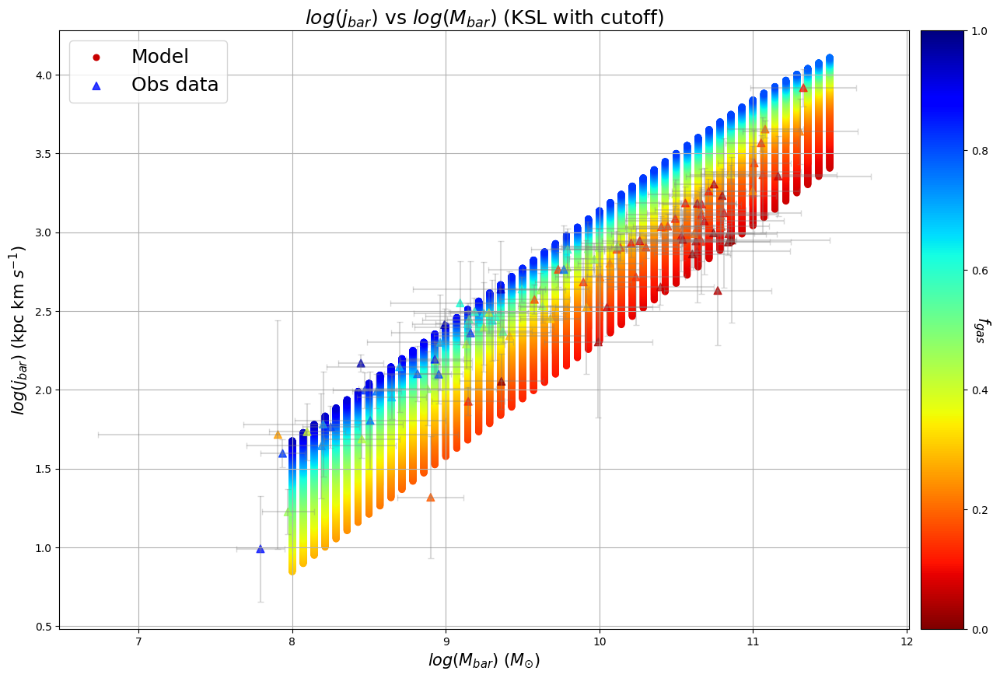

Execution time: 1.0365 seconds


In [130]:
cmap = cm.jet_r
mpl.rc("image", cmap="jet_r")
fig = figure(figsize=(15,10), facecolor='w')
frame = fig.add_subplot(1,1,1)

#Model
divider = make_axes_locatable(frame)
colbarframe = divider.append_axes("right", size="5%", pad=0.15)

n=1000
interp_f_gas_array_10_50_cutoff_ksl = np.zeros((len(log_M_bar_array),n))
for i,Mbar in enumerate(log_M_bar_array):
    interp_f_gas_array_10_50_cutoff_ksl[i] = np.linspace(f_gas_array_10_50_cutoff_ksl[i].min(),f_gas_array_10_50_cutoff_ksl[i].max(),n)

interp_j_bar_array_10_50_cutoff_ksl = np.zeros((len(log_M_bar_array),n))
for i,Mbar in enumerate(log_M_bar_array):
    ipl_10_50 = spl.interp1d(f_gas_array_10_50_cutoff_ksl[i], log_j_bar_array_10_50[i], kind='linear')
    interp_j_bar_array_10_50_cutoff_ksl[i] = ipl_10_50(interp_f_gas_array_10_50_cutoff_ksl[i])

for x, y, z in zip(log_M_bar_array, interp_j_bar_array_10_50_cutoff_ksl, interp_f_gas_array_10_50_cutoff_ksl):
    mod = frame.scatter([x]*len(y), y, facecolors=cmap(z), s=30)
mod.set_label("Model")
cbar = fig.colorbar(mod, cax=colbarframe)
cbar.set_label(r"$f_{gas}$", rotation=270, fontsize=15)

#Data
frame.scatter(obs_log_Mbar, obs_log_jbar, label="Obs data", marker="^", facecolors=cmap(obs_fgas), s=50, alpha=0.8)
frame.errorbar(obs_log_Mbar, obs_log_jbar, xerr=obs_log_Mbar_errors, yerr=obs_log_jbar_errors, fmt = ' ', ecolor = 'grey', capsize = 3, alpha=0.3)

frame.set_title(r"$log(j_{bar})$ vs $log(M_{bar})$ (KSL with cutoff)", fontsize = 18)
frame.set_xlabel(r"$log(M_{bar})$ $(M_{\odot})$", fontsize = 15)
frame.set_ylabel(r"$log(j_{bar})$ (kpc km $s^{-1}$)", fontsize = 15)
frame.legend(prop={'size': 18})
frame.grid()
show()
fig.savefig('../outputs/graphs10_JAX_aKSL/log j_bar vs log_M_bar with Pavel (cutoff KSL).png')

## Interpolator

In [131]:
def modelled_j_bar2(f_gas_array, j_bar_array, f_gas_value, kind=1):
    """
    The function takes as input the arrays for f_gas and j_bar (possibly already interpolated), 
    together with a wanted value of f_gas for which to slice out the 1D array. 
    
    ------------
    Inputs:
    - f_gas_array = interpolated 2D array of f_gas
    - j_bar_array = interpolated 2D array of j_bar
    - f_gas_value = value of f_gas for which to slice the f_gas/j_bar arrays
    - kind = Inerpolation type (default is 1 - linear)
    
    The function does the following
    - Creates a list 'index_array', which has the indexes of constant f_gas_value chosen as elements.
    - Then, it iteratively takes from the j_bar_array the values corresponding to the indexes from index_array
    - Finally it interpolates the indexed j_bar_array through the M_bar_array, to get a plottable linear function.
    
    Returns:
    - indexed_M_array_lin = A simple linspace with the initial and final values of the original log_M_bar_array
    """
    indexed_j_array = []
    index_array = []
    true_list = []
    
    for i in range(len(log_M_bar_array)):
        if f_gas_value>np.min(f_gas_array[i]) and f_gas_value<np.max(f_gas_array[i]):
            index_array.append(np.argwhere(f_gas_array[i] == min(f_gas_array[i], key=lambda x:abs(x-f_gas_value))))
            true_list.append(1)
        else:
            index_array.append(0)
            true_list.append(0)
    
    j = 0
    while (j<50):
        if (true_list[j]==1):
            indexed_j_array.append(j_bar_array[j][index_array[j]])
        j += 1
    
    if len(indexed_j_array)>kind:
        index = np.argwhere(np.array(true_list) == 1)
        indexed_M_array = log_M_bar_array[index]
        indexed_M_array_lin = np.linspace(indexed_M_array[0], indexed_M_array[-1], 1000)
        interpolation = spl.InterpolatedUnivariateSpline(indexed_M_array.reshape(len(indexed_M_array),), indexed_j_array, k=kind)
        interpolated_j_array = interpolation(indexed_M_array_lin).reshape(len(indexed_M_array_lin),)
    else:
        indexed_M_array_lin = []
        interpolated_j_array = []
    
    return indexed_M_array_lin, interpolated_j_array

Execution time: 0.0012 seconds


## Final Graph -- interpolation at constant $f_{gas}$

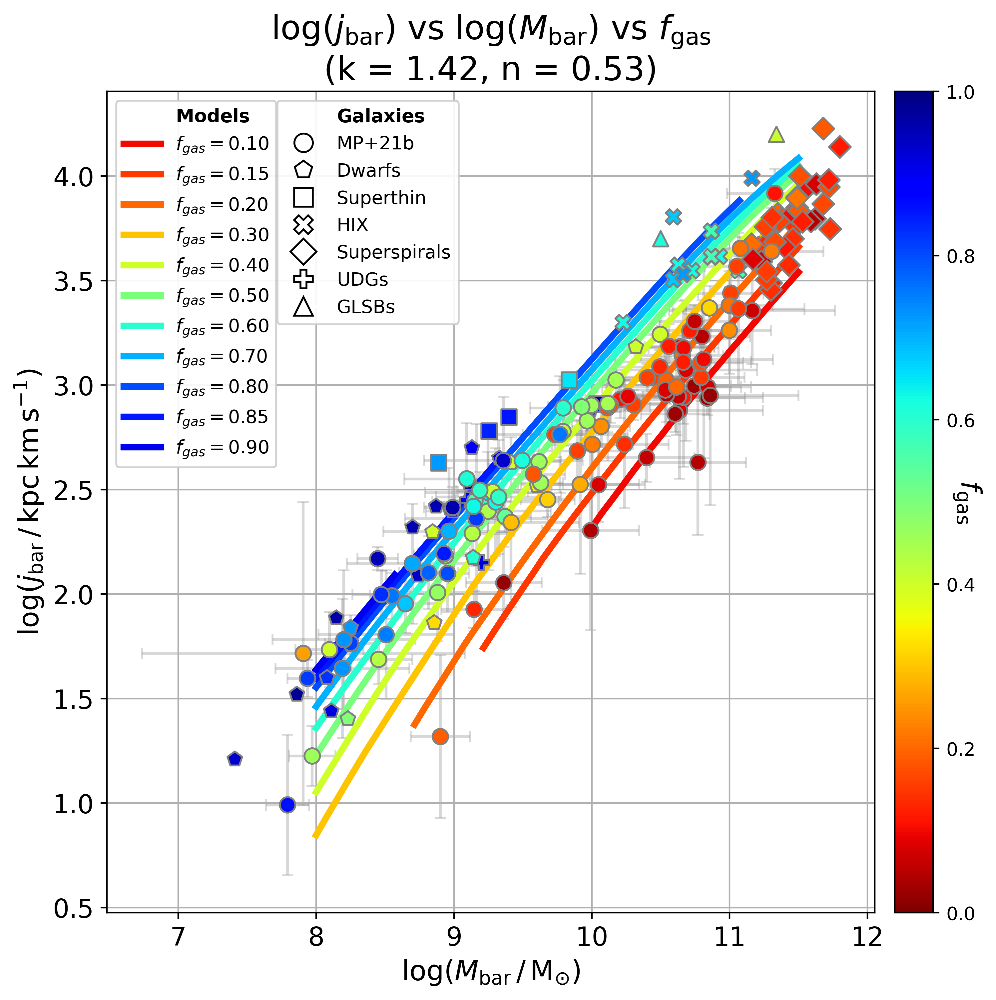

Execution time: 0.5126 seconds


In [137]:
cmap = cm.jet_r
mpl.rc("image", cmap="jet_r")
fig = figure(figsize=(8,8), dpi=400, facecolor='w')
frame = fig.add_subplot(1,1,1)

#Model
divider = make_axes_locatable(frame)
colbarframe = divider.append_axes("right", size="5%", pad=0.15)

mods = frame.plot([], [], ' ', label="Models")

f_gas_values = [0.05, 0.1,0.15,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.85,0.9,0.95]
colors = cmap(f_gas_values)
ax1s = []
for i,f_gas_value in enumerate(f_gas_values):
    indexed_M_array_lin, indexed_j_array = modelled_j_bar2(interp_f_gas_array_10_50_cutoff_ksl, interp_j_bar_array_10_50_cutoff_ksl, f_gas_value)
    ax1 = frame.plot(indexed_M_array_lin, indexed_j_array, label=r"$f_{gas} = $"+f"{f_gas_value:.2f}", color=colors[i], lw=3.5, zorder=2)
    if len(indexed_M_array_lin) > 0:
        ax1s.append(ax1[0])

#Data
ax2 = frame.scatter(obs_log_Mbar, obs_log_jbar, label="MP+21b", marker="o", facecolors=cmap(obs_fgas), edgecolors="grey", s=70, zorder=9)
frame.errorbar(obs_log_Mbar, obs_log_jbar, xerr=obs_log_Mbar_errors, yerr=obs_log_jbar_errors, fmt = ' ', ecolor = 'grey', capsize = 3, alpha=0.3, zorder=0)
cbar = fig.colorbar(ax2, cax=colbarframe)
cbar.set_label(r"$f_{\rm gas}$", rotation=270, fontsize=15)

marker_map = {
    'Dwarfs': 'p',
    'Superthin': 's', 
    'HIX': 'X',
    'Superspirals': 'D',
    'UDGs': 'P',
    'GLSBs': '^'
}
# scatter_legends = []
for i, (idx, df) in enumerate(pavel_data.items(), start=3):
    marker = marker_map[idx]
    # print(idx, marker)
    scatter = frame.scatter(df['logMbar'], df['logjbar'], label=idx, marker=marker, facecolors=cmap(df['fgas'].values.copy()), edgecolors="grey", s=70, zorder=i)
    # scatter_legends.append(scatter)

# Legend
models_header = plt.Line2D([0], [0], color='none', label=r"$\mathbf{Models}$")
models_legend_elements = [models_header] + ax1s
 
galaxies_header = plt.Line2D([0], [0], color='none', label=r"$\mathbf{Galaxies}$")
galaxy_legend_elements = [
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='none', markeredgecolor='k', markersize=10, label="MP+21b")
] + [
    plt.Line2D([0], [0], marker=marker_map[name], color='w', markerfacecolor='none', markeredgecolor='k', markersize=10, label=name)
    for name in ['Dwarfs', 'Superthin', 'HIX', 'Superspirals', 'UDGs', 'GLSBs']
]
galaxies_legend_elements = [galaxies_header] + galaxy_legend_elements

leg1 = frame.legend(handles=models_legend_elements, loc='upper left', framealpha=0.9)
frame.add_artist(leg1)
leg2 = frame.legend(handles=galaxies_legend_elements, loc='upper left', bbox_to_anchor=(0.21, 1.0), framealpha=0.9)
# frame.legend(handles=models_legend_elements + galaxies_legend_elements, 
#              ncol=2, columnspacing=2.0, loc='upper left')
    
# scatter_legend_elements = [
#     plt.Line2D([0], [0], marker=marker, color='w', markerfacecolor='none', markeredgecolor='k', markersize=10, label=name)
#     for marker, name in zip(('p', 's', 'X', 'D', 'P', '^'), ('Dwarfs', 'Superthin', 'HIX', 'Superspirals', 'UDGs', 'GLSBs'))
# ]
    
# legend_elements = scatter_legend_elements + [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='none', markeredgecolor='k', markersize=10, label="MP+21b")] + mods + ax1s

frame.set_title(rf"$\log(j_{{\rm bar}})$ vs $\log(M_{{\rm bar}})$ vs $f_{{\rm gas}}$" + '\n' + f"(k = {ks}, n = {ns})", fontsize = 18)
frame.set_xlabel(r"$\log(M_{\rm bar} \, / \, \rm M_{\odot})$", fontsize = 15)
frame.set_ylabel(r"$\log(j_{\rm bar} \, / \, \rm kpc \, km \, s^{-1})$", fontsize = 15)
#frame.legend(handles=legend_elements, ncol=2)
frame.tick_params(labelsize=14)
frame.grid(zorder=1)
show()
fig.savefig('../outputs/graphs10_JAX_aKSL/log j_bar vs log_M_bar with Pavel (interpolated, cutoff KSL).png')

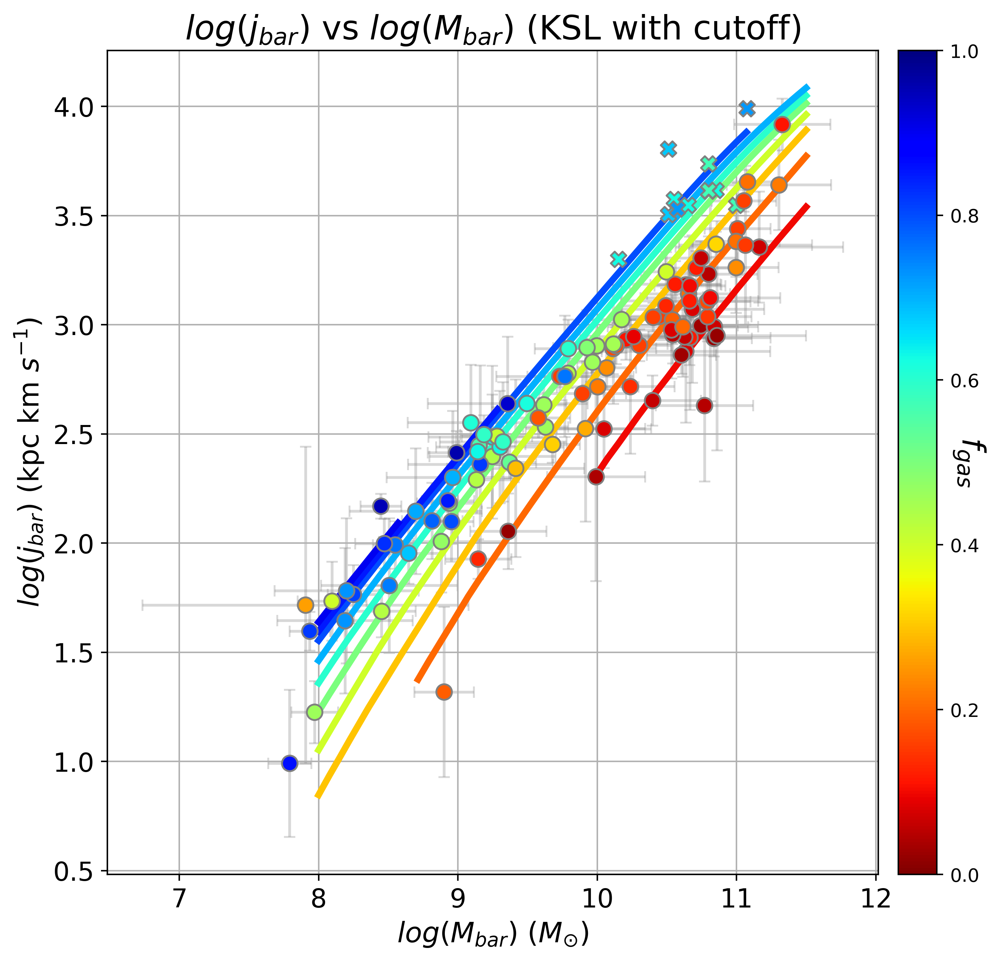

Execution time: 0.3844 seconds


In [133]:
cmap = cm.jet_r
mpl.rc("image", cmap="jet_r")
fig = figure(figsize=(8,8), dpi=400)#, facecolor='w'
frame = fig.add_subplot(1,1,1)

#Model
divider = make_axes_locatable(frame)
colbarframe = divider.append_axes("right", size="5%", pad=0.15)

frame.plot([], [], ' ', label="Models")

f_gas_values = [0.05,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.85,0.9]
colors = cmap(f_gas_values)
for i,f_gas_value in enumerate(f_gas_values):
    indexed_M_array_lin, indexed_j_array = modelled_j_bar2(interp_f_gas_array_10_50_cutoff_ksl, interp_j_bar_array_10_50_cutoff_ksl, f_gas_value)
    ax1 = frame.plot(indexed_M_array_lin, indexed_j_array, label=r"$f_{gas} = $"+f"{f_gas_value:.2f}", color=colors[i], lw=3.5, zorder=2)

#frame.plot(log_M_bar_array, np.log10(j_maxer(10**log_M_bar_array)), color='k', lw=3.5, linestyle='dashed', alpha=0.6, label=r"$j_{max}$")

#Data
ax2 = frame.scatter(obs_log_Mbar, obs_log_jbar, label="Obs data", marker="o", facecolors=cmap(obs_fgas), edgecolors="grey", s=70, zorder=4)
frame.errorbar(obs_log_Mbar, obs_log_jbar, xerr=obs_log_Mbar_errors, yerr=obs_log_jbar_errors, fmt = ' ', ecolor = 'grey', capsize = 3, alpha=0.3, zorder=0)
cbar = fig.colorbar(ax2, cax=colbarframe)
cbar.set_label(r"$f_{gas}$", rotation=270, fontsize=17)

ax3 = frame.scatter(np.log10(10**HIX_data['logM*'].values.copy() + 10**HIX_data['logMHI'].values.copy()), HIX_data['logjbar'].values.copy(), label="HIX", marker="X", facecolors=cmap(HIX_data['fgas'].values.copy()), edgecolors="grey", s=70, zorder=3)

frame.set_title(r"$log(j_{bar})$ vs $log(M_{bar})$ (KSL with cutoff)", fontsize = 18)
frame.set_xlabel(r"$log(M_{bar})$ $(M_{\odot})$", fontsize = 15)
frame.set_ylabel(r"$log(j_{bar})$ (kpc km $s^{-1}$)", fontsize = 15)
#frame.legend(prop={'size': 12})
frame.tick_params(labelsize=14)
frame.grid(zorder=1)
show()
fig.savefig('../outputs/graphs10_JAX_aKSL/log j_bar vs log_M_bar with Pavel (interpolated, cutoff KSL, no legend).png')

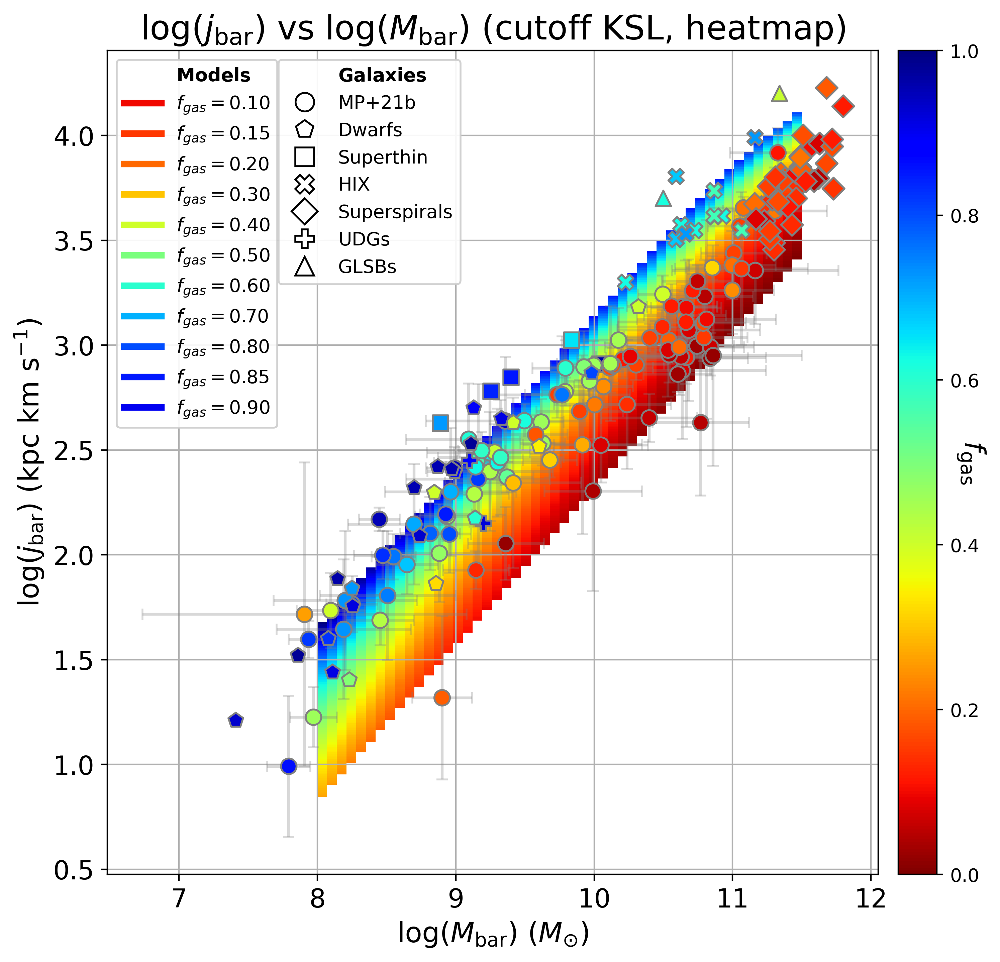

Execution time: 0.5523 seconds


In [134]:
logj_min = np.nanmin(interp_j_bar_array_10_50_cutoff_ksl)
logj_max = np.nanmax(interp_j_bar_array_10_50_cutoff_ksl)

n_j = 400 # number of j grid points
logj_grid = np.linspace(logj_min, logj_max, n_j)

n_M = len(log_M_bar_array)
F_grid = np.full((n_M, n_j), np.nan)  # F_grid[i_M, i_j] = f_gas at (logM[i_M], logj_grid[i_j])

for iM in range(n_M):
    logj_i = interp_j_bar_array_10_50_cutoff_ksl[iM]      # shape (n_interp,)
    f_i    = interp_f_gas_array_10_50_cutoff_ksl[iM]      # shape (n_interp,)

    mask = np.isfinite(logj_i) & np.isfinite(f_i)
    if mask.sum() < 2:
        continue

    logj_i = logj_i[mask]
    f_i    = f_i[mask]

    # sort by log j so interpolation is well-defined
    order = np.argsort(logj_i)
    logj_i = logj_i[order]
    f_i    = f_i[order]

    # f_gas as a function of log j for this mass
    f_interp = spl.interp1d(
        logj_i, f_i,
        kind='linear',
        bounds_error=False,
        fill_value=np.nan
    )

    F_grid[iM, :] = f_interp(logj_grid)

# --- 2. Plot heatmap + data ---

cmap = cm.jet_r
plt.rc("image", cmap="jet_r")

fig = plt.figure(figsize=(8, 8), dpi=400, facecolor='w')
frame = fig.add_subplot(1, 1, 1)

divider = make_axes_locatable(frame)
colbarframe = divider.append_axes("right", size="5%", pad=0.15)

# imshow wants (Ny, Nx); our F_grid is (n_M, n_j),
# so transpose and map x -> log M, y -> log j
F_im = np.ma.masked_invalid(F_grid.T)  # shape (n_j, n_M)

im = frame.imshow(
    F_im,
    origin='lower',
    aspect='auto',
    extent=[
        log_M_bar_array.min(), log_M_bar_array.max(),
        logj_min, logj_max
    ],
    cmap=cmap,
    interpolation='nearest',
    vmin=np.nanmin(F_grid),
    vmax=np.nanmax(F_grid),
)

# --- overlay observational points (same as before) ---

# main MP+21 sample
ax2 = frame.scatter(
    obs_log_Mbar,
    obs_log_jbar,
    label="MP+21b",
    marker="o",
    facecolors=cmap(obs_fgas),
    edgecolors="grey",
    s=70,
    zorder=5,
)
frame.errorbar(
    obs_log_Mbar,
    obs_log_jbar,
    xerr=obs_log_Mbar_errors,
    yerr=obs_log_jbar_errors,
    fmt=' ',
    ecolor='grey',
    capsize=3,
    alpha=0.3,
    zorder=4,
)

cbar = fig.colorbar(ax2, cax=colbarframe)
cbar.set_label(r"$f_{\rm gas}$", rotation=270, fontsize=15)

marker_map = {
    'Dwarfs': 'p',
    'Superthin': 's', 
    'HIX': 'X',
    'Superspirals': 'D',
    'UDGs': 'P',
    'GLSBs': '^'
}
# scatter_legends = []
for i, (idx, df) in enumerate(pavel_data.items(), start=3):
    marker = marker_map[idx]
    # print(idx, marker)
    scatter = frame.scatter(df['logMbar'], df['logjbar'], label=idx, marker=marker, facecolors=cmap(df['fgas'].values.copy()), edgecolors="grey", s=70, zorder=i)
    # scatter_legends.append(scatter)

# Legend
models_header = plt.Line2D([0], [0], color='none', label=r"$\mathbf{Models}$")
models_legend_elements = [models_header] + ax1s
 
galaxies_header = plt.Line2D([0], [0], color='none', label=r"$\mathbf{Galaxies}$")
galaxy_legend_elements = [
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='none', markeredgecolor='k', markersize=10, label="MP+21b")
] + [
    plt.Line2D([0], [0], marker=marker_map[name], color='w', markerfacecolor='none', markeredgecolor='k', markersize=10, label=name)
    for name in ['Dwarfs', 'Superthin', 'HIX', 'Superspirals', 'UDGs', 'GLSBs']
]
galaxies_legend_elements = [galaxies_header] + galaxy_legend_elements

leg1 = frame.legend(handles=models_legend_elements, loc='upper left', framealpha=0.9)
frame.add_artist(leg1)
leg2 = frame.legend(handles=galaxies_legend_elements, loc='upper left', bbox_to_anchor=(0.21, 1.0), framealpha=0.9)

frame.set_title(r"$\log(j_{\rm bar})$ vs $\log(M_{\rm bar})$ (cutoff KSL, heatmap)", fontsize=18)
frame.set_xlabel(r"$\log(M_{\rm bar})\ (M_{\odot})$", fontsize=15)
frame.set_ylabel(r"$\log(j_{\rm bar})$ (kpc km s$^{-1}$)", fontsize=15)
frame.tick_params(labelsize=14)
#frame.legend(handles=legend_elements)
frame.grid(zorder=1)
plt.show()
fig.savefig('../outputs/graphs10_JAX_aKSL/log_jbar_vs_logMbar_heatmap_cutoffKSL.png')

### $j_{\rm bar}$ vs $f_{\rm gas}$ at fixed $M_{\rm bar}$

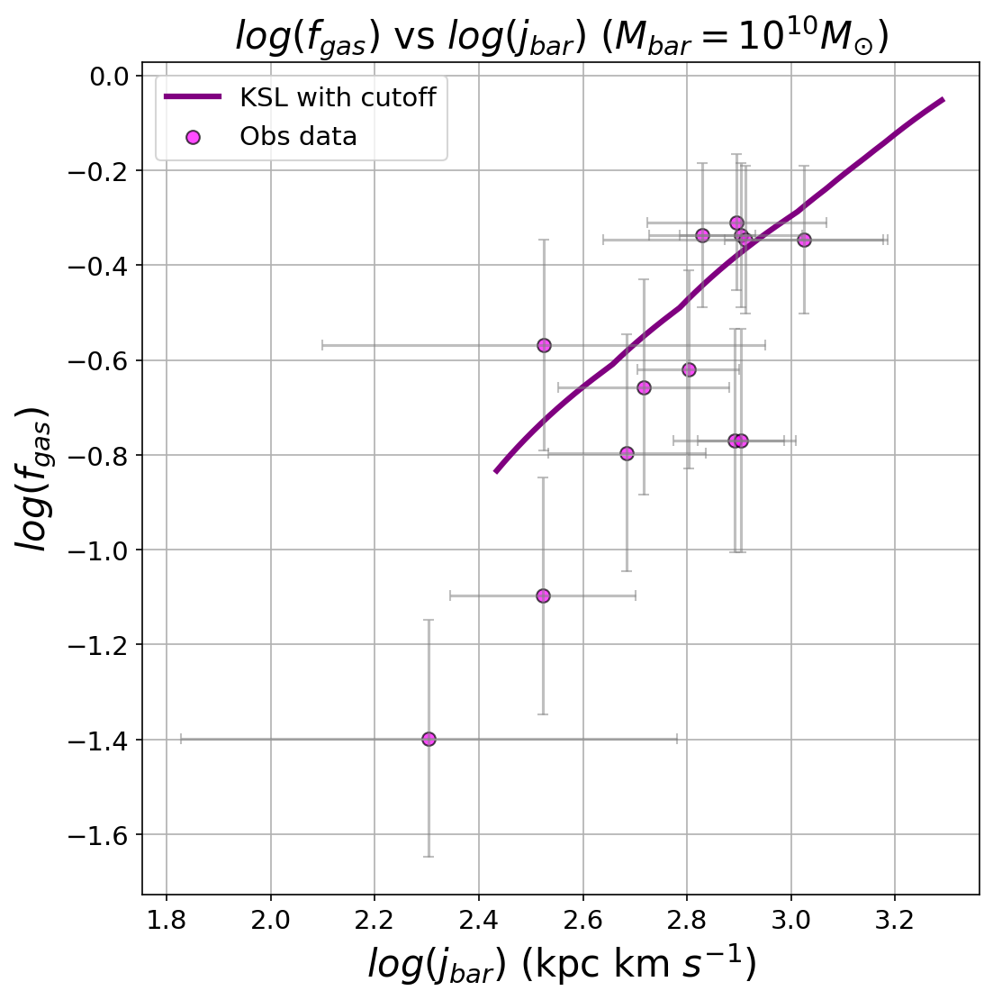

Execution time: 0.0814 seconds


In [139]:
BARY_10 = pd.read_csv('../data/baryons_10.csv')

BARY_10['j'] =  pd.to_numeric(BARY_10['j'], errors='coerce')
BARY_10['e_j'] =  pd.to_numeric(BARY_10['e_j'], errors='coerce')
BARY_10['fgas'] =  pd.to_numeric(BARY_10['fgas'], errors='coerce')
BARY_10['e_fgas'] =  pd.to_numeric(BARY_10['e_fgas'], errors='coerce')

obs_fgas_10 = np.log10(BARY_10['fgas'])
obs_fgas_errors_10 = BARY_10['e_fgas']/BARY_10['fgas']
obs_jbar_10 = np.log10(BARY_10['j'])
obs_jbar_errors_10 = BARY_10['e_j']/BARY_10['j']

M_bar_index_10 = np.argwhere(log_M_bar_array == 10)[0][0]

HIX_indices_10 = np.where((HIX_logMbar >= 9.8) & (HIX_logMbar <= 10.2))[0]

fig = figure(figsize=(8,8), dpi=150, facecolor='w')
frame = fig.add_subplot(1,1,1)
# frame.plot(interp_j_bar_array_10_50_old_ksl[M_bar_index_10], np.log10(interp_f_gas_array_10_50_old_ksl[M_bar_index_10]), label="Standard KSL", color="b", lw=3)
# frame.plot(interp_j_bar_array_10_50_new_ksl[M_bar_index_10], np.log10(interp_f_gas_array_10_50_new_ksl[M_bar_index_10]), label="New Fitted KSL", color="r", lw=3, ls='--')
# frame.plot(interp_j_bar_array_10_50_boissier[M_bar_index_10], np.log10(interp_f_gas_array_10_50_boissier[M_bar_index_10]), label="Boissier SFL", color="g", lw=3, ls='dotted')
frame.plot(interp_j_bar_array_10_50_cutoff_ksl[M_bar_index_10], np.log10(interp_f_gas_array_10_50_cutoff_ksl[M_bar_index_10]), label="KSL with cutoff", color="purple", lw=3)
frame.scatter(obs_jbar_10, obs_fgas_10, label="Obs data", facecolors='magenta', edgecolors='k', s=50, alpha=0.7)
frame.errorbar(obs_jbar_10, obs_fgas_10, xerr=obs_jbar_errors_10, yerr=obs_fgas_errors_10, fmt = ' ', ecolor = 'grey', capsize = 3, alpha=0.5)
#frame.scatter(np.log10(HIX_fgas[HIX_indices_10]), np.log10(HIX_jbar[HIX_indices_10]), label="HIX", marker="X", facecolors='magenta', edgecolors='k', s=50, alpha=0.7)
frame.set_title(r"$log(f_{gas})$ vs $log(j_{bar})$ ($M_{bar} = 10^{10} M_{\odot}$)", fontsize = 20)
frame.set_ylabel(r"$log(f_{gas})$", fontsize = 20)
frame.set_xlabel(r"$log(j_{bar})$ (kpc km $s^{-1}$)", fontsize = 20)
frame.legend(prop={'size': 14})
frame.tick_params(labelsize=14)
#frame.set_xlim(-1.75,0)
frame.grid()
show()

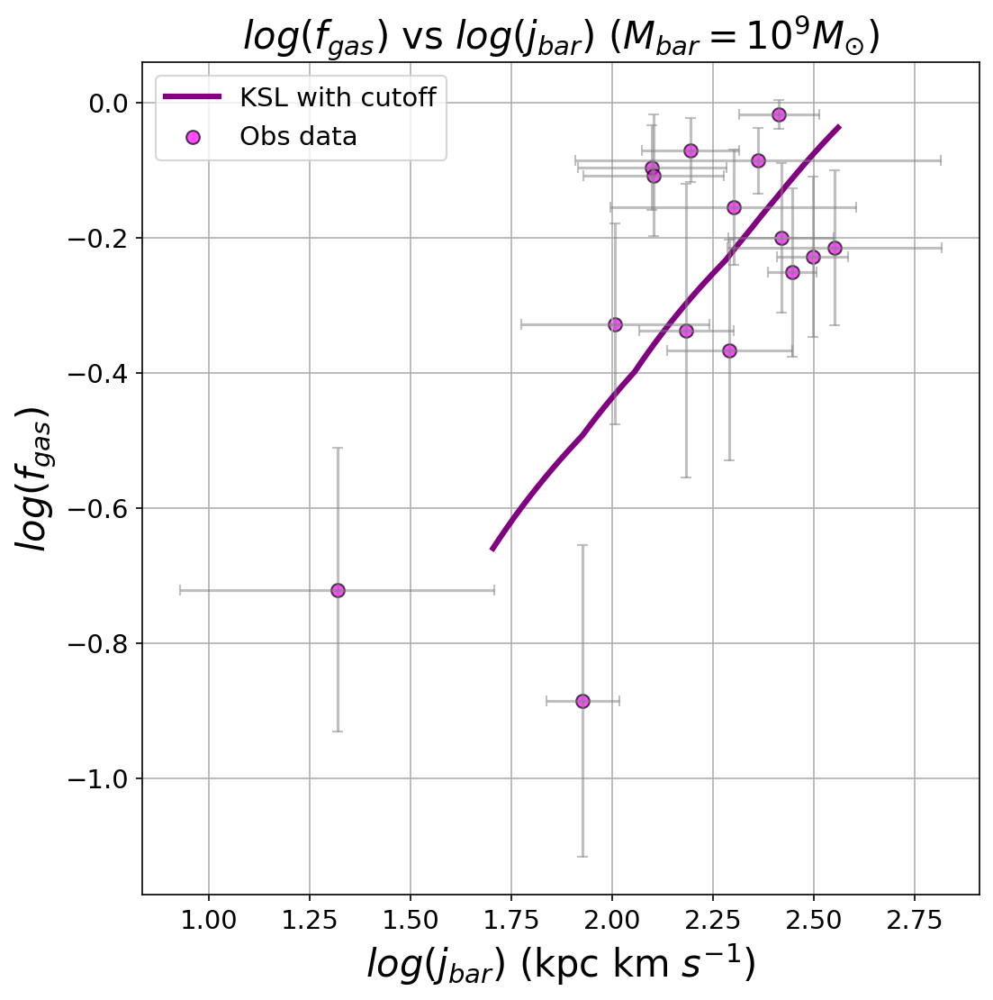

Execution time: 0.0839 seconds


In [140]:
BARY_9 = pd.read_csv('../data/baryons_9.csv')

BARY_9['j'] =  pd.to_numeric(BARY_9['j'], errors='coerce')
BARY_9['e_j'] =  pd.to_numeric(BARY_9['e_j'], errors='coerce')
BARY_9['fgas'] =  pd.to_numeric(BARY_9['fgas'], errors='coerce')
BARY_9['e_fgas'] =  pd.to_numeric(BARY_9['e_fgas'], errors='coerce')

obs_fgas_10 = np.log10(BARY_9['fgas'])
obs_fgas_errors_10 = BARY_9['e_fgas']/BARY_9['fgas']
obs_jbar_10 = np.log10(BARY_9['j'])
obs_jbar_errors_10 = BARY_9['e_j']/BARY_9['j']

M_bar_index_9 = np.argwhere(log_M_bar_array == 9)[0][0]

fig = figure(figsize=(8,8), dpi=150, facecolor='w')
frame = fig.add_subplot(1,1,1)
# frame.plot(interp_j_bar_array_10_50_old_ksl[M_bar_index_9], np.log10(interp_f_gas_array_10_50_old_ksl[M_bar_index_9]), label="Standard KSL", color="b", lw=3)
# frame.plot(interp_j_bar_array_10_50_new_ksl[M_bar_index_9], np.log10(interp_f_gas_array_10_50_new_ksl[M_bar_index_9]), label="New Fitted KSL", color="r", lw=3, ls='--')
# frame.plot(interp_j_bar_array_10_50_boissier[M_bar_index_9], np.log10(interp_f_gas_array_10_50_boissier[M_bar_index_9]), label="Boissier SFL", color="g", lw=3, ls='dotted')
frame.plot(interp_j_bar_array_10_50_cutoff_ksl[M_bar_index_9], np.log10(interp_f_gas_array_10_50_cutoff_ksl[M_bar_index_9]), label="KSL with cutoff", color="purple", lw=3)
frame.scatter(obs_jbar_10, obs_fgas_10, label="Obs data", facecolors='magenta', edgecolors='k', s=50, alpha=0.7)
frame.errorbar(obs_jbar_10, obs_fgas_10, xerr=obs_jbar_errors_10, yerr=obs_fgas_errors_10, fmt = ' ', ecolor = 'grey', capsize = 3, alpha=0.5)
frame.set_title(r"$log(f_{gas})$ vs $log(j_{bar})$ ($M_{bar} = 10^{9} M_{\odot}$)", fontsize = 20)
frame.set_ylabel(r"$log(f_{gas})$", fontsize = 20)
frame.set_xlabel(r"$log(j_{bar})$ (kpc km $s^{-1}$)", fontsize = 20)
frame.legend(prop={'size': 14})
frame.tick_params(labelsize=14)
#frame.set_xlim(-1,0)
frame.grid()
show()

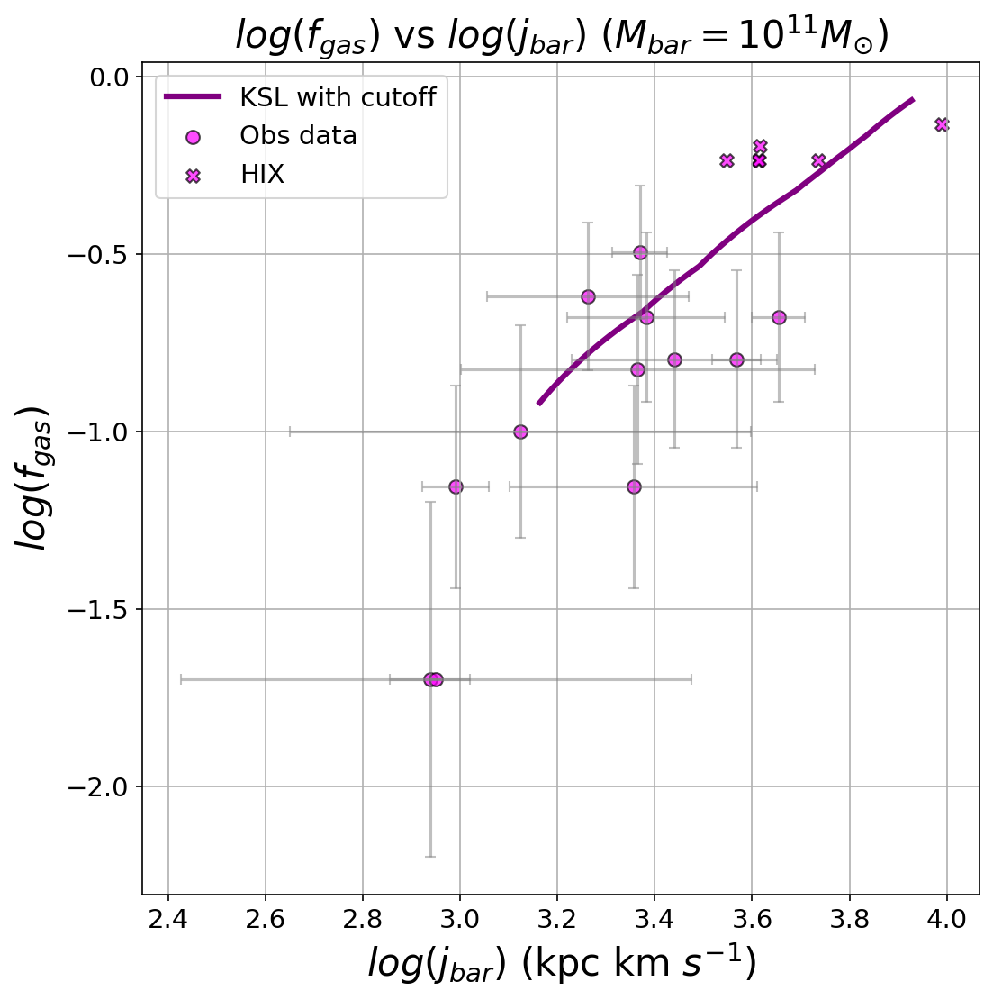

Execution time: 0.0718 seconds


In [141]:
BARY_11 = pd.read_csv('../data/baryons_11.csv')

BARY_11['j'] =  pd.to_numeric(BARY_11['j'], errors='coerce')
BARY_11['e_j'] =  pd.to_numeric(BARY_11['e_j'], errors='coerce')
BARY_11['fgas'] =  pd.to_numeric(BARY_11['fgas'], errors='coerce')
BARY_11['e_fgas'] =  pd.to_numeric(BARY_11['e_fgas'], errors='coerce')

obs_fgas_10 = np.log10(BARY_11['fgas'])
obs_fgas_errors_10 = BARY_11['e_fgas']/BARY_11['fgas']
obs_jbar_10 = np.log10(BARY_11['j'])
obs_jbar_errors_10 = BARY_11['e_j']/BARY_11['j']

M_bar_index_11 = np.argwhere(log_M_bar_array == 11)[0][0]

HIX_indices_11 = np.where((HIX_logMbar >= 10.8) & (HIX_logMbar <= 11.2))[0]

fig = figure(figsize=(8,8), dpi=150, facecolor='w')
frame = fig.add_subplot(1,1,1)
# frame.plot(interp_j_bar_array_10_50_old_ksl[M_bar_index_11], np.log10(interp_f_gas_array_10_50_old_ksl[M_bar_index_11]), label="Standard KSL", color="b", lw=3)
# frame.plot(interp_j_bar_array_10_50_new_ksl[M_bar_index_11], np.log10(interp_f_gas_array_10_50_new_ksl[M_bar_index_11]), label="New Fitted KSL", color="r", lw=3, ls='--')
# frame.plot(interp_j_bar_array_10_50_boissier[M_bar_index_11], np.log10(interp_f_gas_array_10_50_boissier[M_bar_index_11]), label="Boissier SFL", color="g", lw=3, ls='dotted')
frame.plot(interp_j_bar_array_10_50_cutoff_ksl[M_bar_index_11], np.log10(interp_f_gas_array_10_50_cutoff_ksl[M_bar_index_11]), label="KSL with cutoff", color="purple", lw=3)
frame.scatter(obs_jbar_10, obs_fgas_10, label="Obs data", facecolors='magenta', edgecolors='k', s=50, alpha=0.7)
frame.errorbar(obs_jbar_10, obs_fgas_10, xerr=obs_jbar_errors_10, yerr=obs_fgas_errors_10, fmt = ' ', ecolor = 'grey', capsize = 3, alpha=0.5)
frame.scatter(np.log10(HIX_jbar[HIX_indices_11]), np.log10(HIX_fgas[HIX_indices_11]), label="HIX", marker="X", facecolors='magenta', edgecolors='k', s=50, alpha=0.7)
frame.set_title(r"$log(f_{gas})$ vs $log(j_{bar})$ ($M_{bar} = 10^{11} M_{\odot}$)", fontsize = 20)
frame.set_ylabel(r"$log(f_{gas})$", fontsize = 20)
frame.set_xlabel(r"$log(j_{bar})$ (kpc km $s^{-1}$)", fontsize = 20)
frame.legend(prop={'size': 14})
frame.tick_params(labelsize=14)
#frame.set_xlim(-1,0)
frame.grid()
show()

### Stellar Relation

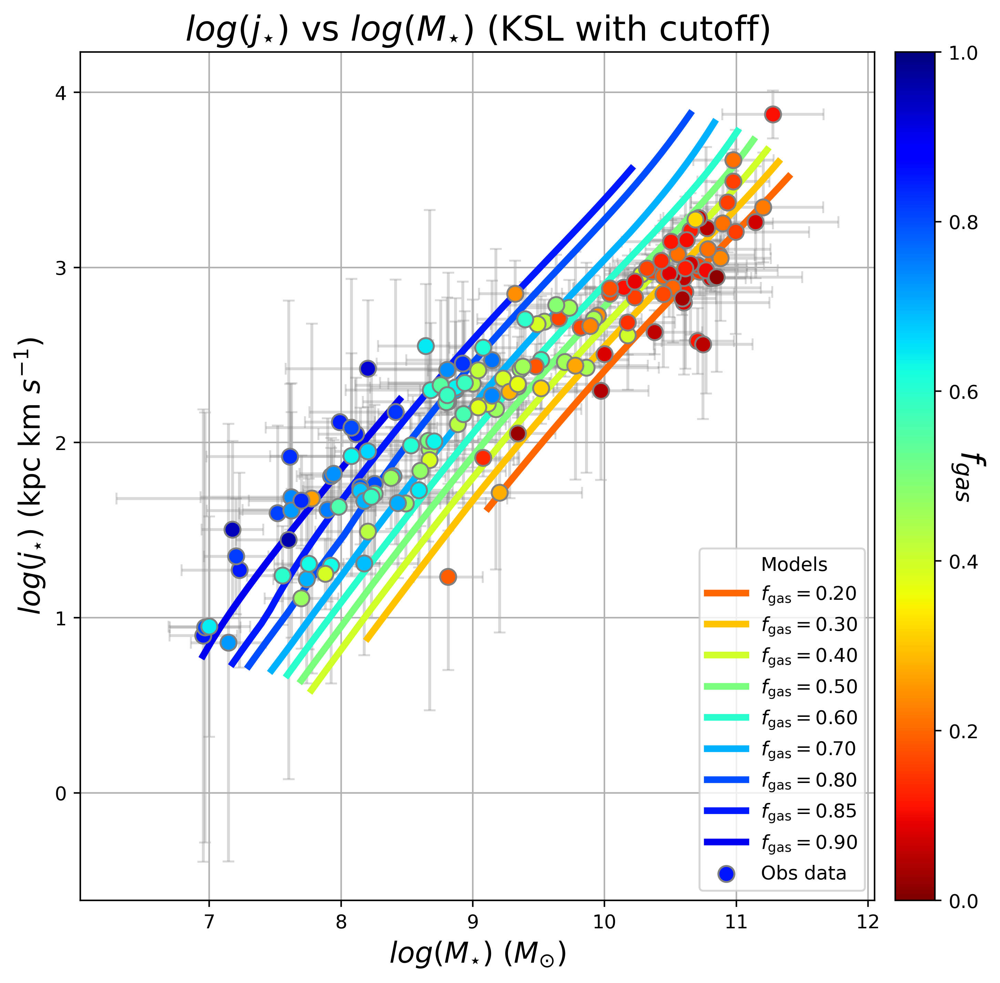

Execution time: 0.4231 seconds


In [142]:
# Final plot with j_star and M_star instead of j_bar and M_bar

f_gas_array_10_50_cutoff_ksl = np.nan_to_num(np.loadtxt('../data/data9_JAX_aKSL/final_f_gas_cutoff_ksl.txt'))
j_star_array_10_50_cutoff_ksl = np.nan_to_num(np.loadtxt('../data/data9_JAX_aKSL/final_j_star_cutoff_ksl.txt'))
M_star_array_cutoff_ksl = np.nan_to_num(np.loadtxt('../data/data9_JAX_aKSL/final_Mstar_grid_cutoff_ksl.txt'))
log_M_star_array = np.linspace(7,11.5,50)
t_acc_array = np.array([1,2,3,10,25,-25,-10,-3,-2,-1])

# use the MODEL arrays for interpolation (not the fixed log_M_star_array grid)
log_j_star_array_10_50 = np.log10(
    j_star_array_10_50_cutoff_ksl,
    where=(j_star_array_10_50_cutoff_ksl > 0),
    out=np.full_like(j_star_array_10_50_cutoff_ksl, np.nan)
)

f_to_logMstar = []
f_to_logjstar = []
for i in range(f_gas_array_10_50_cutoff_ksl.shape[0]):
    m = (np.isfinite(f_gas_array_10_50_cutoff_ksl[i]) &
         np.isfinite(M_star_array_cutoff_ksl[i]) & (M_star_array_cutoff_ksl[i] > 0) &
         np.isfinite(log_j_star_array_10_50[i]))
    if m.sum() < 2:
        f_to_logMstar.append(None); f_to_logjstar.append(None); continue

    # sort by f_gas and de-duplicate to keep x strictly increasing
    order = np.argsort(f_gas_array_10_50_cutoff_ksl[i, m])
    fg = f_gas_array_10_50_cutoff_ksl[i, m][order]
    xM = np.log10(M_star_array_cutoff_ksl[i, m][order])
    yJ = log_j_star_array_10_50[i, m][order]
    uniq, uidx = np.unique(fg, return_index=True)
    fg = uniq
    x = xM[uidx]
    y = yJ[uidx]

    f_to_logMstar.append(spl.interp1d(fg, x, kind='linear', bounds_error=False, fill_value=np.nan))
    f_to_logjstar.append(spl.interp1d(fg, y, kind='linear', bounds_error=False, fill_value=np.nan))

cmap = cm.jet_r
mpl.rc("image", cmap="jet_r")
fig = figure(figsize=(8,8), dpi=400,  facecolor='w')
frame = fig.add_subplot(1,1,1)

#Model
frame.plot([], [], ' ', label="Models")

divider = make_axes_locatable(frame)
colbarframe = divider.append_axes("right", size="5%", pad=0.15)

f_gas_values = [0.05,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.85,0.9]
for fg, col in zip(f_gas_values, cmap(f_gas_values)):
    # evaluate both x and y at the same f_gas
    xs = np.array([f(fg) if f is not None else np.nan for f in f_to_logMstar])
    ys = np.array([g(fg) if g is not None else np.nan for g in f_to_logjstar])
    m = np.isfinite(xs) & np.isfinite(ys)
    if m.sum() < 2: 
        continue
    order = np.argsort(xs[m])  # make the line monotonic in M*
    ax1 = frame.plot(xs[m][order], ys[m][order], lw=3.5, color=col, label=fr"$f_{{\rm gas}}={fg:.2f}$", zorder=2)

#Data
ax2 = frame.scatter(obs_log_Mstar, obs_log_jstar, label="Obs data", marker="o",
                    facecolors=cmap(obs_fgas_but_for_stars_and_gas), edgecolors="grey", s=70, zorder=4)
frame.errorbar(obs_log_Mstar, obs_log_jstar, xerr=obs_log_Mstar_errors, yerr=obs_log_jstar_errors,
               fmt=' ', ecolor='grey', capsize=3, alpha=0.3, zorder=0)
cbar = fig.colorbar(ax2, cax=colbarframe)
cbar.set_label(r"$f_{gas}$", rotation=270, fontsize=17)

frame.set_title(r"$log(j_{\star})$ vs $log(M_{\star})$ (KSL with cutoff)", fontsize = 18)
frame.set_xlabel(r"$log(M_{\star})$ $(M_{\odot})$", fontsize = 15)
frame.set_ylabel(r"$log(j_{\star})$ (kpc km $s^{-1}$)", fontsize = 15)
frame.legend()
frame.grid()
show()
fig.savefig('../outputs/graphs10_JAX_aKSL/log j_star vs log_M_star with Pavel (interpolated, cutoff KSL, no legend).png')


### Gas Relation

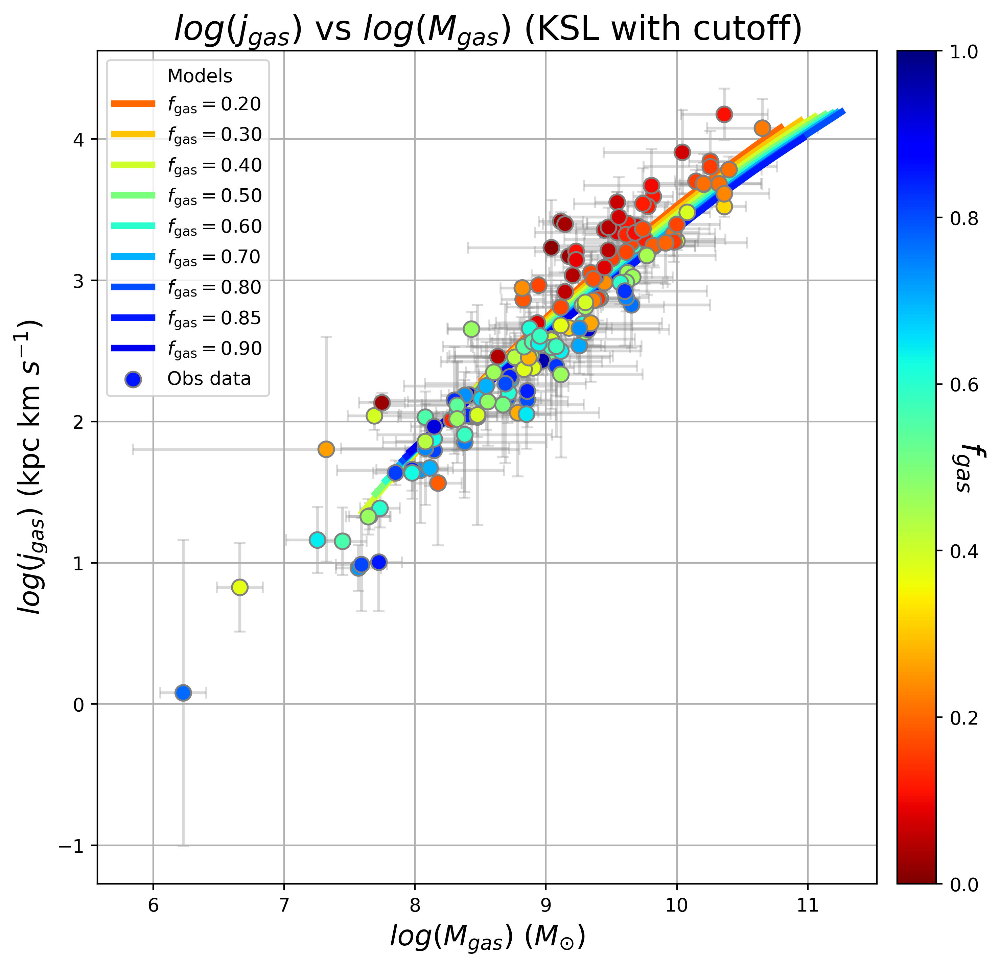

Execution time: 0.4244 seconds


In [143]:
# Final plot with j_star and M_star instead of j_bar and M_bar

f_gas_array_10_50_cutoff_ksl = np.nan_to_num(np.loadtxt('../data/data9_JAX_aKSL/final_f_gas_cutoff_ksl.txt'))
j_gas_array_10_50_cutoff_ksl = np.nan_to_num(np.loadtxt('../data/data9_JAX_aKSL/final_j_gas_cutoff_ksl.txt'))
M_gas_array_cutoff_ksl = np.nan_to_num(np.loadtxt('../data/data9_JAX_aKSL/final_Mgas_grid_cutoff_ksl.txt'))
t_acc_array = np.array([1,2,3,10,25,-25,-10,-3,-2,-1])

# use the MODEL arrays for interpolation (not the fixed log_M_star_array grid)
log_j_gas_array_10_50 = np.log10(
    j_gas_array_10_50_cutoff_ksl,
    where=(j_gas_array_10_50_cutoff_ksl > 0),
    out=np.full_like(j_gas_array_10_50_cutoff_ksl, np.nan)
)

f_to_logMgas = []
f_to_logjgas = []
for i in range(f_gas_array_10_50_cutoff_ksl.shape[0]):
    m = (np.isfinite(f_gas_array_10_50_cutoff_ksl[i]) &
         np.isfinite(M_gas_array_cutoff_ksl[i]) & (M_gas_array_cutoff_ksl[i] > 0) &
         np.isfinite(log_j_gas_array_10_50[i]))
    if m.sum() < 2:
        f_to_logMgas.append(None); f_to_logjgas.append(None); continue

    # sort by f_gas and de-duplicate to keep x strictly increasing
    order = np.argsort(f_gas_array_10_50_cutoff_ksl[i, m])
    fg = f_gas_array_10_50_cutoff_ksl[i, m][order]
    xM = np.log10(M_gas_array_cutoff_ksl[i, m][order])
    yJ = log_j_gas_array_10_50[i, m][order]
    uniq, uidx = np.unique(fg, return_index=True)
    fg = uniq
    x = xM[uidx]
    y = yJ[uidx]

    f_to_logMgas.append(spl.interp1d(fg, x, kind='linear', bounds_error=False, fill_value=np.nan))
    f_to_logjgas.append(spl.interp1d(fg, y, kind='linear', bounds_error=False, fill_value=np.nan))

cmap = cm.jet_r
mpl.rc("image", cmap="jet_r")
fig = figure(figsize=(8,8), dpi=400, facecolor='w')
frame = fig.add_subplot(1,1,1)

#Model
frame.plot([], [], ' ', label="Models")

divider = make_axes_locatable(frame)
colbarframe = divider.append_axes("right", size="5%", pad=0.15)

f_gas_values = [0.05,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.85,0.9]
for fg, col in zip(f_gas_values, cmap(f_gas_values)):
    # evaluate both x and y at the same f_gas
    xs = np.array([f(fg) if f is not None else np.nan for f in f_to_logMgas])
    ys = np.array([g(fg) if g is not None else np.nan for g in f_to_logjgas])
    m = np.isfinite(xs) & np.isfinite(ys)
    if m.sum() < 2: 
        continue
    order = np.argsort(xs[m])  # make the line monotonic in M*
    ax1 = frame.plot(xs[m][order], ys[m][order], lw=3.5, color=col, label=fr"$f_{{\rm gas}}={fg:.2f}$", zorder=2)

#Data
ax2 = frame.scatter(obs_log_Mgas, obs_log_jgas, label="Obs data", marker="o", facecolors=cmap(obs_fgas_but_for_stars_and_gas), edgecolors="grey", s=70, zorder=4)
frame.errorbar(obs_log_Mgas, obs_log_jgas, xerr=obs_log_Mgas_errors, yerr=obs_log_jgas_errors, fmt = ' ', ecolor = 'grey', capsize = 3, alpha=0.3, zorder=0)
cbar = fig.colorbar(ax2, cax=colbarframe)
cbar.set_label(r"$f_{gas}$", rotation=270, fontsize=17)

frame.set_title(r"$log(j_{gas})$ vs $log(M_{gas})$ (KSL with cutoff)", fontsize = 18)
frame.set_xlabel(r"$log(M_{gas})$ $(M_{\odot})$", fontsize = 15)
frame.set_ylabel(r"$log(j_{gas})$ (kpc km $s^{-1}$)", fontsize = 15)
frame.legend()
frame.grid()
show()
fig.savefig('../outputs/graphs10_JAX_aKSL/log j_gas vs log_M_gas with Pavel (interpolated, cutoff KSL, no legend).png')